In [1]:
# load packages and functions
suppressMessages(library(data.table))
suppressMessages(library(dplyr))
suppressMessages(library(ggplot2))
suppressMessages(library(ggpointdensity))
suppressMessages(library(ggrepel))
suppressMessages(library(ggsci))
suppressMessages(library(ggthemes))
suppressMessages(library(magrittr))
suppressMessages(library(patchwork))
suppressMessages(library(RColorBrewer))
suppressMessages(library(stringr))
suppressMessages(library(tidyverse))
suppressMessages(library(viridis))
suppressMessages(library(ComplexHeatmap))

selected_markers<- c("CD45",
                     "CD172ab",
                     "CD8a",
                     "CD20",
                     "CD4",
                     "CD3",
                     "CD56",
                     "GNLY",
                     "KIR2DS1",
                     "CD2",
                     "DAP12",
                     "NKG2C",
                     "SH2D1A",
                     "CD7",
                     "GZMA",
                     "GZMK",
                     "2B4",
                     "TCRVd1",
                     "PSGL-1",
                     "CD69",
                     "TCRgd",
                     "EOMES",
                     "CD8b",
                     "CD16",
                     "CD39",
                     "PLZF",
                     "NKp30",
                     "MR-1-tet",
                     "NKp80",
                     "4-1BB",
                     "CXCR6",
                     "KIR2DS2",
                     "CD107a",
                     "GZMB",
                     "NKp46",
                     "CD3z",
                     "iNKT",
                     "TCRVd2",
                     "NKG2D",
                     "TCRab",
                     "Ki67",
                     "Tbet",
                     "Perforin",
                     "CD57",
                     "HLA-DR",
                     "SLAMF6",
                     "CD38",
                     "CD11b")

# set parameters
prop = 1
n_min = 10000
frac = 0.90
n_neighbors=30
min_dist=0.01
resolution_list=0.3

# cluster annotation
cluster_df = read.table("/projects/jinamo@xsede.org/cytof/data/cluster_annotation.txt",sep="\t",header=TRUE) %>%
    dplyr::filter(cell=="NK") %>%
    dplyr::select(-cell) %>%
    dplyr::mutate(cluster = as.character(cluster))


In [2]:
exp_ds <- readRDS(file = "/projects/jinamo@xsede.org/cytof/data/NK_cells/NK_downsampled_Cells.rds")

`summarise()` has grouped output by 'subject_id__time'. You can override using
the `.groups` argument.


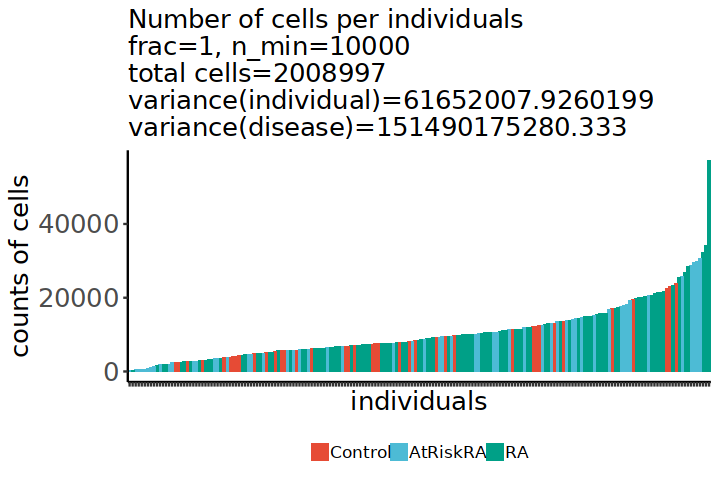

In [3]:
tmp = cbind(
  exp_ds %>%
    dplyr::group_by(subject_id__time) %>%
    dplyr::summarise(cell_counts = n()) %>%
    dplyr::summarise(Total_cell_count=sum(cell_counts), ind_variance=var(cell_counts)),
  exp_ds %>%
    dplyr::group_by(disease) %>%
    dplyr::summarise(cell_counts = n()) %>%
    dplyr::summarise(disease_variance=var(cell_counts))
)
options(repr.plot.height = 4, repr.plot.width = 6)
exp_ds %>%
       dplyr::group_by(subject_id__time, disease) %>%
       dplyr::summarise(cell_counts = n()) %>%
       dplyr::ungroup() %>%
       dplyr::arrange(desc(cell_counts)) %>%
       ggplot() + 
       geom_bar(aes(reorder(subject_id__time,cell_counts),cell_counts, fill = disease), stat = 'identity') + 
       theme_classic() +
       scale_fill_npg() +
       # facet_grid( ~ disease) + 
       theme(strip.text.x=element_text(size=15, color="black", face="bold"),
             strip.text.y=element_text(size=15, color="black", face="bold"),
             legend.position = "bottom",
             plot.title = element_text(size=15),
             axis.title.x = element_text(size=15),
             axis.title.y = element_text(size =15),
             axis.text.y = element_text(size = 15),
             axis.text.x = element_blank(),
             legend.text =  element_text(size = 10), 
             legend.key.size = grid::unit(0.8, "lines"),
             legend.title = element_text(size = 0, hjust = 0)) +
       labs(title = paste0("Number of cells per individuals\nfrac=", prop, ", n_min=",n_min, "\ntotal cells=", tmp$Total_cell_count, "\nvariance(individual)=",tmp$ind_variance,"\nvariance(disease)=",tmp$disease_variance),
            x = 'individuals',
            y = "counts of cells") 

In [4]:
exp_ds %>%
       dplyr::group_by(disease,time_point) %>%
       dplyr::summarise(cell_counts = n())

`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.


disease,time_point,cell_counts
<fct>,<chr>,<int>
Control,V0,344966
AtRiskRA,V0,562910
RA,V0,668164
RA,V1,183761
RA,V2,249196


In [5]:
pca_res <- readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/NK_cells/PCA_embeddings_Prop",prop,"_Nmin",n_min,"_topVar",frac,".rds"))
batch_fl = readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/NK_cells/meta_Prop",prop,"_Nmin",n_min,".rds"))

# check the data
print(dim(pca_res$x))
print(head(pca_res$x))
print(dim(batch_fl))
print(head(batch_fl))

[1] 2008997      20
             PC1        PC2        PC3        PC4         PC5        PC6
[1,]   0.6169450  3.6122601  0.6528327  1.7376914  0.04272655  0.0443210
[2,]  -0.9169489  1.0914072 -0.4799760  2.5551236 -0.27398270  0.9641634
[3,]   1.1174305 -2.4491984 -1.2133028 -0.4161785  0.23182771 -2.1223101
[4,]   2.8252163 -0.5415897 -0.7134585 -0.7919836 -0.37627298 -1.8735627
[5,] -10.4777732 -1.2798572 -0.2623635 -0.1920502  0.02227378  0.5458945
[6,]  -2.1663073  4.3731540  3.9661274 -1.0389516  0.77886554  0.5035242
             PC7        PC8        PC9       PC10        PC11        PC12
[1,] -0.06483993 -1.0776344  0.9989027 -1.0379809  0.00920761  2.10405051
[2,]  0.69834046 -0.7205428  0.4502782 -1.2752492 -0.29413962 -0.08761463
[3,] -0.62061130 -0.5951878 -0.2328762 -1.7767243 -0.57372612 -0.77590237
[4,]  0.22015856 -0.6957921  0.1440859  0.8191745  0.19330916 -0.14978599
[5,] -0.37846971 -0.7386456 -2.0329378 -0.1251721 -2.04248740 -1.69350702
[6,]  0.39769890 -0.29529

Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation ideoms with `aes()`”


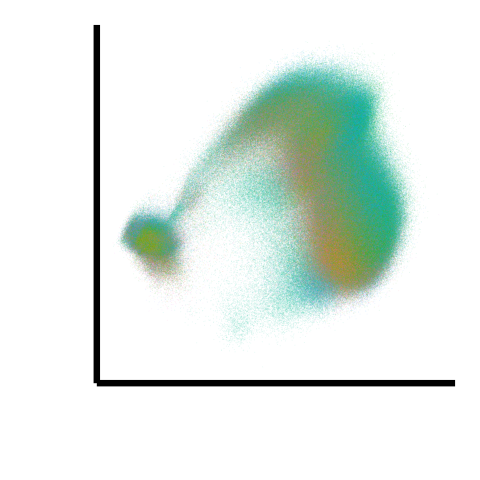

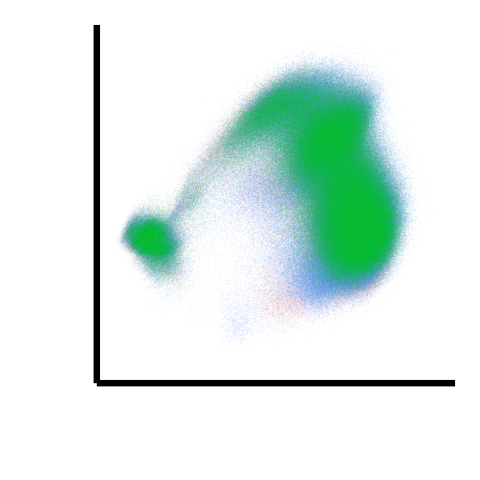

In [6]:
options(repr.plot.height = 4, repr.plot.width = 4)
ggplot() +
    geom_point(
        data = data.frame(pca_res$x[,c("PC1","PC2")],batch_fl),
        mapping = aes_string(x = "PC1", y = "PC2", color = "batch"),
        size = 0.001, stroke = 0, shape = 16, alpha = 0.1
    ) +
    #scale_fill_manual(values = meta_colors$batch, name = "") +
   # facet_wrap( ~ batch, scales = "free") +
    labs(
        x = "",
        y = ""
    ) +
    theme_classic(base_size = 30) +
    theme(
        legend.position = "none",
        axis.text = element_blank(),
        axis.ticks = element_blank(),
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=30, face = "italic")
    )

ggplot() +
    geom_point(
        data = data.frame(pca_res$x[,c("PC1","PC2")],batch_fl),
        mapping = aes_string(x = "PC1", y = "PC2", color = "condition"),
        size = 0.001, stroke = 0, shape = 16, alpha = 0.1
    ) +
    #scale_fill_manual(values = meta_colors$batch, name = "") +
   # facet_wrap( ~ batch, scales = "free") +
    labs(
        x = "",
        y = ""
    ) +
    theme_classic(base_size = 30) +
    theme(
        legend.position = "none",
        axis.text = element_blank(),
        axis.ticks = element_blank(),
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=30, face = "italic")
    )

In [7]:
harmony_embeddings_all <- readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/NK_cells/harmony_embeddings_Prop",prop,"_Nmin",n_min,"_topVar",frac,".rds"))
batch_fl = readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/NK_cells/meta_Prop",prop,"_Nmin",n_min,".rds"))

In [8]:
print(head(harmony_embeddings_all))
print(dim(harmony_embeddings_all))

            PC1        PC2         PC3        PC4        PC5        PC6
[1,]  0.8614383  3.0771709 -0.01068499  1.8625203 -0.2126193  0.7134493
[2,] -0.5711622  0.4693408 -1.18417984  2.6959312 -0.6031538  1.6786055
[3,]  1.1714156 -3.0251154 -1.44947217 -0.2167274  0.3356429 -1.2744906
[4,]  2.8506681 -1.1739754 -0.93697315 -0.5365265 -0.2598511 -1.0964917
[5,] -9.4796619 -1.0232450  0.19887635 -0.4847989 -0.1856567  1.1415843
[6,] -2.1103429  4.1444392  3.73709400 -1.1258567  0.5318460  0.9195431
             PC7         PC8         PC9       PC10        PC11       PC12
[1,] -0.09922511 -0.72961996  0.74124135 -0.7064290  0.28906523  1.5755821
[2,]  0.70941007 -0.41596683  0.25202770 -0.9028772  0.01585095 -0.5116204
[3,] -0.63340727 -0.24185427 -0.46980066 -1.5885151 -0.33761848 -1.1366521
[4,]  0.13724892 -0.24731198 -0.01220328  0.9152224  0.44441824 -0.5356650
[5,] -0.47445881 -0.41846122 -1.04235340 -0.4718565 -1.80746853 -1.0062413
[6,]  0.45995077  0.01035203  2.69763211  0.56

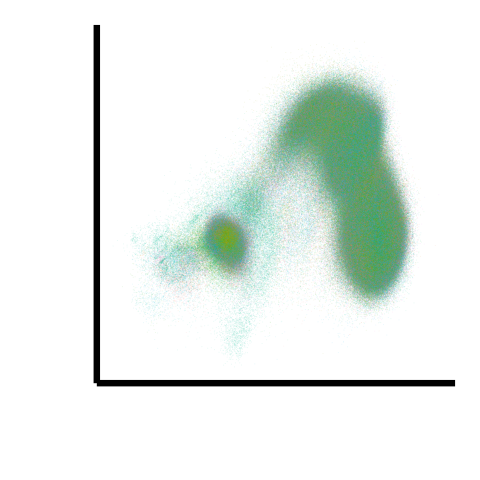

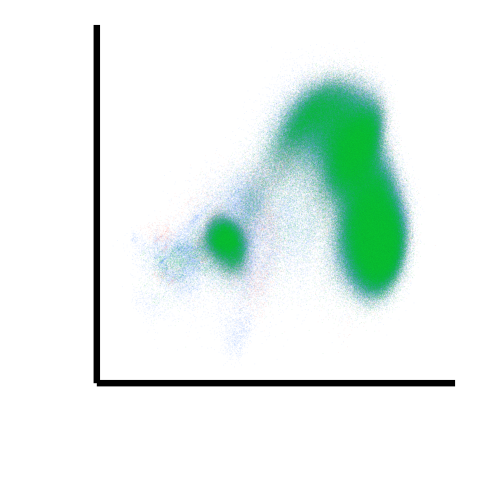

In [9]:

options(repr.plot.height = 4, repr.plot.width = 4)
ggplot() +
    geom_point(
        data = data.frame(harmony_embeddings_all,batch_fl),
        mapping = aes_string(x = "PC1", y = "PC2", color = "batch"),
        size = 0.001, stroke = 0, shape = 16, alpha = 0.1
    ) +
    #scale_fill_manual(values = meta_colors$batch, name = "") +
   # facet_wrap( ~ batch, scales = "free") +
    labs(
        x = "",
        y = ""
    ) +
    theme_classic(base_size = 30) +
    theme(
        legend.position = "none",
        axis.text = element_blank(),
        axis.ticks = element_blank(),
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=30, face = "italic")
    )

ggplot() +
    geom_point(
        data = data.frame(harmony_embeddings_all,batch_fl),
        mapping = aes_string(x = "PC1", y = "PC2", color = "condition"),
        size = 0.001, stroke = 0, shape = 16, alpha = 0.1
    ) +
    #scale_fill_manual(values = meta_colors$batch, name = "") +
   # facet_wrap( ~ batch, scales = "free") +
    labs(
        x = "",
        y = ""
    ) +
    theme_classic(base_size = 30) +
    theme(
        legend.position = "none",
        axis.text = element_blank(),
        axis.ticks = element_blank(),
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=30, face = "italic")
    )

`summarise()` has grouped output by 'key'. You can override using the `.groups`
argument.


key,group,median
<chr>,<chr>,<dbl>
Race,after,2.866032
Race,before,2.332523
Site,after,4.143434
Site,before,3.110327
batch,after,6.889284
batch,before,4.135118
condition,after,2.224028
condition,before,1.985883
individual,after,9.990599


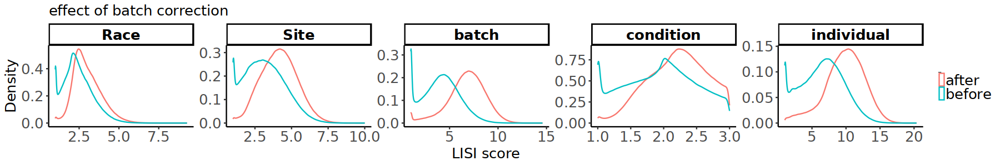

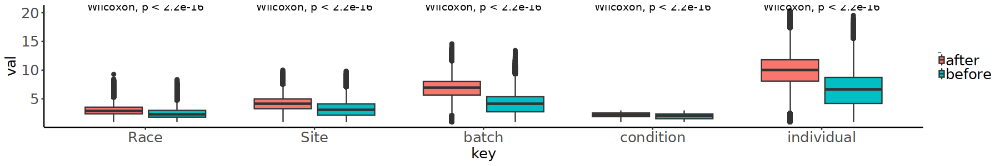

In [10]:
# using PC1-20
LISI_df = rbind(
    readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/NK_cells/LISI_harmony.rds")) %>%
        dplyr::mutate(group = "after"),
    readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/NK_cells/LISI_PCA.rds")) %>%
        dplyr::mutate(group = "before")
    ) %>%
    dplyr::mutate(key = ifelse(key=="OmiqFileIndex", "individual", key))

LISI_df %>%
    dplyr::group_by(key,group) %>%
    dplyr::summarize(median = median(val))

options(repr.plot.height = 2.5, repr.plot.width = 15)
ggplot(LISI_df) +
      geom_density(
        aes(x  = val, color = group) 
      ) +
      #   scale_x_continuous(limits = c(1, 15))+
      labs(
        title = "effect of batch correction",
        x = "LISI score",
        y = "Density"
      ) +
      facet_wrap( ~ key, scales = "free", ncol = 5) +
      theme_classic() +
      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "right",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size = 15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) 

LISI_df %>% 
  ggplot(aes(x=key, y=val, fill=group)) +
  geom_boxplot() +
  ggpubr::stat_compare_means(method= "wilcox.test") +
  theme_classic() +
      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "right",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size = 15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) 


`summarise()` has grouped output by 'key'. You can override using the `.groups`
argument.


key,group,median
<chr>,<chr>,<dbl>
Race,after,3.152042
Race,before,3.104865
Site,after,4.984406
Site,before,4.734797
batch,after,9.400567
batch,before,8.471293
condition,after,2.326828
condition,before,2.296725
individual,after,15.434403


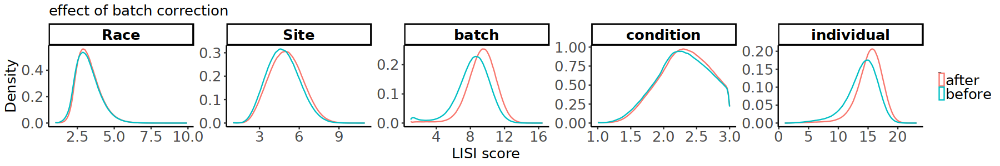

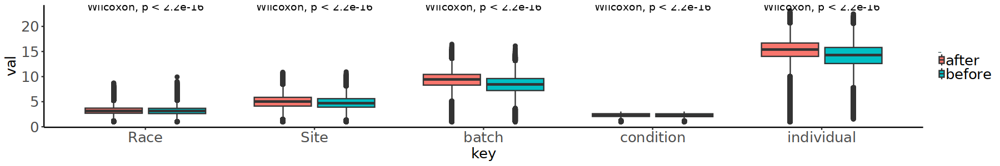

In [11]:
# using PC1-2
LISI_df = rbind(
    readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/NK_cells/LISI_harmony_PC12.rds")) %>%
        dplyr::mutate(group = "after"),
    readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/NK_cells/LISI_PCA_PC12.rds")) %>%
        dplyr::mutate(group = "before")
    ) %>%
    dplyr::mutate(key = ifelse(key=="OmiqFileIndex", "individual", key))

LISI_df %>%
    dplyr::group_by(key,group) %>%
    dplyr::summarize(median = median(val))

options(repr.plot.height = 2.5, repr.plot.width = 15)
ggplot(LISI_df) +
      geom_density(
        aes(x  = val, color = group) 
      ) +
      #   scale_x_continuous(limits = c(1, 15))+
      labs(
        title = "effect of batch correction",
        x = "LISI score",
        y = "Density"
      ) +
      facet_wrap( ~ key, scales = "free", ncol = 5) +
      theme_classic() +
      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "right",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size = 15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) 

LISI_df %>% 
  ggplot(aes(x=key, y=val, fill=group)) +
  geom_boxplot() +
  ggpubr::stat_compare_means(method= "wilcox.test") +
  theme_classic() +
      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "right",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size = 15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) 

In [12]:
# UMAP visualization
umap_res <- readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/NK_cells/umap_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
print(dim(umap_res))
print(head(umap_res))
print(table(umap_res$res_cell))
umap_res$res_cell = factor(umap_res$res_cell, levels=sort(as.integer(unique(umap_res$res_cell))))
umap_res$res_cell

[1] 2008997       5
       UMAP1     UMAP2 disease batch res_cell
1 -1.0852492 -5.609421 Control    15        1
2 -0.7627611 -4.311282 Control    15        1
3 -3.9263222  4.287653 Control    15        2
4 -3.3761160  3.396924 Control    15        0
5 12.2806943 -2.012380 Control    15        8
6  0.3788578 -8.128912 Control    15        6

     0      1     10    100    101    102    103    104    105    106    107 
692215 350435  30044      1      1      1      1      1      1      1      1 
   108    109     11    110    111    112    113    114    115    116    117 
     1      1  12997      1      1      1      1      1      1      1      1 
   118    119     12    120    121    122    123    124    125    126    127 
     1      1  11460      1      1      1      1      1      1      1      1 
   128    129     13    130    131    132    133    134    135    136    137 
     1      1  10133      1      1      1      1      1      1      1      1 
   138    139     14    140    14

[1] 1  1  2  0  8  6  8  8  5  3  14 6  1  5  0  1  0  8  1  7  7  0  0  4 
   [25] 1  5  0  1  12 8  0  8  12 14 4  6  8  1  2  0  9  6  0  1  8  8  1  0 
   [49] 14 2  4  4  1  1  0  0  10 4  0  2  8  8  0  0  6  5  8  0  0  0  6  0 
   [73] 1  1  8  2  0  8  4  4  0  6  4  1  12 5  5  0  14 4  1  6  7  1  8  1 
   [97] 0  0  0  6  2  8  0  8  5  8  6  5  6  0  2  1  7  8  1  15 1  2  4  8 
  [121] 6  1  0  8  0  1  1  1  0  16 1  8  1  6  14 4  8  8  0  12 1  1  8  4 
  [145] 0  1  8  0  1  1  8  1  5  1  2  5  8  1  0  8  8  0  5  8  1  2  0  2 
  [169] 7  0  6  0  4  1  8  0  3  1  5  8  2  1  0  7  8  0  14 3  2  8  4  0 
  [193] 6  14 6  6  4  0  4  0  0  0  1  1  1  6  5  0  7  3  2  2  8  2  2  0 
  [217] 0  0  1  0  8  0  1  1  8  2  0  1  6  4  5  1  6  2  0  0  0  0  1  3 
  [241] 0  1  1  0  2  1  0  1  0  0  1  1  0  1  4  3  2  7  1  4  6  3  1  1 
  [265] 0  0  0  1  8  0  0  8  8  1  6  3  8  6  14 3  8  7  1  6  0  2  7  4 
  [289] 3  1  0  1  0  8  0  9  2  6  7  0  7  0  5  1  5  3  3  8  0  2  5  2 
  [313] 0  1  0  8  5  0  0  6  0  4  0  1  8  1  5  2  0  4  8  0  0  7  7  0 
  [337] 2  1  0  1  1  0  0  8  1  10 7  8  1  0  1  8  0  3  1  1  0  6  6  2 
  [361] 0  6  1  2  0  3  1  4  1  3  3  4  8  6  0  1  2  6  2  3  0  8  1  7 
  [385] 0  8  2  0  14 8  2  1  8  0  1  1  4  8  2  2  1  8  1  8  0  2  5  0 
  [409] 0  6  0  0  0  0  8  1  14 0  1  0  0  1  6  9  1  10 1  6  1  0  1  4 
  [433] 1  8  7  3  0  0  4  1  0  12 8  2  6  1  0  2  1  6  3  1  3  3  0  0 
  [457] 3  1  1  6  6  2  1  6  1  8  6  4  0  0  4  8  2  7  4  0  8  5  1  5 
  [481] 0  9  6  0  1  1  0  1  5  1  1  0  2  0  0  8  1  8  5  8  2  6  0  0 
  [505] 14 2  0  0  6  3  8  8  0  0  0  0  2  0  0  0  11 0  0  2  0  1  2  0 
  [529] 1  7  8  8  8  4  3  8  0  1  1  8  1  5  1  0  0  1  3  2  1  6  8  2 
  [553] 0  1  4  3  0  8  7  0  0  4  5  10 0  0  0  3  5  2  6  0  8  10 2  0 
  [577] 1  10 5  0  1  1  5  0  4  8  8  0  0  8  0  6  2  6  0  8  0  8  8  1 
  [601] 1  1  2  1  1  1  0  2  1  4  3  0  1  1  12 0  15 0  7  9  1  1  6  9 
  [625] 5  0  2  0  0  8  1  7  5  6  0  0  2  8  0  5  2  4  4  0  8  1  0  2 
  [649] 1  15 1  0  6  3  1  1  1  1  14 5  0  0  0  5  0  1  16 0  2  2  1  0 
  [673] 0  1  2  14 0  7  6  0  7  1  0  8  1  2  4  0  1  4  4  2  2  6  2  1 
  [697] 0  4  8  1  0  3  1  0  8  4  0  8  0  6  8  4  0  1  2  0  1  0  0  9 
  [721] 5  8  1  0  4  0  1  1  0  7  8  2  0  8  1  0  7  0  1  0  0  0  14 0 
  [745] 1  0  2  0  1  8  2  0  4  8  6  12 3  8  0  0  0  1  8  3  1  12 2  0 
  [769] 1  0  6  0  0  1  6  0  1  2  1  1  7  1  2  2  1  8  3  2  6  1  4  8 
  [793] 8  7  0  8  0  8  2  6  5  8  0  0  8  8  2  6  11 8  7  1  2  8  0  0 
  [817] 0  1  15 6  0  3  1  8  6  2  1  3  8  1  0  1  0  0  1  2  0  1  14 1 
  [841] 1  8  5  0  4  1  2  3  8  8  0  1  0  8  0  3  1  5  4  1  8  0  2  4 
  [865] 5  0  1  7  1  0  6  0  2  0  5  6  6  0  8  1  0  0  0  0  2  1  1  1 
  [889] 2  0  1  6  3  2  2  1  6  0  1  0  6  8  2  8  1  0  5  0  8  6  0  0 
  [913] 5  0  8  3  1  0  1  0  2  6  1  3  10 0  1  1  7  2  8  8  6  1  14 9 
  [937] 6  12 1  1  1  0  5  8  8  3  0  0  3  1  1  8  6  1  1  0  1  0  15 11
  [961] 0  0  1  1  11 11 7  2  3  8  0  1  3  0  1  8  0  6  4  7  1  1  5  1 
  [985] 1  0  0  6  2  0  6  8  6  8  8  6  1  0  8  0  1  0  0  2  5  6  3  6 
 [1009] 1  4  5  0  0  8  0  0  5  0  0  9  2  7  7  0  1  1  0  3  1  1  0  1 
 [1033] 0  2  0  2  6  0  0  12 0  8  2  1  1  5  0  1  4  2  0  0  1  0  7  4 
 [1057] 7  0  2  4  4  4  5  5  2  3  14 1  2  1  1  0  2  0  1  0  0  8  8  1 
 [1081] 0  1  11 1  15 5  6  0  2  2  1  8  12 6  8  0  8  8  1  8  5  0  8  0 
 [1105] 14 7  5  1  6  15 7  5  1  8  1  12 5  2  0  8  1  2  1  5  1  2  8  5 
 [1129] 2  2  1  0  0  2  1  0  3  6  4  1  0  0  6  0  0  7  1  0  3  8  4  6 
 [1153] 0  0  0  0  7  1  8  5  8  4  4  2  1  6  0  1  3  1  0  0  6  4  1  8 
 [1177] 2  11 8  5  2  0  4  8  1  9  2  4  0  0  7  0  15 6  4  6  3  1  0  1 
 [12

In [13]:
# remove clusters less than cut off
min_cell_cluster = 30
clu = umap_res %>%
    dplyr::group_by(res_cell) %>%
    dplyr::summarize(count = dplyr::n()) %>%
    dplyr::arrange(count) %>%
    dplyr::filter(count > min_cell_cluster) %>%
    .$res_cell %>%
    unique()
clu_logi = umap_res$res_cell %in% clu
print(dim(umap_res[clu_logi,]))
print(table(umap_res[clu_logi,]$res_cell))
print(length(unique(umap_res[clu_logi,]$res_cell)))
umap_res = umap_res[clu_logi,]

[1] 2008702       5

     0      1      2      3      4      5      6      7      8      9     10 
692215 350435 286737 136266 129964 105374  98732  52073  37646  30182  30044 
    11     12     13     14     15     16     17     18     19     20     21 
 12997  11460  10133   9971   7328   7145      0      0      0      0      0 
    22     23     24     25     26     27     28     29     30     31     32 
     0      0      0      0      0      0      0      0      0      0      0 
    33     34     35     36     37     38     39     40     41     42     43 
     0      0      0      0      0      0      0      0      0      0      0 
    44     45     46     47     48     49     50     51     52     53     54 
     0      0      0      0      0      0      0      0      0      0      0 
    55     56     57     58     59     60     61     62     63     64     65 
     0      0      0      0      0      0      0      0      0      0      0 
    66     67     68     69     70     71  

In [14]:
# Find cluster center
cluster_center <- umap_res %>%
  dplyr::group_by(res_cell) %>%
  dplyr::summarise_at(vars(UMAP1, UMAP2), dplyr::funs(median(., na.rm=TRUE)))
cluster_center <- as.data.frame(cluster_center)
cluster_center$res_cell <- as.character(cluster_center$res_cell)

Warning message:
“`funs()` was deprecated in dplyr 0.8.0.
ℹ Please use a list of either functions or lambdas:

# Simple named list: list(mean = mean, median = median)

# Auto named with `tibble::lst()`: tibble::lst(mean, median)

# Using lambdas list(~ mean(., trim = .2), ~ median(., na.rm = TRUE))”


In [15]:
# meta data

batch_fl = readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/NK_cells/meta_Prop",prop,"_Nmin",n_min,".rds"))
# batch_fl = readRDS(file=paste0("/scratch/alpine/jinamo@xsede.org/NK_cells/meta_Prop",prop,"_Nmin",n_min,".rds"))
batch_fl$subject_id <- stringr::str_split(batch_fl$OmiqFileIndex, pattern="_", simplify=TRUE)[,2] %>% 
  stringr::str_split(., pattern="\\-V", simplify=TRUE) %>%
  as.data.frame() %>%
  .[,1] %>%
  gsub("-","_",.)
batch_fl = batch_fl[clu_logi,]
# batch_fl = batch_fl[!rem_clu,]
umap_res$subject_id = batch_fl$subject_id
umap_res$time_point = batch_fl$time_point

meta<- read.table("/projects/jinamo@xsede.org/cytof/data/RA_AtRiskRA_Control_meta.txt",sep="\t",header=TRUE, na.strings=c("","NA")) %>%
    dplyr::mutate(age_at_biopsy = as.integer(age_at_biopsy),
                  diagnosis = factor(diagnosis, levels=c("Control","AtRiskRA","RA")))
meta = merge(umap_res,meta,by="subject_id")
meta = meta[order(match(meta$subject_id, umap_res$subject_id)),]
all(meta$subject_id == umap_res$subject_id)

meta_add = read.table("/projects/jinamo@xsede.org/cytof/data/meta_clinical_RA.txt", header = TRUE, sep = "\t") %>%
  dplyr::mutate(CDAI = as.numeric(CDAI),
                subject_id = gsub("-","_",subject_id),
                treatment = dplyr::case_when(
                  treatment == "1" ~ "naive",
                  treatment == "2" ~ "MTX failure",
                  treatment == "3" ~ "TNF failure",
                  treatment == "4" ~ "OA"
                )) %>%
  dplyr::select(-c(sex))
meta_add = dplyr::left_join(umap_res,meta_add,by="subject_id")

meta_total = read.csv("/projects/jinamo@xsede.org/cytof/data/Total_Metadata.csv") %>%
    dplyr::mutate(subject_id = gsub("-","_",Patient)) %>%
    dplyr::distinct(subject_id,Site,Race)
meta_total = meta_total[!(is.na(meta_total$Race) | meta_total$Race==""), ]
meta_total = merge(umap_res,meta_total,by="subject_id")
meta_total = meta_total[order(match(meta_total$subject_id, umap_res$subject_id)),]
all(meta_total$subject_id == umap_res$subject_id)

umap_res$AtRisk = dplyr::case_when(
  meta$AMP_Group == "FDR" & meta$CCP == "Positive" ~ "FDR(+)/ACPA(+)",
  meta$AMP_Group == "GP" & meta$CCP == "Positive" ~ "FDR(-)/ACPA(+)",
  meta$AMP_Group == "FDR" & meta$CCP == "Negative" ~ "FDR(+)/ACPA(-)",
  meta$AMP_Group == "GP" & meta$CCP == "Negative" ~ "FDR(-)/ACPA(-)",
  umap_res$disease == "Control" ~ "Control",
  umap_res$disease == "RA" ~ "RA")
umap_res$AtRisk = factor(umap_res$AtRisk,levels=c("Control","FDR(-)/ACPA(-)","FDR(+)/ACPA(-)","FDR(-)/ACPA(+)","FDR(+)/ACPA(+)","RA"))
umap_res$disease = dplyr::case_when(
  umap_res$AtRisk == "FDR(+)/ACPA(+)" | umap_res$AtRisk == "FDR(-)/ACPA(+)" | umap_res$AtRisk == "FDR(+)/ACPA(-)" ~ "AtRiskRA",
  umap_res$AtRisk == "Control" | umap_res$AtRisk == "FDR(-)/ACPA(-)" ~ "Control",
  umap_res$AtRisk == "RA" ~ "RA")
umap_res$disease = factor(umap_res$disease,levels=c("Control","AtRiskRA","RA"))
umap_res$age_at_biopsy <- as.numeric(meta$age_at_biopsy)
umap_res$sex <- as.numeric(factor(meta$sex, c('female', 'male')))
umap_res$ethnicity <- as.numeric(factor(meta$ethnicity, c('not_hispanic', 'hispanic_latino')))
umap_res$AMP_Group <- as.numeric(factor(meta$AMP_Group, c('GP', 'FDR')))
umap_res$CCP <- dplyr::case_when(
    meta$CCP == 'Negative' ~ "at-risk CCP(-)", 
    meta$CCP == 'Positive' ~ "at-risk CCP(+)",
    umap_res$AtRisk == "Control" ~ "Control")
umap_res$CCP <- factor(umap_res$CCP,levels=c("Control","at-risk CCP(-)","at-risk CCP(+)"))
umap_res$CCP30_titer <- as.numeric(meta$CCP30_titer)
umap_res$CCP31_titer <- as.numeric(meta$CCP31_titer)
umap_res$RF <- as.numeric(factor(meta$RF, c('Negative', 'Positive')))
umap_res$RF_IgM_titer <- as.numeric(meta$RF_IgM_titer)
umap_res$RF_IgG_titer <- as.numeric(meta$RF_IgG_titer)
umap_res$RF_IgA_titer <- as.numeric(meta$RF_IgA_titer)
umap_res$Site = meta_total$Site
umap_res$Race = meta_total$Race

head(umap_res)
table(umap_res$time_point)
table(umap_res$AtRisk)
table(umap_res$disease)

Warning message in mask$eval_all_mutate(quo):
“NAs introduced by coercion”


[1] TRUE

[1] TRUE

,UMAP1,UMAP2,disease,batch,res_cell,subject_id,time_point,AtRisk,age_at_biopsy,sex,...,AMP_Group,CCP,CCP30_titer,CCP31_titer,RF,RF_IgM_titer,RF_IgG_titer,RF_IgA_titer,Site,Race
,<dbl>,<dbl>,<fct>,<fct>,<fct>,<chr>,<chr>,<fct>,<dbl>,<dbl>,...,<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,-1.0852492,-5.609421,Control,15,1,200_0272,V0,Control,28,1,...,NA,Control,NA,NA,NA,NA,NA,NA,OMRF,[American Indian_Alaska tive]
2,-0.7627611,-4.311282,Control,15,1,200_0272,V0,Control,28,1,...,NA,Control,NA,NA,NA,NA,NA,NA,OMRF,[American Indian_Alaska tive]
3,-3.9263222,4.287653,Control,15,2,200_0272,V0,Control,28,1,...,NA,Control,NA,NA,NA,NA,NA,NA,OMRF,[American Indian_Alaska tive]
4,-3.3761160,3.396924,Control,15,0,200_0272,V0,Control,28,1,...,NA,Control,NA,NA,NA,NA,NA,NA,OMRF,[American Indian_Alaska tive]
5,12.2806943,-2.012380,Control,15,8,200_0272,V0,Control,28,1,...,NA,Control,NA,NA,NA,NA,NA,NA,OMRF,[American Indian_Alaska tive]
6,0.3788578,-8.128912,Control,15,6,200_0272,V0,Control,28,1,...,NA,Control,NA,NA,NA,NA,NA,NA,OMRF,[American Indian_Alaska tive]



     V0      V1      V2 
1575798  183732  249172 


       Control FDR(-)/ACPA(-) FDR(+)/ACPA(-) FDR(-)/ACPA(+) FDR(+)/ACPA(+) 
        344925          48343         207389          76225         230877 
            RA 
       1100943 


 Control AtRiskRA       RA 
  393268   514491  1100943 

In [16]:
get_density <- function(x, y, ...) {
  dens <- MASS::kde2d(x, y, ...)
  ix <- findInterval(x, dens$x)
  iy <- findInterval(y, dens$y)
  ii <- cbind(ix, iy)
  return(dens$z[ii])
}

umap_res = umap_res %>%
    dplyr::group_by(disease) %>%
    dplyr::mutate(density_disease = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(batch) %>%
    dplyr::mutate(density_batch = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(res_cell) %>%
    dplyr::mutate(density_cluster = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(AtRisk) %>%
    dplyr::mutate(density_AtRisk = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(time_point,AtRisk) %>%
    dplyr::mutate(density_time_AtRisk = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(CCP) %>%
    dplyr::mutate(density_AtRiskCCP = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(Site,AtRisk) %>%
    dplyr::mutate(density_site_AtRisk = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(Site,disease) %>%
    dplyr::mutate(density_site_condition = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(Race,AtRisk) %>%
    dplyr::mutate(density_race_AtRisk = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup()

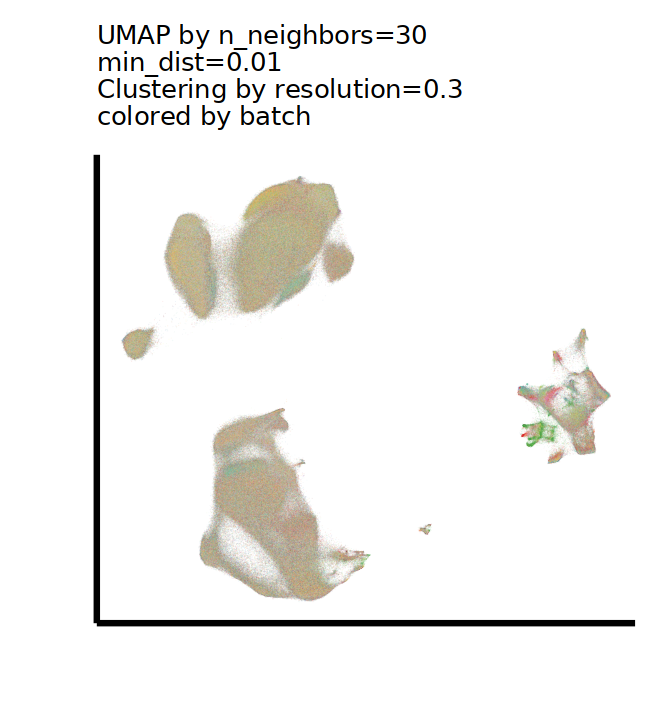

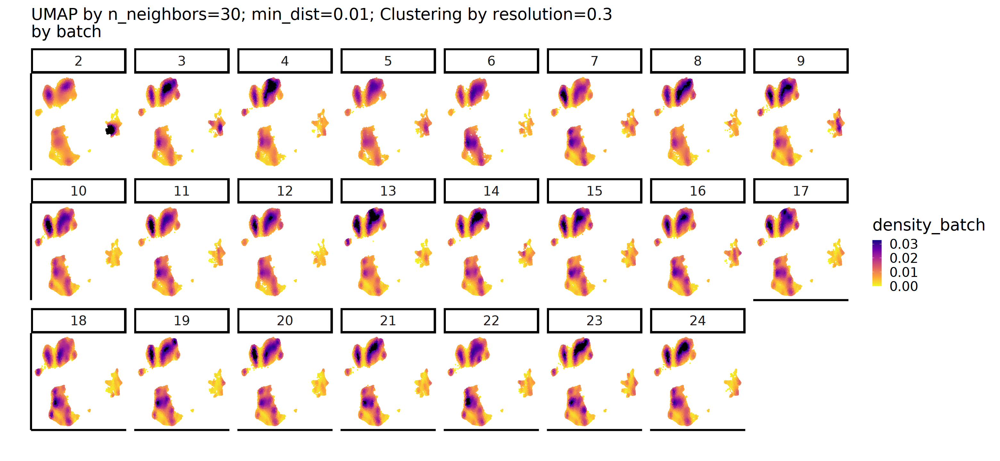

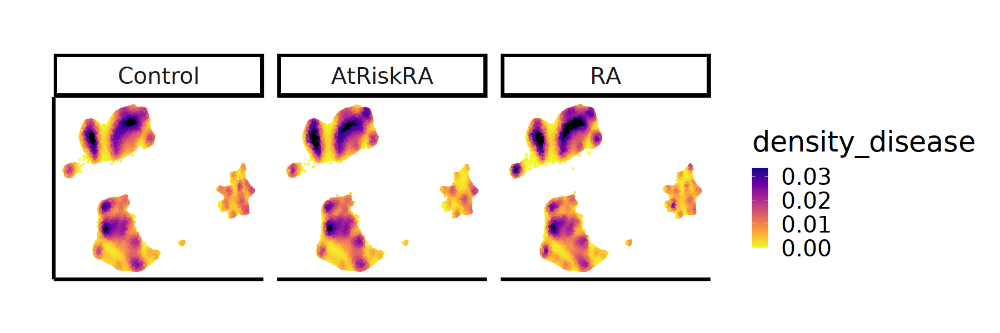

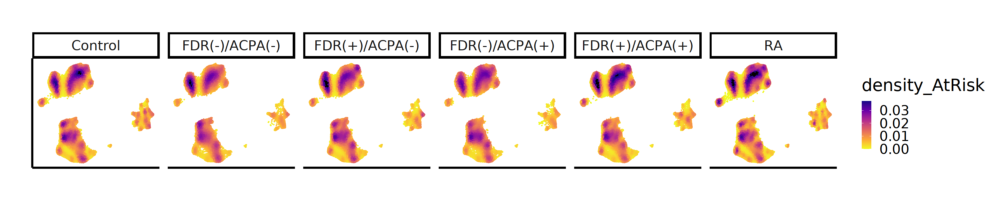

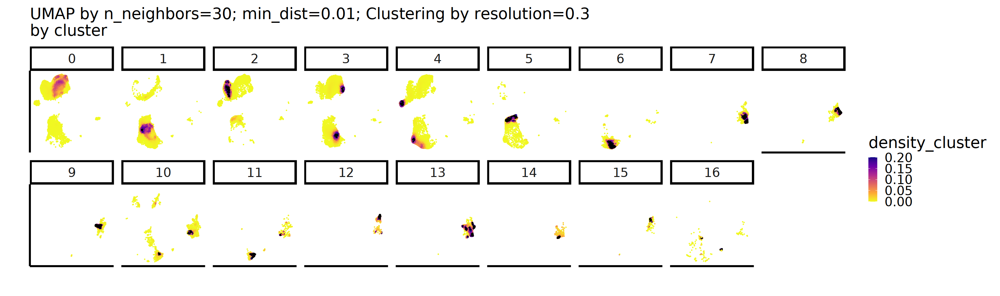

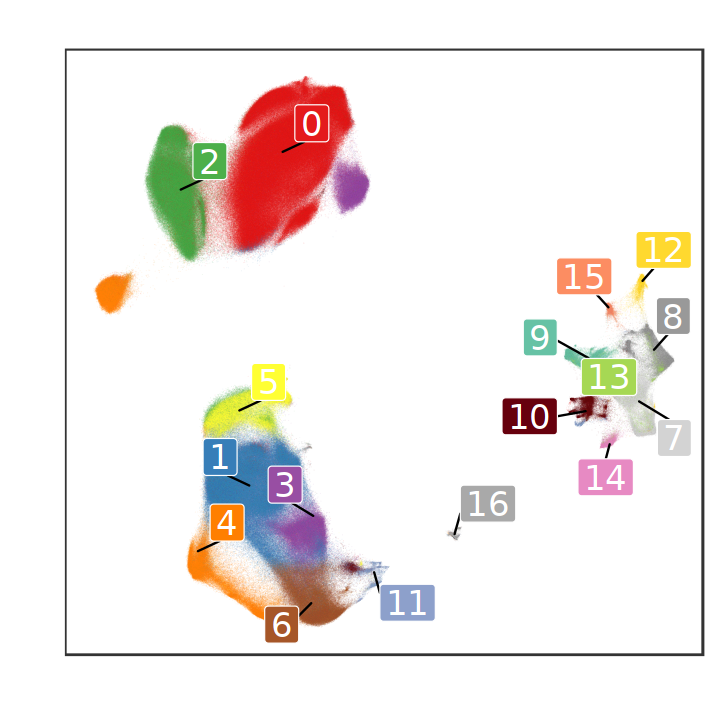

In [17]:

options(repr.plot.height = 6, repr.plot.width = 5.5)
plot(ggplot() +
       geom_point(
         data = umap_res,
         mapping = aes_string(x = "UMAP1", y = "UMAP2", color = "batch"),
         size = 0.01, stroke = 0, shape = 16, alpha = 0.1
       ) +
       scale_color_manual(values = c(
         "2" = "#4DAF4A",
         "3" = "#984EA3",
         "4" = "#FF7F00",
         "5" = "#FFFF33",
         "6" = "#A65628",
         "7" = "lightgrey",
         "8" = "#999999",
         "9" = "#66C2A5",
         "10" = "#67000D",
         "11" = "#8DA0CB",
         "12" = "#FFD92F",
         "13" = "#A6D854",
         "14" = "#E78AC3",
         "15" = "#FC8D62",
         "16" = "darkgrey",
         "17" = "#FEB24C",
         "18" = "#377EB8",
         "19" = "lightblue",
         "20" = "#FDE0EF",
         "21" = "#B8E186",
         "22" = "#66C2A5",
         "23" = "#E41A1C",
         "24" = "#377EB8")) +
       labs(
         title = paste0("UMAP by n_neighbors=",n_neighbors,"\nmin_dist=",min_dist,"\nClustering by resolution=",resolution_list,"\ncolored by batch"),
         x = "",
         y = ""
       ) +
       theme_classic(base_size = 30) +
       theme(
         legend.position = "none",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=15, face = "italic")
       )
)

options(repr.plot.height = 12, repr.plot.width = 26)
# png(paste0("/projects/jinamo@xsede.org/cytof/results/T_cells/Clustering_neighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,"_batch.png"), width = 5000, height = 3000,res=360)
plot(ggplot(umap_res) +
       geom_point(aes(UMAP1, UMAP2, color = density_batch),
                  size = 1, stroke = 0, shape = 16) + 
       scale_color_viridis_c(option = "plasma",direction = -1, na.value = "black",limits = c(0, quantile(umap_res$density_batch, probs = seq(0, 1, 0.1))["90%"])) +
       facet_wrap( ~ batch, ncol = 8) +
       labs(
         title = paste0("UMAP by n_neighbors=",n_neighbors,"; min_dist=",min_dist,"; Clustering by resolution=",resolution_list,"\nby batch"),
         x = "",
         y = ""
       ) +
       theme_classic(base_size = 30) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=30, face = "italic")
       )
)
# dev.off()

options(repr.plot.height = 5, repr.plot.width = 15)
# png(paste0("/projects/jinamo@xsede.org/cytof/results/T_cells/Clustering_neighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,"_batch.png"), width = 5000, height = 3000,res=360)
plot(ggplot(umap_res) +
       geom_point(aes(UMAP1, UMAP2, color = density_disease),
                  size = 1, stroke = 0, shape = 16) + 
       scale_color_viridis_c(option = "plasma",direction = -1, na.value = "black",limits = c(0, quantile(umap_res$density_disease, probs = seq(0, 1, 0.1))["90%"])) +
       facet_wrap( ~ disease, ncol = 3) +
       labs(
         title = "",
         x = "",
         y = ""
       ) +
       theme_classic(base_size = 30) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=30, face = "italic")
       )
)

options(repr.plot.height = 5, repr.plot.width = 25)
# png(paste0("/projects/jinamo@xsede.org/cytof/results/T_cells/Clustering_neighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,"_batch.png"), width = 5000, height = 3000,res=360)
plot(ggplot(umap_res) +
       geom_point(aes(UMAP1, UMAP2, color = density_AtRisk),
                  size = 1, stroke = 0, shape = 16) + 
       scale_color_viridis_c(option = "plasma",direction = -1, na.value = "black",limits = c(0, quantile(umap_res$density_AtRisk, probs = seq(0, 1, 0.01))["96%"])) +
       facet_wrap( ~ AtRisk, ncol = 6) +
       labs(
         title = "",
         x = "",
         y = ""
       ) +
       theme_classic(base_size = 30) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=30, face = "italic")
       )
)

options(repr.plot.height = 8, repr.plot.width = 27)
# png(paste0("/projects/jinamo@xsede.org/cytof/results/T_cells/Clustering_neighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,"_batch.png"), width = 5000, height = 3000,res=360)
plot(ggplot(umap_res) +
       geom_point(aes(UMAP1, UMAP2, color = density_cluster),
                  size = 1, stroke = 0, shape = 16) + 
       scale_color_viridis_c(option = "plasma",direction = -1, na.value = "black",limits = c(0, quantile(umap_res$density_cluster, probs = seq(0, 1, 0.1))["70%"])) +
       facet_wrap( ~ res_cell, ncol = 9) +
       labs(
         title = paste0("UMAP by n_neighbors=",n_neighbors,"; min_dist=",min_dist,"; Clustering by resolution=",resolution_list,"\nby cluster"),
         x = "",
         y = ""
       ) +
       theme_classic(base_size = 30) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=30, face = "italic")
       )
)

options(repr.plot.height = 6, repr.plot.width = 6)
# png(paste0("/projects/jinamo@xsede.org/cytof/results/T_cells/Clustering_neighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,"_cluster.png"), width = 1400, height = 1400,res=360)
plot(ggplot() +
       geom_point(
         data = umap_res %>% dplyr::mutate(res_cell = factor(res_cell,levels=cluster_df$cluster)),
         mapping = aes_string(x = "UMAP1", y = "UMAP2", color = "res_cell"),
         size = 0.01, stroke = 0, shape = 16, alpha = 0.1
       ) +
       geom_label_repel(
         data = cluster_center,
         aes(x = UMAP1, y = UMAP2, label = res_cell, fill = res_cell),
         color = "white",segment.color = "black",
           size = 7,
         min.segment.length = 0, seed = 42, box.padding = 0.5
       ) +
       scale_color_manual(values = c(
         "0" = "#E41A1C",
         "1" = "#377EB8",
         "2" = "#4DAF4A",
         "3" = "#984EA3",
         "4" = "#FF7F00",
         "5" = "#FFFF33",
         "6" = "#A65628",
         "7" = "lightgrey",
         "8" = "#999999",
         "9" = "#66C2A5",
         "10" = "#67000D",
         "11" = "#8DA0CB",
         "12" = "#FFD92F",
         "13" = "#A6D854",
         "14" = "#E78AC3",
         "15" = "#FC8D62",
         "16" = "darkgrey",
         "17" = "#FEB24C",
         "18" = "#377EB8",
         "19" = "lightblue",
         "20" = "#FDE0EF",
         "21" = "#B8E186",
         "22" = "#66C2A5",
         "23" = "#A6D855",
         "24" = "#E78AC4",
         "25" = "#FC8D63",
         "26" = "brown",
         "27" = "#FEB25C",
         "28" = "#377EB9",
         "29" = "lightgreen",
         "30" = "#FDE1EF"
       )) +
       scale_fill_manual(values = c(
         "0" = "#E41A1C",
         "1" = "#377EB8",
         "2" = "#4DAF4A",
         "3" = "#984EA3",
         "4" = "#FF7F00",
         "5" = "#FFFF33",
         "6" = "#A65628",
         "7" = "lightgrey",
         "8" = "#999999",
         "9" = "#66C2A5",
         "10" = "#67000D",
         "11" = "#8DA0CB",
         "12" = "#FFD92F",
         "13" = "#A6D854",
         "14" = "#E78AC3",
         "15" = "#FC8D62",
         "16" = "darkgrey",
         "17" = "#FEB24C",
         "18" = "#377EB8",
         "19" = "lightblue",
         "20" = "#FDE0EF",
         "21" = "#B8E186",
         "22" = "#66C2A5",
         "23" = "#A6D855",
         "24" = "#E78AC4",
         "25" = "#FC8D63",
         "26" = "brown",
         "27" = "#FEB25C",
         "28" = "#377EB9",
         "29" = "lightgreen",
         "30" = "#FDE1EF"
       )) +
       labs(
         x = "",
         y = "",
         title = ""
       ) +
       theme_bw(base_size = 20) +
       theme(
         legend.position = "none",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=10)
       ) 
)
# dev.off()




In [18]:
exprs_norm <- readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/NK_cells/arcsinh_transformed_transposed_Prop",prop,"_Nmin",n_min,".rds"))
print(dim(exprs_norm))
exprs_norm = exprs_norm[, clu_logi]


[1]      48 2008997


In [19]:
clu_marker <- presto::wilcoxauc(exprs_norm, umap_res$res_cell)
x <- clu_marker %>%
  dplyr::group_by(group) %>%
  dplyr::top_n(9, wt = logFC) 
x
# x[order(x$cluster, decreasing = FALSE),]


## parameter	description
## feature	name of feature.
## group	name of group label.
## avgExpr	mean value of feature in group.
## logFC	log fold change between observations in group vs out.
## statistic	Wilcoxon rank sum U statistic.
## auc	area under the receiver operator curve.
## pval	nominal p value, from two-tailed Gaussian approximation of U statistic.
## padj	Benjamini-Hochberg adjusted p value.
## pct_in	Percent of observations in the group with non-zero feature value.
## pct_out	Percent of observations out of the group with non-zero feature value.

feature,group,avgExpr,logFC,statistic,auc,pval,padj,pct_in,pct_out
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
GNLY,0,4.271757,0.6047514,543547166582,0.5964577,0.000000e+00,0.000000e+00,100,100
CD2,0,3.067912,1.0863445,612085522166,0.6716678,0.000000e+00,0.000000e+00,100,100
CD16,0,2.968180,0.8318721,587856979761,0.6450808,0.000000e+00,0.000000e+00,100,100
NKp80,0,1.652723,0.2998878,541355070838,0.5940522,0.000000e+00,0.000000e+00,100,100
GZMB,0,4.709743,1.3430176,665333292002,0.7300989,0.000000e+00,0.000000e+00,100,100
CD3z,0,4.871168,1.0449813,640662409364,0.7030264,0.000000e+00,0.000000e+00,100,100
Tbet,0,3.463385,0.4724027,532008821211,0.5837962,0.000000e+00,0.000000e+00,100,100
Perforin,0,5.197466,1.1339657,609953728807,0.6693285,0.000000e+00,0.000000e+00,100,100
CD57,0,5.020852,3.2853571,781140799810,0.8571794,0.000000e+00,0.000000e+00,100,100


In [20]:
## Heatmap of marker genes
# marker_plot <- unique(x$feature)
marker_plot <- unique(clu_marker$feature)

exp_heat <- exprs_norm[marker_plot,]
exp_heat <- t(exp_heat)
exp_heat <- as.data.frame(exp_heat)
exp_heat$res_cell <- as.character(umap_res$res_cell)

exp_ave <- aggregate(exp_heat[, 1:(ncol(exp_heat)-1)], list(exp_heat$res_cell), mean)
colnames(exp_ave)[1] <- "res_cell"
exp_ave <- as.data.frame(t(exp_ave))
colnames(exp_ave) <- as.character(t(exp_ave[1,]))
exp_ave <- exp_ave[-1,]
row_names <- rownames(exp_ave)
exp_ave <- mutate_all(exp_ave, function(x) as.numeric(as.character(x)))
rownames(exp_ave) <- row_names 
colnames(exp_ave) = paste0("NK-",
                           cluster_df %>%
    magrittr::set_rownames(cluster_df$cluster) %>%
    .[colnames(exp_ave),] %>%
    .$cluster,
                           ":",
                           cluster_df %>%
    magrittr::set_rownames(cluster_df$cluster) %>%
    .[colnames(exp_ave),] %>%
    .$clu_name)                
head(exp_ave)
dim(exp_ave)     
                      
# Overwrite default draw_colnames in the pheatmap package.
# Thanks to Josh O'Brien at http://stackoverflow.com/questions/15505607
draw_colnames_45 <- function (coln, gaps, ...) {
  coord <- pheatmap:::find_coordinates(length(coln), gaps)
  x     <- coord$coord - 0.5 * coord$size
  res   <- grid::textGrob(
    coln, x = x, y = unit(1, "npc") - unit(3,"bigpts"),
    vjust = 0.75, hjust = 1, rot = 45, gp = grid::gpar(...)
  )
  return(res)
}
assignInNamespace(
  x = "draw_colnames",
  value = "draw_colnames_45",
  ns = asNamespace("pheatmap")
)
exp_ave <- as.matrix(exp_ave)
mat_breaks <- seq(min(exp_ave), max(exp_ave), length.out = 10)
quantile_breaks <- function(xs, n = 10) {
  breaks <- quantile(xs, probs = seq(0, 1, length.out = n))
  breaks[!duplicated(breaks)]
}

mat_breaks <- quantile_breaks(exp_ave, n = 20)
scale_rows <- function(x) t(scale(t(x)))
exp_ave_scale <- scale_rows(exp_ave) # Z-score
exp_ave_scale<- na.omit(exp_ave_scale)
mat_breaks <- quantile_breaks(exp_ave_scale, n = 10)
mat_breaks <- seq(min(exp_ave_scale), max(exp_ave_scale), length.out = 24)
mat_breaks <- quantile_breaks(exp_ave_scale, n = 6)
mat_breaks <- seq(min(exp_ave_scale), max(exp_ave_scale), length.out = 24)
exp_ave_scale[exp_ave_scale > 2] <- 2
exp_ave_scale[exp_ave_scale < -2] <- -2
head(exp_ave_scale)
dim(exp_ave_scale)

,NK-0:CD56dimCD16+CD2+CD57+,NK-1:CD56dimCD16+CD2+CD57-,NK-10:CD56-/dimCD16dimCD2+CD57dimCD7+GZMB+Tbet+,NK-11:CD56-/dimCD16-CD2+CD57-CD7+,NK-12:CD56-/dimCD16-CD2-CD57-HLADR+Ki67highCD39high,NK-13:CD56-/dimCD16-CD2-CD57-HLADR+PSGL1+,NK-14:CD56-/dimCD16-CD2-CD57-GZMB+HLADR+CD4+,NK-15:CD56-/dimCD16-CD2-CD57-SLAMF6+,NK-16:CD56brCD16-CD2+CD57-NKp46highGZMK+,NK-2:CD56dimCD16+CD2-CD57+,NK-3:CD56dimCD16+CD2+CD57dimPSGL1+,NK-4:CD56dimCD16+CD2+CD57dimKi67+,NK-5:CD56dimCD16+CD2-CD57-,NK-6:CD56brCD16-CD2+CD57-CD7+NKp46highGZMK+,NK-7:CD56-/dimCD16-CD2dimCD57-HLADR+Ki67+CD39+PSGL1+,NK-8:CD56-/dimCD16-CD2-CD57-CD11b+,NK-9:CD56-/dimCD16dimCD2-CD57-HLADR+CD39+DAP12+
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CD45,2.48266400,2.48247100,2.7906900,2.37187900,2.04686900,1.96555000,1.70626900,1.98670500,1.94482200,2.41378100,2.45046300,2.30914700,2.40515300,2.16716600,1.60454700,1.22993300,2.44231700
CD172ab,0.08440353,0.07978807,0.1861585,0.09223869,0.12072283,0.46447411,0.37786752,0.08985348,0.08664601,0.09154971,0.08688527,0.08140218,0.08311504,0.08881984,0.54069568,0.31528301,0.55600577
CD8a,0.13055080,0.13094939,0.1819358,0.26545884,0.08210704,0.08591307,0.07015263,0.06482182,0.09263639,0.12241393,0.11708025,0.12715569,0.11801330,0.09170230,0.06617942,0.06366317,0.06185868
CD20,0.03566854,0.03461796,0.0351389,0.06643393,0.19220812,0.10807747,0.04009152,1.25003655,0.04484438,0.03622484,0.03597417,0.03951609,0.03392532,0.05018424,0.04352637,0.04606361,0.03914984
CD4,0.04170010,0.03779639,0.1179193,0.84318949,0.05725602,0.34370508,1.51614175,0.07042952,0.06486396,0.03894994,0.04291021,0.04579282,0.03772719,0.06910492,0.47244533,0.05571981,0.37834459
CD3,0.05663454,0.05058949,0.1160247,0.56242112,0.07057245,0.05706611,0.04868873,0.05123312,0.05158236,0.05066300,0.05578729,0.05410309,0.04835340,0.05096339,0.06321744,0.07156824,0.05133623


[1] 48 17

,NK-0:CD56dimCD16+CD2+CD57+,NK-1:CD56dimCD16+CD2+CD57-,NK-10:CD56-/dimCD16dimCD2+CD57dimCD7+GZMB+Tbet+,NK-11:CD56-/dimCD16-CD2+CD57-CD7+,NK-12:CD56-/dimCD16-CD2-CD57-HLADR+Ki67highCD39high,NK-13:CD56-/dimCD16-CD2-CD57-HLADR+PSGL1+,NK-14:CD56-/dimCD16-CD2-CD57-GZMB+HLADR+CD4+,NK-15:CD56-/dimCD16-CD2-CD57-SLAMF6+,NK-16:CD56brCD16-CD2+CD57-NKp46highGZMK+,NK-2:CD56dimCD16+CD2-CD57+,NK-3:CD56dimCD16+CD2+CD57dimPSGL1+,NK-4:CD56dimCD16+CD2+CD57dimKi67+,NK-5:CD56dimCD16+CD2-CD57-,NK-6:CD56brCD16-CD2+CD57-CD7+NKp46highGZMK+,NK-7:CD56-/dimCD16-CD2dimCD57-HLADR+Ki67+CD39+PSGL1+,NK-8:CD56-/dimCD16-CD2-CD57-CD11b+,NK-9:CD56-/dimCD16dimCD2-CD57-HLADR+CD39+DAP12+
CD45,0.8095738,0.8090824,1.59392065,0.5274747,-0.3001196,-0.5071875,-1.1674117,-0.4533191,-0.5599686,0.6341725,0.7275783,0.3677361,0.6122025,0.00620055,-1.4264331,-2.0000000,0.7068356
CD172ab,-0.6671014,-0.6933904,-0.08751989,-0.6224735,-0.4602320,1.4977248,1.0044264,-0.6360593,-0.6543286,-0.6263979,-0.6529658,-0.6841967,-0.6744405,-0.64194679,1.9318717,0.6479542,2.0000000
CD8a,0.3945151,0.4022240,1.38832995,2.0000000,-0.5424155,-0.4688047,-0.7736208,-0.8767218,-0.3387717,0.2371432,0.1339868,0.3288516,0.1520325,-0.35683759,-0.8504650,-0.8991307,-0.9340306
CD20,-0.3067346,-0.3103261,-0.30854524,-0.2015592,0.2284158,-0.0591955,-0.2916141,2.0000000,-0.2753658,-0.3048328,-0.3056898,-0.2935813,-0.3126940,-0.25711084,-0.2798716,-0.2711977,-0.2948333
CD4,-0.5262774,-0.5361851,-0.33283245,1.5079085,-0.4867964,0.2402134,2.0000000,-0.4533620,-0.4674874,-0.5332574,-0.5232062,-0.5158901,-0.5363607,-0.45672381,0.5669571,-0.4906953,0.3281288
CD3,-0.2618655,-0.3109713,0.22057861,2.0000000,-0.1486436,-0.2583597,-0.3264118,-0.3057429,-0.3029059,-0.3103742,-0.2687480,-0.2824293,-0.3291357,-0.30793400,-0.2083906,-0.1405545,-0.3049053


[1] 48 17

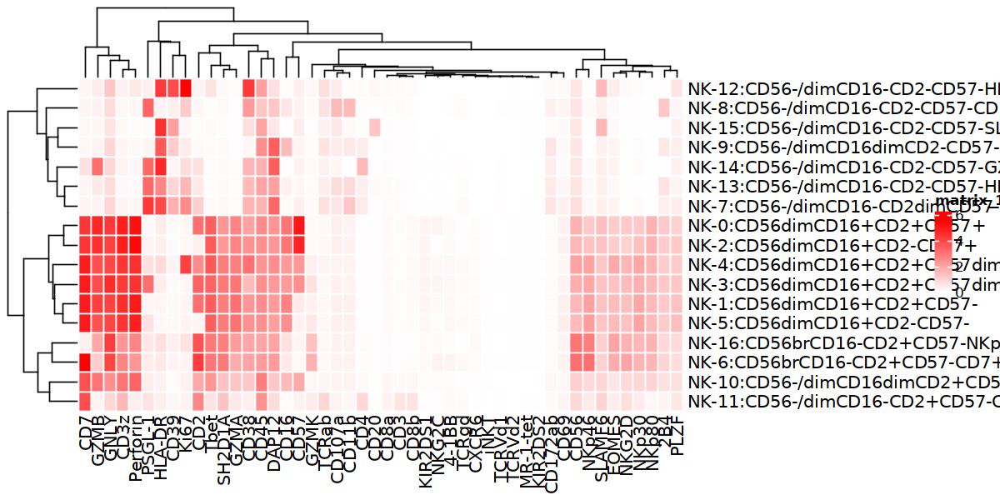

In [21]:

options(repr.plot.height = 5, repr.plot.width = 10)
plot(
    pheatmap(
      mat = t(exp_ave),
      border_color = "white",
      #breaks  = mat_breaks,
      #color  =inferno(length(mat_breaks) - 1),
      color= colorRampPalette(c("white", "red"))(length(mat_breaks)),
      show_rownames = TRUE,
      show_colnames = TRUE,
      cluster_rows = TRUE,
      cluster_cols = TRUE,
      # cutree_rows = 5,
      # cutree_cols = 3,
      #   annotation_col = annotation_col,
      #   annotation_colors = meta_colors,
      fontsize = 12,
      fontsize_row = 12,
      scale = "none"
    )
)


In [22]:
ph_markers_data_arcsinh = readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/NK_cells/arcsinh_transformed_Prop",prop,"_Nmin",n_min,".rds"))
ph_markers_data_arcsinh = ph_markers_data_arcsinh[clu_logi,]
dim(ph_markers_data_arcsinh)
head(ph_markers_data_arcsinh)


[1] 2008702      48

CD45,CD172ab,CD8a,CD20,CD4,CD3,CD56,GNLY,KIR2DS1,CD2,...,NKG2D,TCRab,Ki67,Tbet,Perforin,CD57,HLA-DR,SLAMF6,CD38,CD11b
2.602729,-0.0024141292,0.484467325,-0.0017132879,-0.0033054733,0.068145545,0.2543946,5.2194904,0.0018857729,3.554146826,...,1.869876877,8.968090e-03,-0.0013189406,3.0949905,5.070025365,0.0228256670,-5.974579e-05,1.417555007,0.505699,0.641790016
1.987263,0.0005548585,0.140863314,0.0003231119,0.4032566360,-0.003001209,0.6697980,4.3080859,-0.0016927434,2.839163044,...,1.078514321,-7.108565e-05,0.0018054680,3.2805772,4.948740152,0.0409980592,1.904484e-03,0.865174134,1.493333,0.001233699
1.528462,0.0021688807,1.478159065,-0.0001689462,-0.0001922936,0.350287354,1.4162636,4.4368349,0.0004480174,-0.003436309,...,0.002521371,-5.340509e-04,0.6115473246,3.2834500,5.418789011,5.2031068868,-1.313737e-03,1.223630209,2.697176,0.031000155
1.413552,-0.0046913782,0.001519243,0.0007006473,0.0011706309,0.319575536,1.8391783,5.2345645,1.7452447490,1.254066643,...,1.515655243,2.211089e-03,0.0009568065,3.4096024,6.065792134,4.5894137945,1.053079e+00,0.319054670,3.253944,1.015936197
1.129810,0.7777337794,0.001541125,0.0032743020,1.0706242337,0.747440721,0.4513825,0.3818331,0.0034496410,1.879761858,...,-0.001750963,3.856728e-01,1.4124514818,-0.0014546,-0.001330144,-0.0008931067,-1.335097e-04,-0.001315335,2.784978,0.719713847
2.777602,0.0008582493,0.155748068,0.0013329563,-0.0013478143,-0.001933619,3.2986781,5.3021866,0.1137626445,5.116461445,...,1.805163558,2.406644e-03,-0.0042578178,3.2928588,2.875508982,0.0004959763,3.568332e+00,1.956841209,1.588896,0.207617859


In [23]:

markers = c('2B4','4-1BB','CD107a','CD11b','CD16','CD172ab','CD2','CD20','CD3','CD38','CD39','CD3z','CD4','CD45','CD56','CD57','CD69','CD7','CD8a','CD8b','CXCR6','DAP12','EOMES','GNLY','GZMA','GZMB','GZMK','HLA-DR','KIR2DS1','KIR2DS2','Ki67','MR-1-tet','NKG2C','NKG2D','NKp30','NKp46','NKp80','PLZF','PSGL-1','Perforin','SH2D1A','SLAMF6','TCRVd1','TCRVd2','TCRab','TCRgd','Tbet','iNKT')


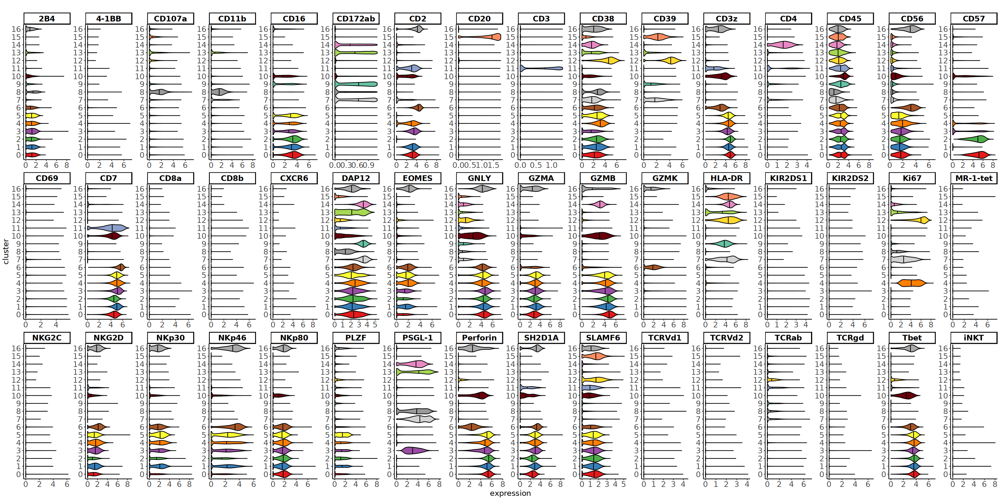

In [24]:
options(repr.plot.height = 14, repr.plot.width = 28)
suppressWarnings({
  as.data.frame(ph_markers_data_arcsinh[,markers]) %>%
    dplyr::mutate(cluster = umap_res$res_cell) %>%
    dplyr::mutate(cluster = factor(cluster,levels=unique(umap_res$res_cell)[order(as.numeric(unique(umap_res$res_cell)))])) %>%
    tidyr::pivot_longer(!cluster) %>%
    magrittr::set_colnames(c("cluster","protein","expression")) %>%
    dplyr::mutate(protein = gsub("\\.","-",protein)) %>% 
    ggplot(.,aes(x=cluster, y=expression, fill = cluster)) + 
    geom_violin(color = "black", aes(fill = cluster), scale = "width", draw_quantiles = c(0.5)) +
    facet_wrap(protein ~ ., scales = "free" , nrow = 3) +
    theme_classic() +
    coord_flip() +
    scale_fill_manual(values = c(
    "0" = "#E41A1C",
    "1" = "#377EB8",
    "2" = "#4DAF4A",
    "3" = "#984EA3",
    "4" = "#FF7F00",
    "5" = "#FFFF33",
    "6" = "#A65628",
    "7" = "lightgrey",
    "8" = "#999999",
    "9" = "#66C2A5",
    "10" = "#67000D",
    "11" = "#8DA0CB",
    "12" = "#FFD92F",
    "13" = "#A6D854",
    "14" = "#E78AC3",
    "15" = "#FC8D62",
    "16" = "darkgrey",
    "17" = "#FEB24C",
    "18" = "#377EB8",
    "19" = "lightblue",
    "20" = "#FDE0EF",
    "21" = "#B8E186",
    "22" = "#66C2A5",
    "23" = "#A6D855",
    "24" = "#E78AC4",
    "25" = "#FC8D63",
    "26" = "brown",
    "27" = "#FEB25C",
    "28" = "#377EB9",
    "29" = "lightgreen",
    "30" = "#FDE1EF"
  )) +
    theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "none",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size = 15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) +
    labs(title = "",
         x = "cluster",
         y = "expression") 
})

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


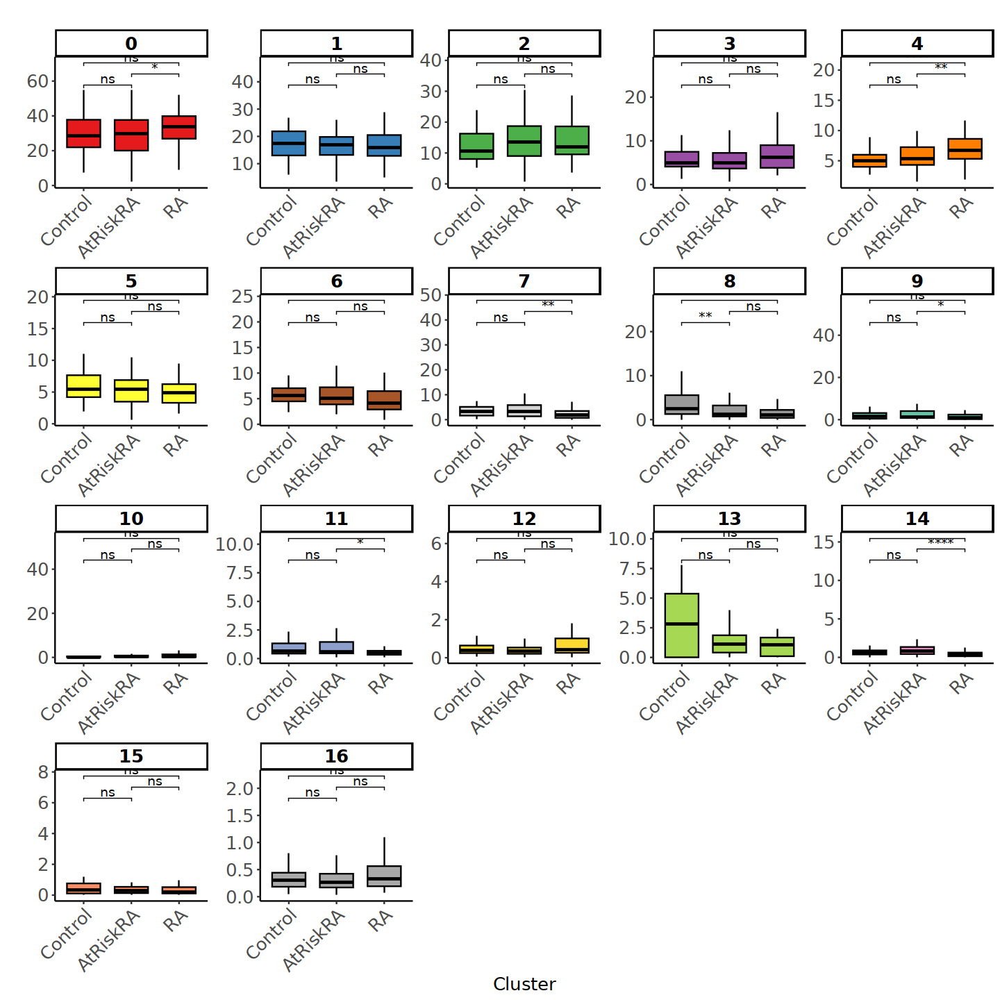

In [25]:
# Proportion of clusters according to disease status

options(repr.plot.height = 12, repr.plot.width = 12)
data.frame(subject_id = umap_res$subject_id, cluster = umap_res$res_cell, disease = umap_res$disease) %>%
  dplyr::group_by(subject_id,disease,cluster) %>%
  dplyr::summarize(count = dplyr::n()) %>%
  dplyr::ungroup() %>%
  dplyr::group_by(subject_id) %>%
  dplyr::mutate(proportion = 100*count/sum(count)) %>%
  dplyr::mutate(cluster = factor(cluster,levels=unique(umap_res$res_cell)[order(as.numeric(unique(umap_res$res_cell)))])) %>%
  ggpubr::ggboxplot(., x = "disease", y="proportion", fill = "cluster", facet.by = "cluster", scales = "free", outlier.shape = NA) + 
  ggpubr::stat_compare_means(
    comparisons = list(c("Control", "AtRiskRA"), c("AtRiskRA", "RA"),  c("Control", "RA")), 
    label = "p.signif"
    ) +
  scale_fill_manual(values = c(
    "0" = "#E41A1C",
    "1" = "#377EB8",
    "2" = "#4DAF4A",
    "3" = "#984EA3",
    "4" = "#FF7F00",
    "5" = "#FFFF33",
    "6" = "#A65628",
    "7" = "lightgrey",
    "8" = "#999999",
    "9" = "#66C2A5",
    "10" = "#67000D",
    "11" = "#8DA0CB",
    "12" = "#FFD92F",
    "13" = "#A6D854",
    "14" = "#E78AC3",
    "15" = "#FC8D62",
    "16" = "darkgrey",
    "17" = "#FEB24C",
    "18" = "#377EB8",
    "19" = "lightblue",
    "20" = "#FDE0EF",
    "21" = "#B8E186",
    "22" = "#66C2A5",
    "23" = "#A6D855",
    "24" = "#E78AC4",
    "25" = "#FC8D63",
    "26" = "brown",
    "27" = "#FEB25C",
    "28" = "#377EB9",
    "29" = "lightgreen",
    "30" = "#FDE1EF"
  )) +
  theme_classic() +
  theme(strip.text.x=element_text(size=15, color="black", face="bold"),
        strip.text.y=element_text(size=15, color="black", face="bold"),
        legend.position = "none",
        plot.title = element_text(size=15),
        axis.title.x = element_text(size=15),
        axis.title.y = element_text(size =15),
        axis.text.y = element_text(size = 15),
        axis.text.x = element_text(size = 15, angle = 45, hjust=1),
        legend.text =  element_text(size = 15),
        legend.key.size = grid::unit(0.5, "lines"),
        legend.title = element_text(size = 0.8, hjust = 0)) +
  labs(title = "",
       x = "Cluster",
       y = "") 




`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


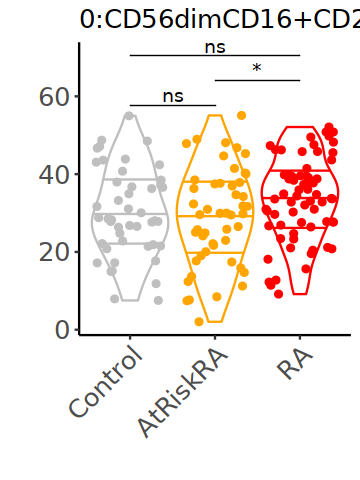

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


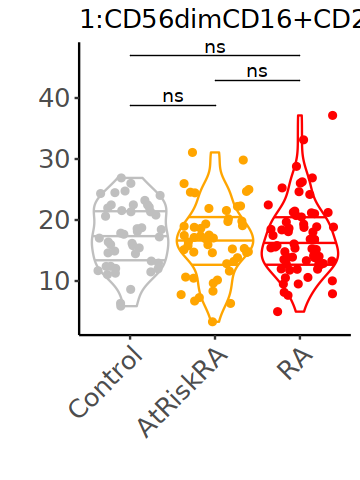

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


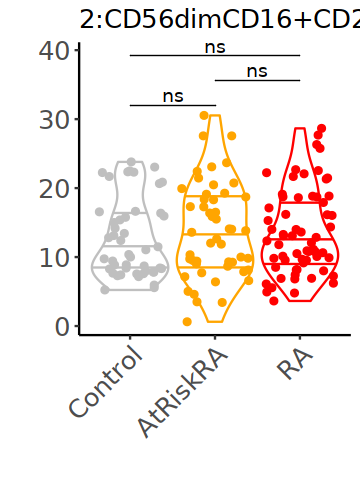

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


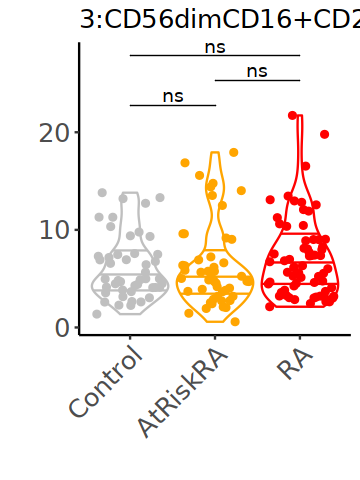

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


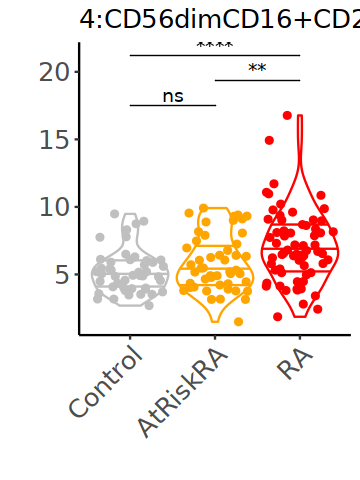

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


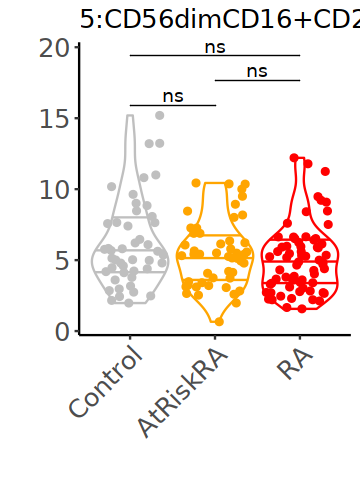

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


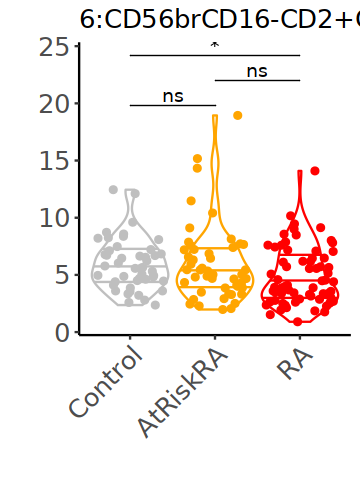

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


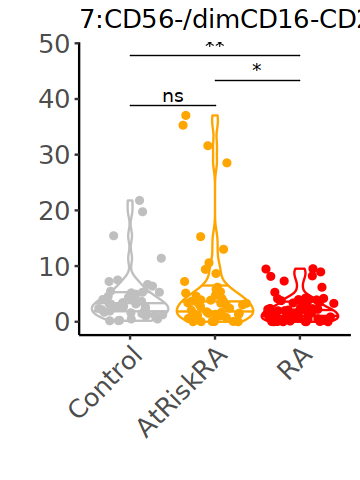

Warning message in wilcox.test.default(c(0.895048361484048, 0.600720865038046, 1.4729512587038, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


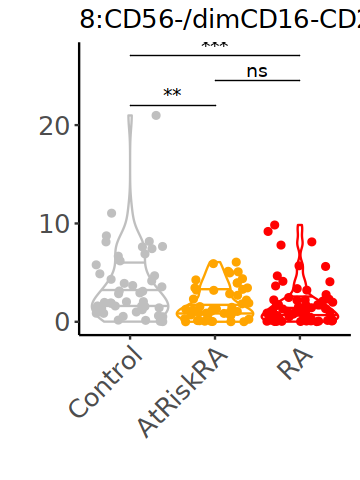

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


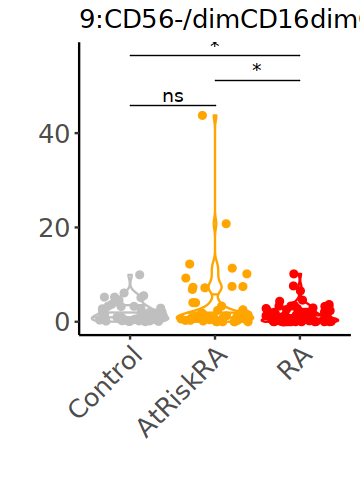

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


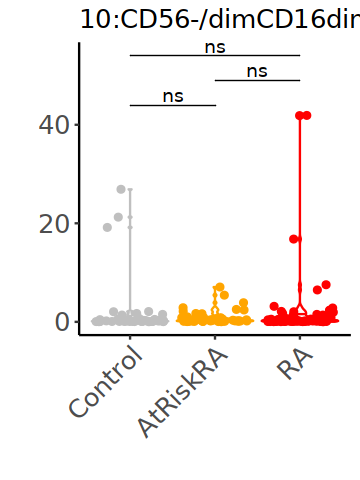

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


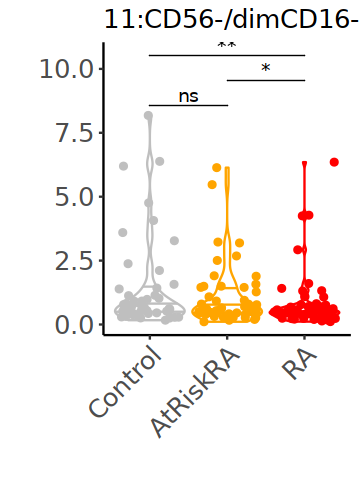

Warning message in wilcox.test.default(c(3.80434782608696, 0.00515756356697096, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


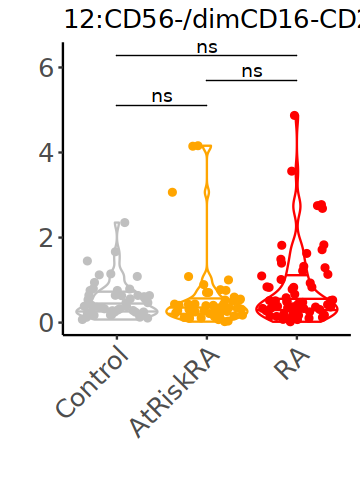

Warning message in wilcox.test.default(c(1.37144507001588, 0.213589640902416, 0.254418853776111, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


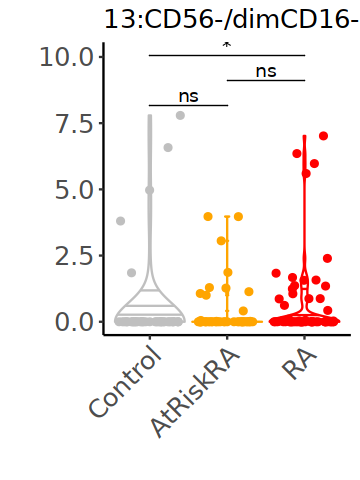

Warning message in wilcox.test.default(c(0.909484625378952, 0.0800961153384061, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


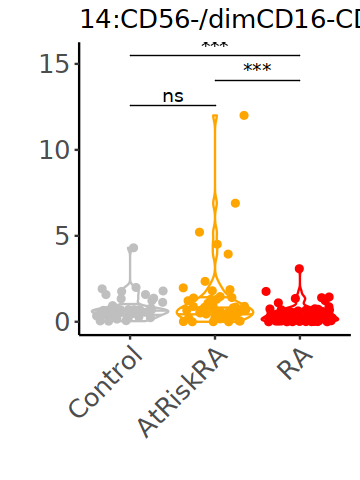

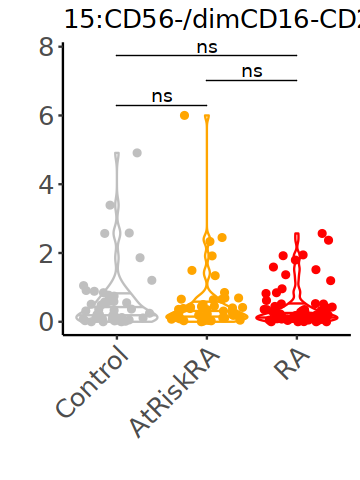

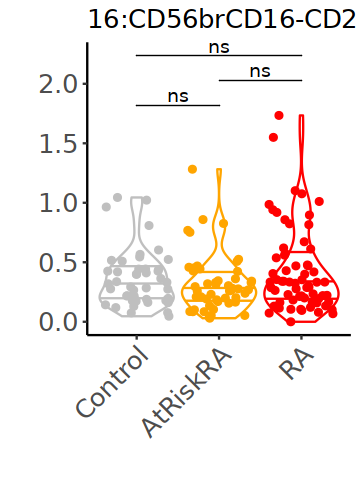

In [26]:

options(repr.plot.height = 4, repr.plot.width = 3)

for (clu in unique(umap_res$res_cell)[order(as.integer(unique(umap_res$res_cell)))]){
    
    # For each subject, make rows that says 0 if the cells belonging to each cluster are 0
    tmp = data.frame(subject_id = umap_res$subject_id, cluster = umap_res$res_cell, disease = umap_res$disease) %>%
          dplyr::group_by(subject_id,disease,cluster) %>%
          dplyr::summarize(count = dplyr::n()) %>%
          dplyr::ungroup() %>%
          dplyr::group_by(subject_id) %>%
          dplyr::mutate(proportion = 100*count/sum(count)) %>%
          dplyr::filter(cluster==clu) %>%
        dplyr::group_by(disease,cluster) %>%
        dplyr::summarize(count = dplyr::n()) %>%
        dplyr::ungroup()
    for (dis in c("Control","AtRiskRA","RA")){
        if(!(dis %in% tmp$disease)){
            tmp = tmp %>%
                dplyr::add_row(disease = dis, cluster = clu, count = 0)
        }
    }
    tmp = cbind(
        tmp,
        all_count = umap_res %>%
            dplyr::distinct(disease,subject_id) %>%
            dplyr::group_by(disease) %>%
            dplyr::summarize(all_count = dplyr::n()) %>%
            .$all_count
        ) %>%
        dplyr::mutate(diff = all_count-count)
    tmp = rbind(
        data.frame(subject_id = rep("Control",tmp[tmp$disease == "Control",]$diff), 
                   cluster = rep(clu,tmp[tmp$disease == "Control",]$diff), 
                   count = rep(0,tmp[tmp$disease == "Control",]$diff), 
                   proportion = rep(0,tmp[tmp$disease == "Control",]$diff), 
                   disease = rep("Control",tmp[tmp$disease == "Control",]$diff)
                   ),
        data.frame(subject_id = rep("AtRiskRA",tmp[tmp$disease == "AtRiskRA",]$diff), 
                   cluster = rep(clu,tmp[tmp$disease == "AtRiskRA",]$diff), 
                   count = rep(0,tmp[tmp$disease == "AtRiskRA",]$diff), 
                   proportion = rep(0,tmp[tmp$disease == "AtRiskRA",]$diff), 
                   disease = rep("AtRiskRA",tmp[tmp$disease == "AtRiskRA",]$diff)
                   ),
        data.frame(subject_id = rep("RA",tmp[tmp$disease == "RA",]$diff), 
                   cluster = rep(clu,tmp[tmp$disease == "RA",]$diff), 
                   count = rep(0,tmp[tmp$disease == "RA",]$diff), 
                   proportion = rep(0,tmp[tmp$disease == "RA",]$diff), 
                   disease = rep("RA",tmp[tmp$disease == "RA",]$diff)
                   )
        )
    
    plot(
       data.frame(subject_id = umap_res$subject_id, cluster = umap_res$res_cell, disease = umap_res$disease) %>%
          dplyr::group_by(subject_id,disease,cluster) %>%
          dplyr::summarize(count = dplyr::n()) %>%
          dplyr::ungroup() %>%
          dplyr::group_by(subject_id) %>%
          dplyr::mutate(proportion = 100*count/sum(count)) %>%
          dplyr::filter(cluster==clu) %>%
          rbind(.,tmp) %>%
          dplyr::mutate(disease = factor(disease,levels = c("Control", "AtRiskRA", "RA"))) %>%
          ggplot(., aes(x = disease, y=proportion, fill = cluster)) + 
          geom_violin(aes(color = disease), fill = "white", scale = "width", draw_quantiles = c(0.25, 0.5, 0.75)) +
          geom_jitter(aes(fill = disease, color = disease)) +
          ggpubr::stat_compare_means(
            comparisons = list(c("Control", "AtRiskRA"), c("AtRiskRA", "RA"),  c("Control", "RA")), 
            label = "p.signif",
            tip.length = 0
            ) +
          scale_fill_manual(values = c("Control" = "grey75","AtRiskRA" = "orange","RA" = "red")) +
          scale_color_manual(values = c("Control" = "grey75","AtRiskRA" = "orange","RA" = "red")) +
          theme_classic() +
          theme(strip.text.x=element_text(size=15, color="black", face="bold"),
                strip.text.y=element_text(size=15, color="black", face="bold"),
                legend.position = "none",
                plot.title = element_text(size=15),
                axis.title.x = element_text(size=15),
                axis.title.y = element_text(size =15),
                axis.text.y = element_text(size = 15),
                axis.text.x = element_text(size = 15, angle = 45, hjust=1),
                legend.text =  element_text(size = 15),
                legend.key.size = grid::unit(0.5, "lines"),
                legend.title = element_text(size = 0.8, hjust = 0)) +
          labs(title = paste(clu,unique(cluster_df[cluster_df$cluster==clu,]$clu_name),sep=":"),
               x = "",
               y = "") 

            )
}




`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


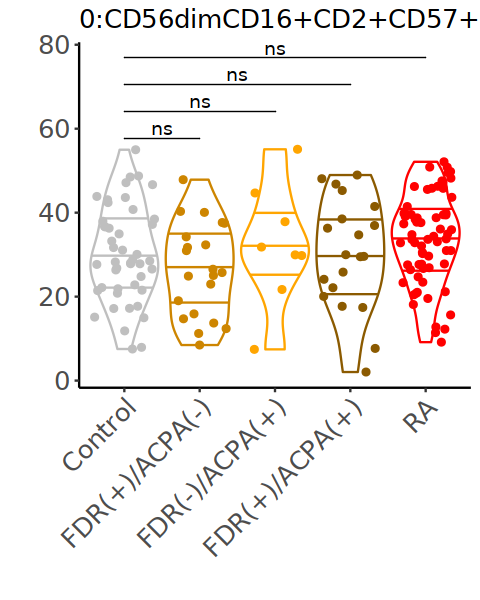

`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


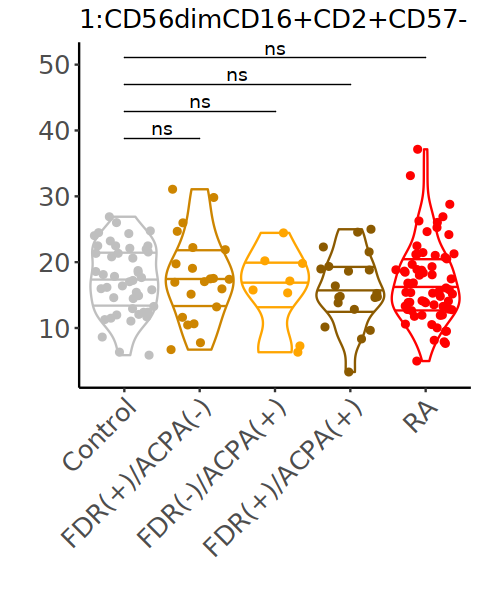

`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


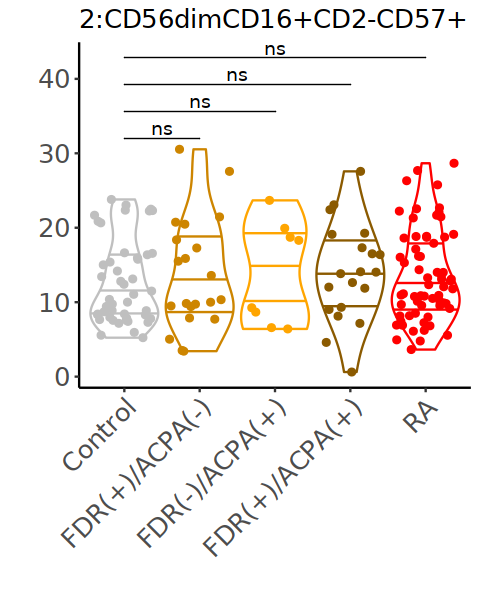

`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


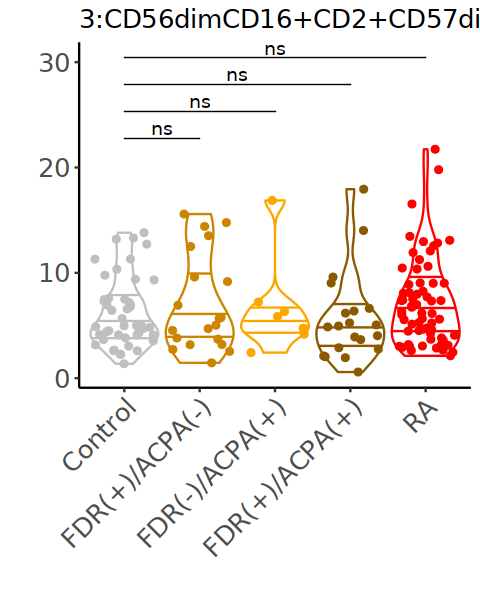

`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


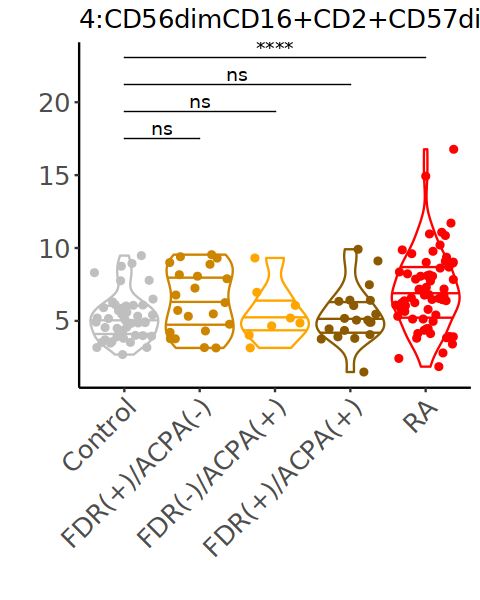

`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


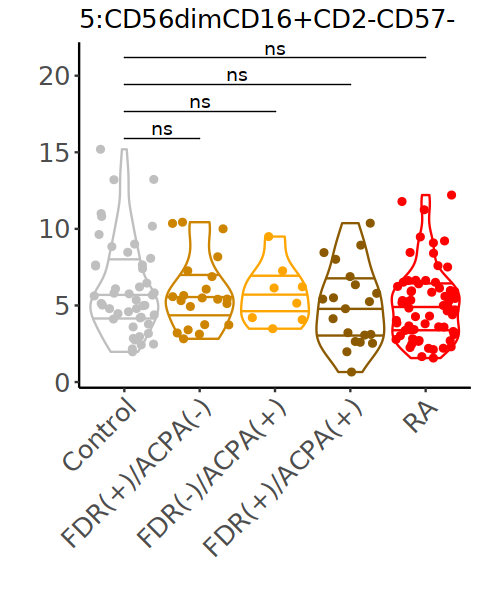

`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


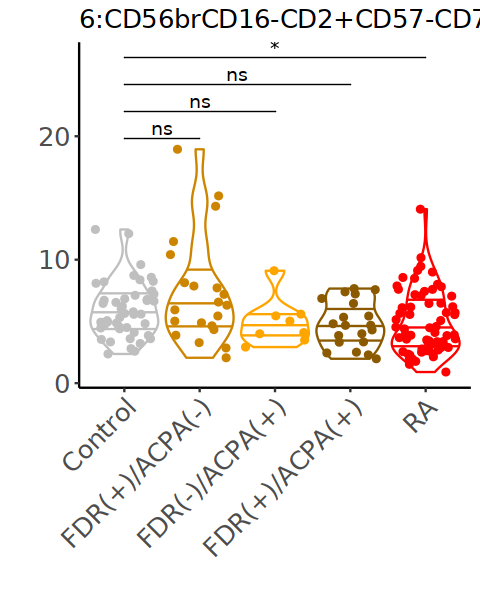

`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


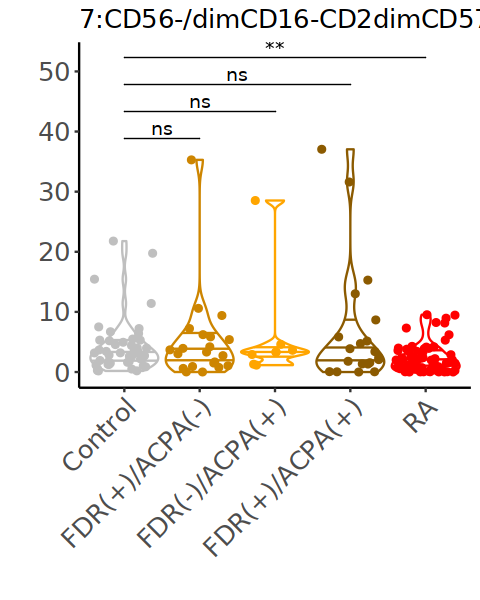

Warning message in wilcox.test.default(c(0.895048361484048, 0.600720865038046, 1.4729512587038, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


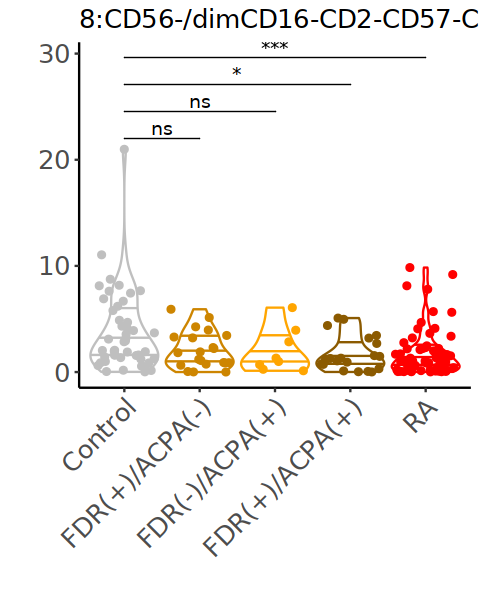

`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


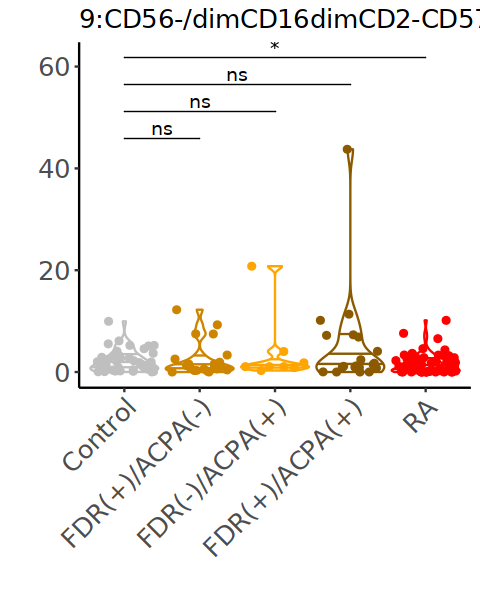

`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


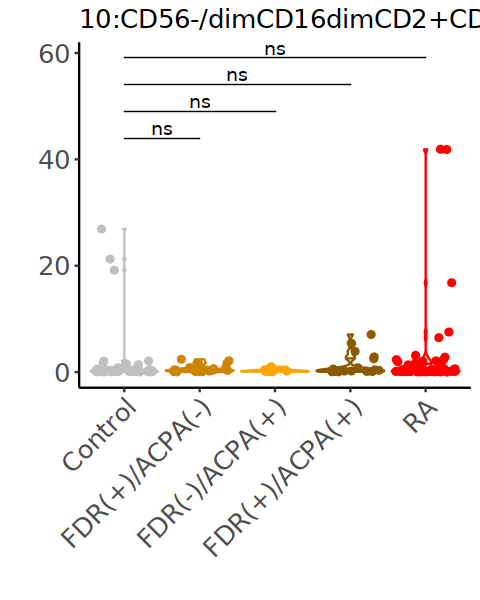

`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


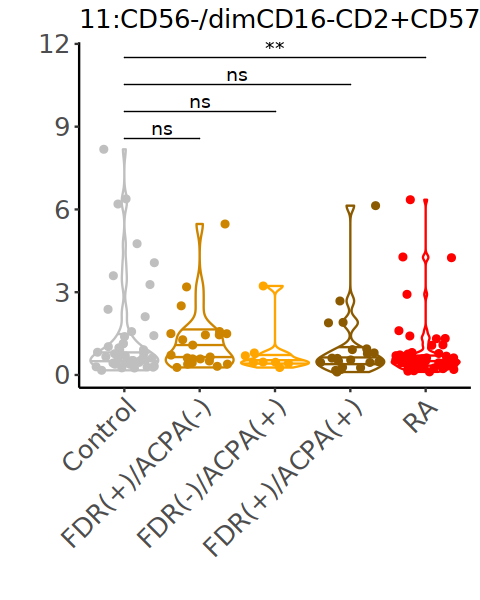

Warning message in wilcox.test.default(c(3.80434782608696, 0.00515756356697096, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(3.80434782608696, 0.00515756356697096, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(3.80434782608696, 0.00515756356697096, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


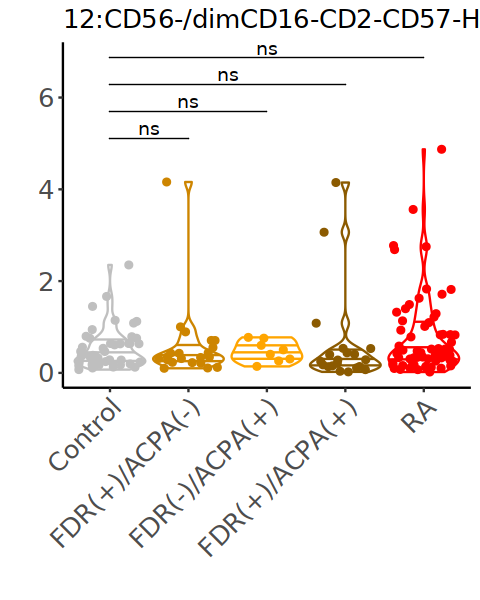

Warning message in wilcox.test.default(c(1.37144507001588, 0.213589640902416, 0.254418853776111, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


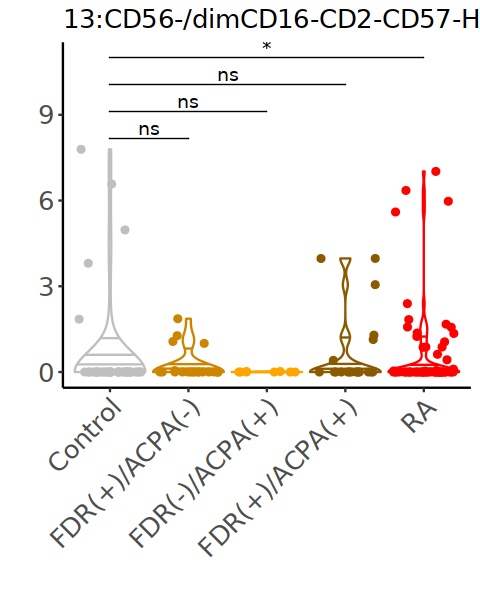

Warning message in wilcox.test.default(c(0.909484625378952, 0.0800961153384061, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.909484625378952, 0.0800961153384061, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.909484625378952, 0.0800961153384061, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


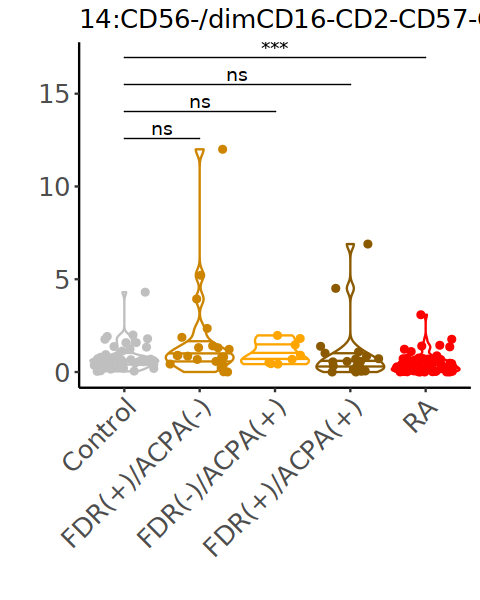

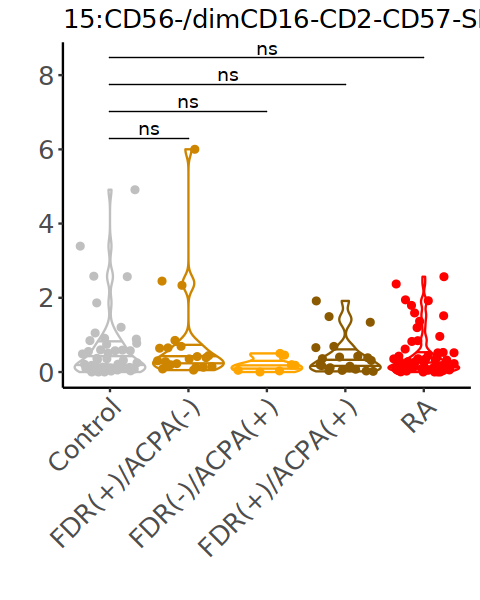

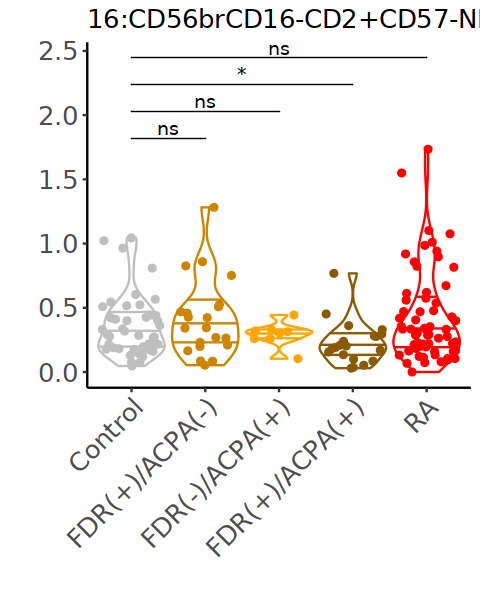

In [27]:
options(repr.plot.height = 5, repr.plot.width = 4)

for (clu in unique(umap_res$res_cell)[order(as.integer(unique(umap_res$res_cell)))]){
    
    # For each subject, make rows that says 0 if the cells belonging to each cluster are 0
  tmp = data.frame(subject_id = umap_res$subject_id, cluster = umap_res$res_cell, AtRisk = umap_res$AtRisk) %>%
    dplyr::mutate(AtRisk = ifelse(AtRisk=="FDR(-)/ACPA(-)","Control",as.character(AtRisk))) %>%
    dplyr::group_by(subject_id,AtRisk,cluster) %>%
    dplyr::summarize(count = dplyr::n()) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(subject_id) %>%
    dplyr::mutate(proportion = 100*count/sum(count)) %>%
    dplyr::filter(cluster==clu) %>%
    dplyr::group_by(AtRisk,cluster) %>%
    dplyr::summarize(count = dplyr::n()) %>%
    dplyr::ungroup() %>%
    dplyr::arrange(AtRisk)
  for (dis in c("Control","FDR(+)/ACPA(-)","FDR(-)/ACPA(+)","FDR(+)/ACPA(+)","RA")){
    if(!(dis %in% tmp$AtRisk)){
      tmp = tmp %>%
        dplyr::add_row(AtRisk = dis, cluster = clu, count = 0)
    }
  }
  tmp = cbind(
    tmp,
    all_count = umap_res %>%
      dplyr::mutate(AtRisk = ifelse(AtRisk=="FDR(-)/ACPA(-)","Control",as.character(AtRisk))) %>%
      dplyr::distinct(AtRisk,subject_id) %>%
      dplyr::group_by(AtRisk) %>%
      dplyr::summarize(all_count = dplyr::n()) %>%
      .$all_count
  ) %>%
    dplyr::mutate(diff = all_count-count)
  
  tmp = rbind(
    data.frame(subject_id = rep("Control",tmp[tmp$AtRisk == "Control",]$diff), 
               cluster = rep(clu,tmp[tmp$AtRisk == "Control",]$diff), 
               count = rep(0,tmp[tmp$AtRisk == "Control",]$diff), 
               proportion = rep(0,tmp[tmp$AtRisk == "Control",]$diff), 
               AtRisk = rep("Control",tmp[tmp$AtRisk == "Control",]$diff)
    ),
    data.frame(subject_id = rep("FDR(+)/ACPA(-)",tmp[tmp$AtRisk == "FDR(+)/ACPA(-)",]$diff), 
               cluster = rep(clu,tmp[tmp$AtRisk == "FDR(+)/ACPA(-)",]$diff), 
               count = rep(0,tmp[tmp$AtRisk == "FDR(+)/ACPA(-)",]$diff), 
               proportion = rep(0,tmp[tmp$AtRisk == "FDR(+)/ACPA(-)",]$diff), 
               AtRisk = rep("FDR(+)/ACPA(-)",tmp[tmp$AtRisk == "FDR(+)/ACPA(-)",]$diff)
    ),
    data.frame(subject_id = rep("FDR(-)/ACPA(+)",tmp[tmp$AtRisk == "FDR(-)/ACPA(+)",]$diff), 
               cluster = rep(clu,tmp[tmp$AtRisk == "FDR(-)/ACPA(+)",]$diff), 
               count = rep(0,tmp[tmp$AtRisk == "FDR(-)/ACPA(+)",]$diff), 
               proportion = rep(0,tmp[tmp$AtRisk == "FDR(-)/ACPA(+)",]$diff), 
               AtRisk = rep("FDR(-)/ACPA(+)",tmp[tmp$AtRisk == "FDR(-)/ACPA(+)",]$diff)
    ),
    data.frame(subject_id = rep("FDR(+)/ACPA(+)",tmp[tmp$AtRisk == "FDR(+)/ACPA(+)",]$diff), 
               cluster = rep(clu,tmp[tmp$AtRisk == "FDR(+)/ACPA(+)",]$diff), 
               count = rep(0,tmp[tmp$AtRisk == "FDR(+)/ACPA(+)",]$diff), 
               proportion = rep(0,tmp[tmp$AtRisk == "FDR(+)/ACPA(+)",]$diff), 
               AtRisk = rep("FDR(+)/ACPA(+)",tmp[tmp$AtRisk == "FDR(+)/ACPA(+)",]$diff)
    ),
    data.frame(subject_id = rep("RA",ifelse(tmp[tmp$AtRisk == "RA",]$diff>0,tmp[tmp$AtRisk == "RA",]$diff,0)), 
               cluster = rep(clu,ifelse(tmp[tmp$AtRisk == "RA",]$diff>0,tmp[tmp$AtRisk == "RA",]$diff,0)), 
               count = rep(0,ifelse(tmp[tmp$AtRisk == "RA",]$diff>0,tmp[tmp$AtRisk == "RA",]$diff,0)), 
               proportion = rep(0,ifelse(tmp[tmp$AtRisk == "RA",]$diff>0,tmp[tmp$AtRisk == "RA",]$diff,0)),  
               AtRisk = rep("RA",ifelse(tmp[tmp$AtRisk == "RA",]$diff>0,tmp[tmp$AtRisk == "RA",]$diff,0))
    )
  )
  
  plot(
    data.frame(subject_id = umap_res$subject_id, cluster = umap_res$res_cell, AtRisk = umap_res$AtRisk) %>%
      dplyr::mutate(AtRisk = ifelse(AtRisk=="FDR(-)/ACPA(-)","Control",as.character(AtRisk))) %>%
      dplyr::group_by(subject_id,AtRisk,cluster) %>%
      dplyr::summarize(count = dplyr::n()) %>%
      dplyr::ungroup() %>%
      dplyr::group_by(subject_id) %>%
      dplyr::mutate(proportion = 100*count/sum(count)) %>%
      dplyr::filter(cluster==clu) %>%
      rbind(.,tmp) %>%
      dplyr::mutate(AtRisk = factor(AtRisk,levels=c("Control","FDR(+)/ACPA(-)","FDR(-)/ACPA(+)","FDR(+)/ACPA(+)","RA"))) %>%
      ggplot(., aes(x = AtRisk, y=proportion, fill = cluster)) + 
      geom_violin(aes(color = AtRisk), fill = "white", scale = "width", draw_quantiles = c(0.25, 0.5, 0.75)) +
      geom_jitter(aes(fill = AtRisk, color = AtRisk)) +
      ggpubr::stat_compare_means(
        comparisons = list(c("Control", "FDR(+)/ACPA(-)"), c("Control", "FDR(-)/ACPA(+)"), c("Control", "FDR(+)/ACPA(+)"), c("Control", "RA")), 
        label = "p.signif",
        tip.length = 0
      ) +
      scale_fill_manual(values=c("Control" = "grey75","FDR(-)/ACPA(+)" = "orange","FDR(+)/ACPA(-)" = "orange3","FDR(+)/ACPA(+)" = "orange4","RA" = "red")) +
      scale_color_manual(values=c("Control" = "grey75","FDR(-)/ACPA(+)" = "orange","FDR(+)/ACPA(-)" = "orange3","FDR(+)/ACPA(+)" = "orange4","RA" = "red")) + 
      theme_classic() +
      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
            strip.text.y=element_text(size=15, color="black", face="bold"),
            legend.position = "none",
            plot.title = element_text(size=15),
            axis.title.x = element_text(size=15),
            axis.title.y = element_text(size =15),
            axis.text.y = element_text(size = 15),
            axis.text.x = element_text(size = 15, angle = 45, hjust=1),
            legend.text =  element_text(size = 15),
            legend.key.size = grid::unit(0.5, "lines"),
            legend.title = element_text(size = 0.8, hjust = 0)) +
      labs(title = paste(clu,unique(cluster_df[cluster_df$cluster==clu,]$clu_name),sep=":"),
           x = "",
           y = "") 
    
  )
}



[1] "CD107a"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00813
2 AtRiskRA  0.141  
3 RA        0.00667


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


[1] "CD11b"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.0460 
2 AtRiskRA  0.0799 
3 RA        0.00712


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


[1] "CD16"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.51
2 AtRiskRA   1.51
3 RA         1.58


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


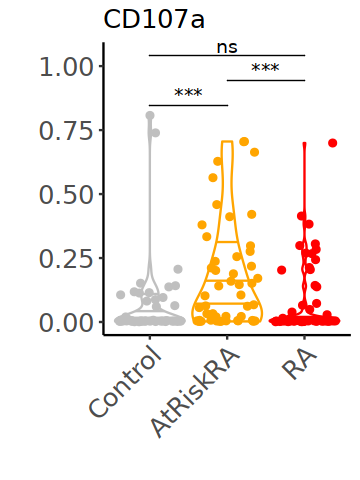

[1] "CD172ab"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00271
2 AtRiskRA  0.00437
3 RA        0.00211


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


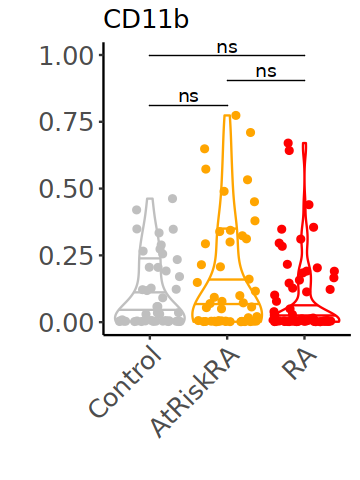

[1] "CD2"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.50
2 AtRiskRA   1.53
3 RA         1.56


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


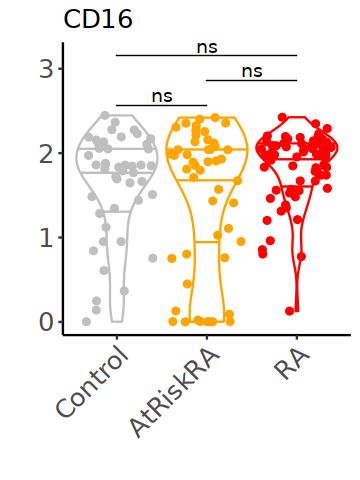

[1] "CD20"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000919
2 AtRiskRA  0.000978
3 RA        0.000893


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


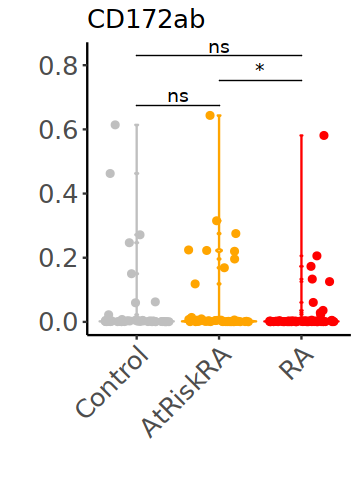

[1] "CD3"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00111
2 AtRiskRA  0.00115
3 RA        0.00109


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


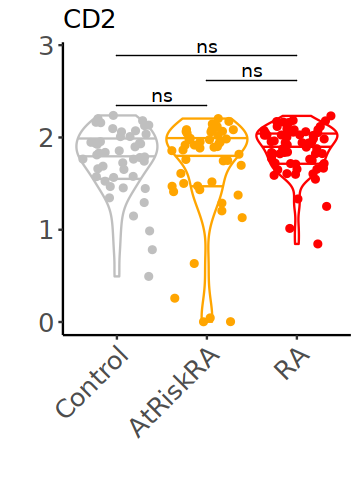

[1] "CD38"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.35
2 AtRiskRA   1.42
3 RA         1.46


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


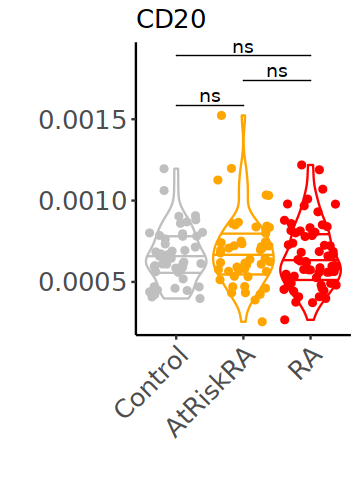

[1] "CD39"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00204
2 AtRiskRA  0.00205
3 RA        0.00213


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


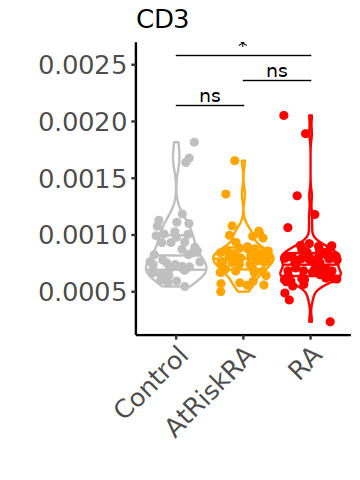

[1] "CD3z"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.79
2 AtRiskRA   1.79
3 RA         1.81


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


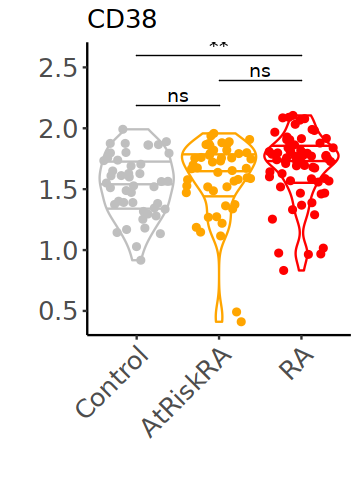

[1] "CD4"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00123
2 AtRiskRA  0.00118
3 RA        0.00110


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


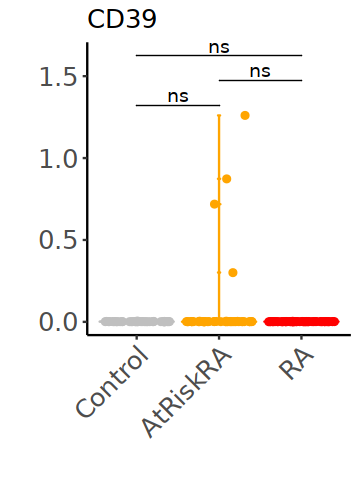

[1] "CD45"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.36
2 AtRiskRA   1.41
3 RA         1.55


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


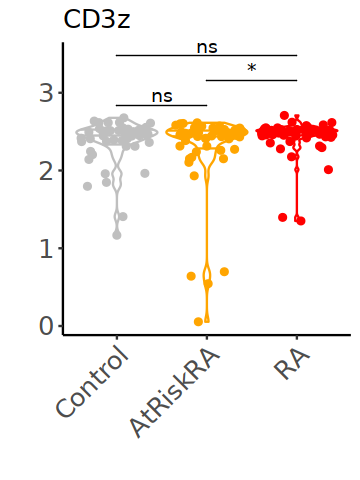

[1] "CD56"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.13
2 AtRiskRA   1.17
3 RA         1.25


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


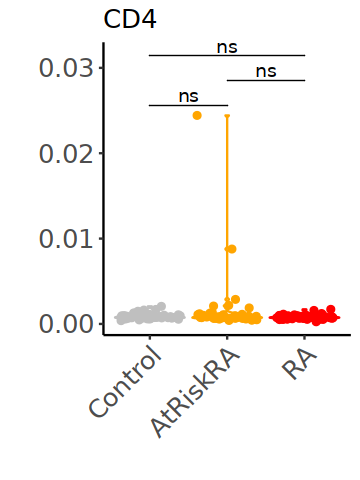

[1] "CD57"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.24
2 AtRiskRA   1.46
3 RA         1.61


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


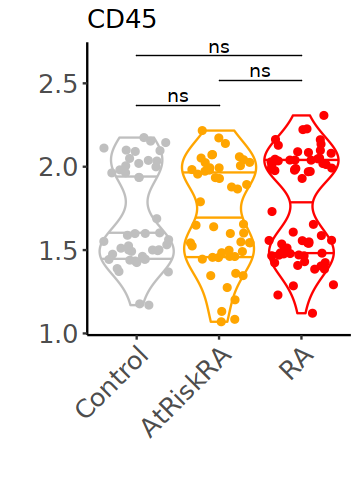

[1] "CD69"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00332
2 AtRiskRA  0.00297
3 RA        0.00380


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


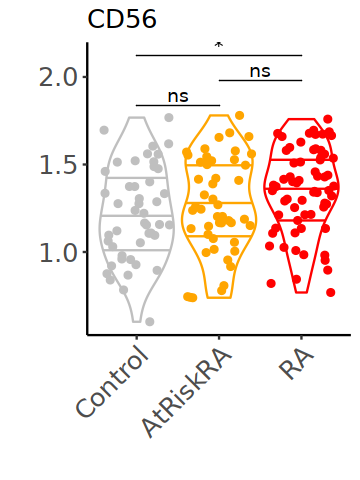

[1] "CD7"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.80
2 AtRiskRA   1.81
3 RA         1.81


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


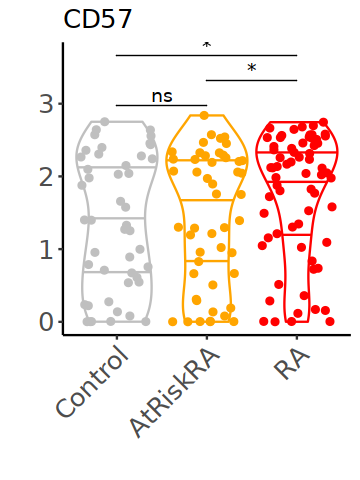

[1] "CD8a"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00217
2 AtRiskRA  0.00249
3 RA        0.00207


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


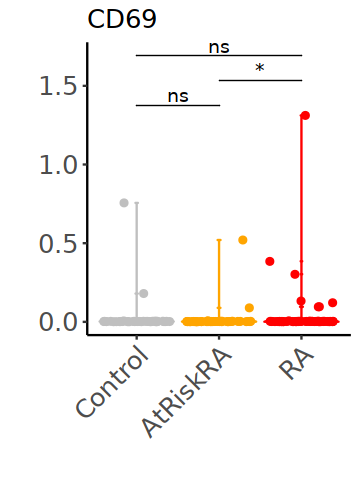

[1] "CD8b"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00128
2 AtRiskRA  0.00124
3 RA        0.00127


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


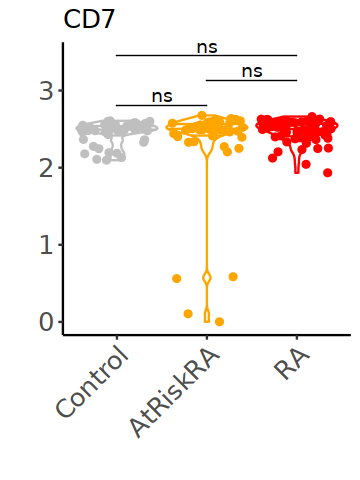

[1] "CXCR6"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000881
2 AtRiskRA  0.000961
3 RA        0.000994


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


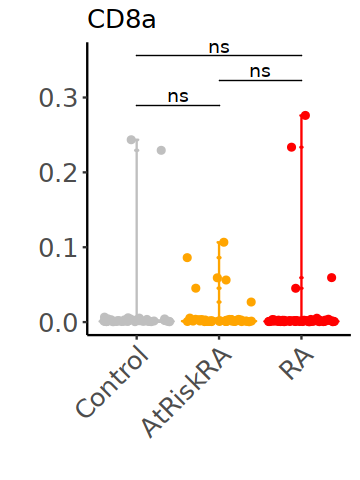

[1] "DAP12"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.41
2 AtRiskRA   1.46
3 RA         1.45


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


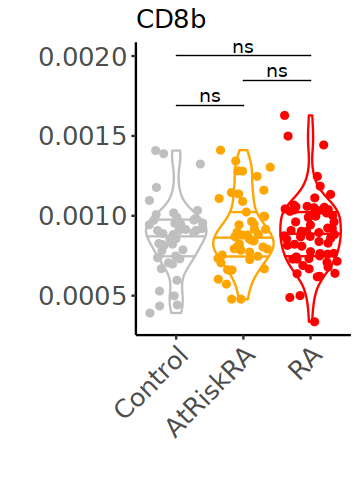

[1] "EOMES"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control   0.920
2 AtRiskRA  1.04 
3 RA        1.04 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


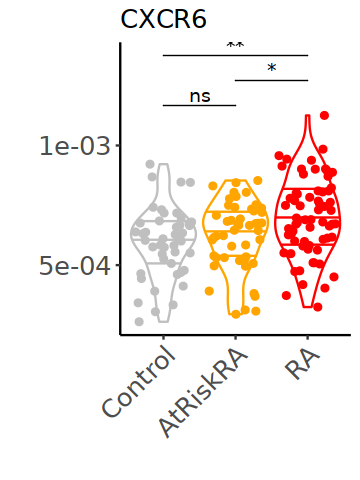

[1] "GNLY"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.75
2 AtRiskRA   1.75
3 RA         1.76


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


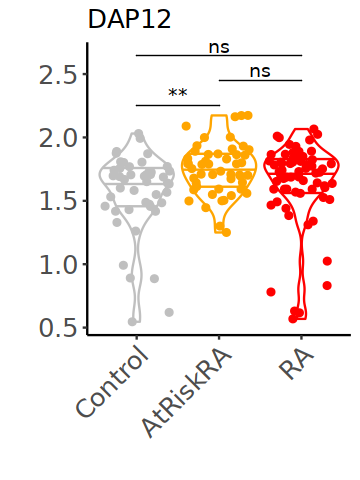

[1] "GZMA"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.45
2 AtRiskRA   1.50
3 RA         1.56


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


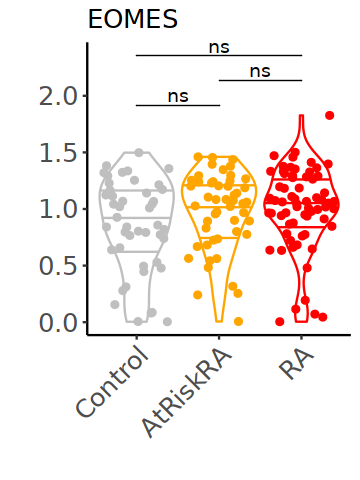

[1] "GZMB"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.73
2 AtRiskRA   1.72
3 RA         1.79


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


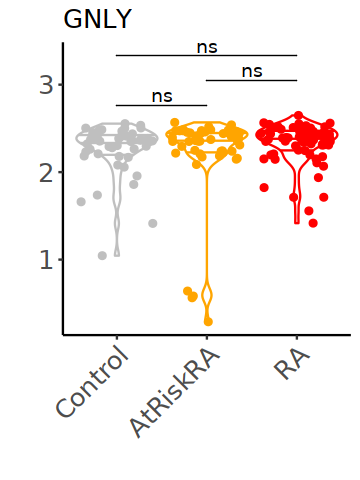

[1] "GZMK"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00339
2 AtRiskRA  0.00381
3 RA        0.00338


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


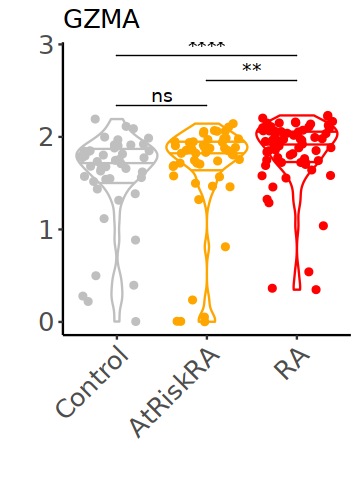

[1] "HLA-DR"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00378
2 AtRiskRA  0.00437
3 RA        0.00394


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


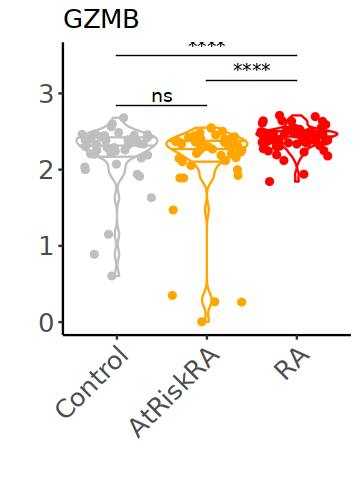

[1] "KIR2DS1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00130
2 AtRiskRA  0.00151
3 RA        0.00175


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


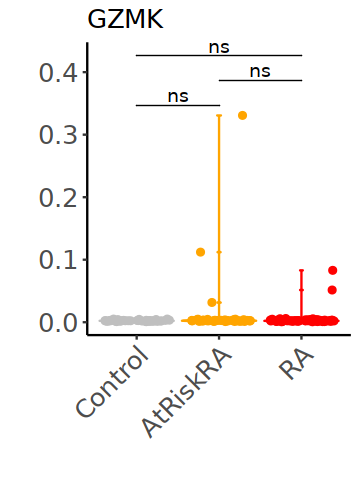

[1] "KIR2DS2"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000376
2 AtRiskRA  0.000344
3 RA        0.000372


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


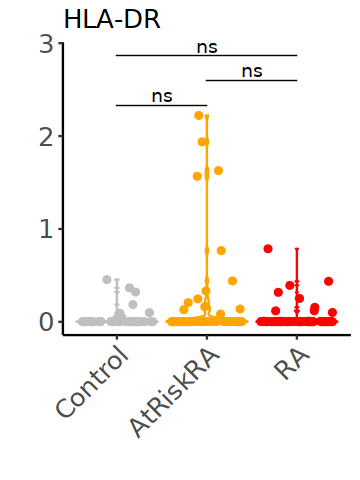

[1] "Ki67"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00510
2 AtRiskRA  0.00565
3 RA        0.00586


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


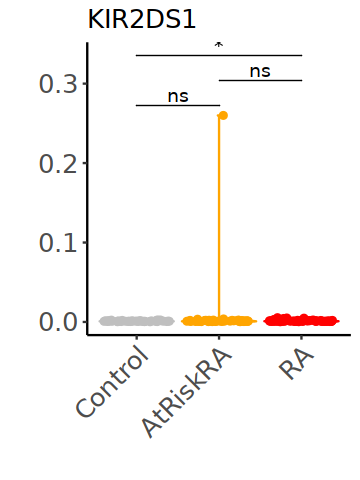

[1] "MR-1-tet"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000433
2 AtRiskRA  0.000461
3 RA        0.000424


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


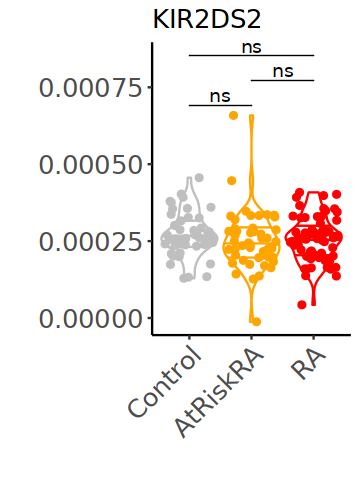

[1] "NKG2C"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00159
2 AtRiskRA  0.00138
3 RA        0.00144


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


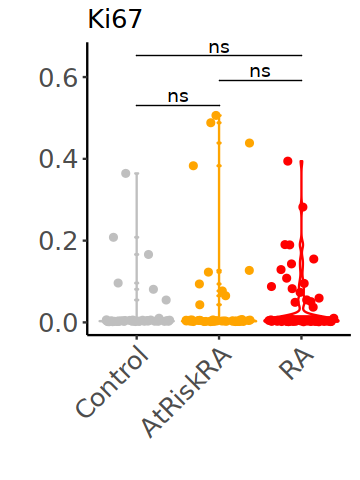

[1] "NKG2D"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.05
2 AtRiskRA   1.05
3 RA         1.08


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


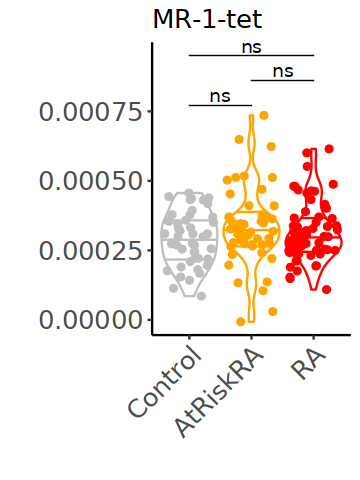

[1] "NKp30"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.09
2 AtRiskRA   1.17
3 RA         1.15


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


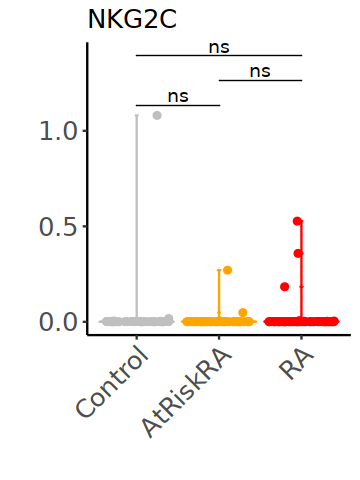

[1] "NKp46"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.17
2 AtRiskRA   1.11
3 RA         1.19


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


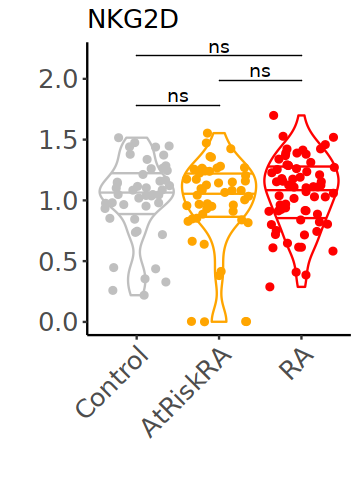

[1] "NKp80"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.23
2 AtRiskRA   1.27
3 RA         1.25


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


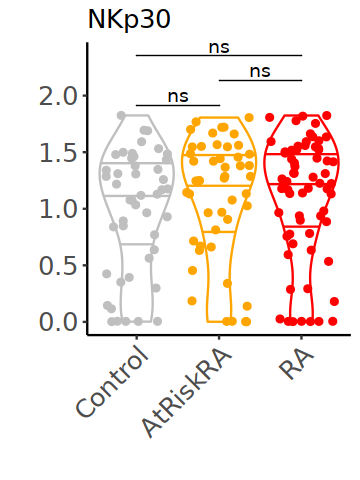

[1] "PLZF"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control   0.548
2 AtRiskRA  0.785
3 RA        0.766


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


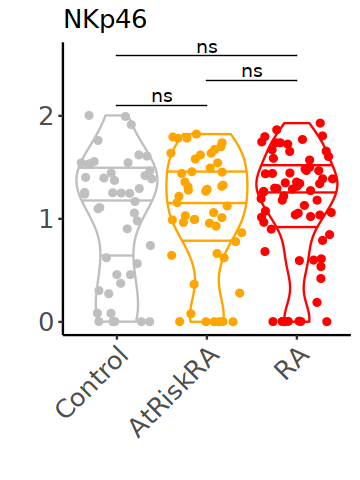

[1] "PSGL-1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00491
2 AtRiskRA  0.00462
3 RA        0.00450


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


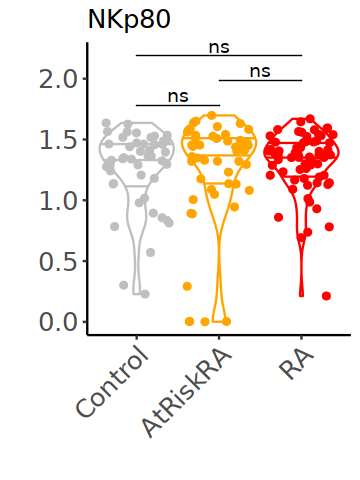

[1] "Perforin"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.84
2 AtRiskRA   1.84
3 RA         1.85


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


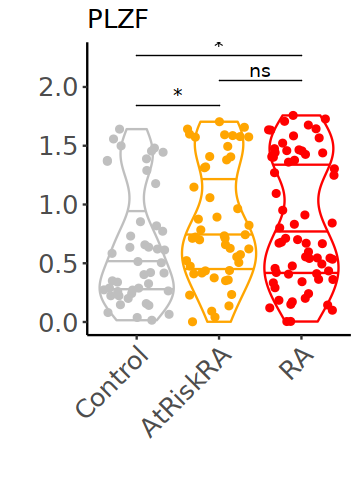

[1] "SH2D1A"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.49
2 AtRiskRA   1.49
3 RA         1.49


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


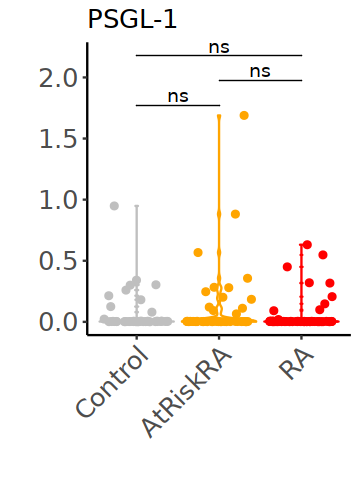

[1] "SLAMF6"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.11
2 AtRiskRA   1.11
3 RA         1.15


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


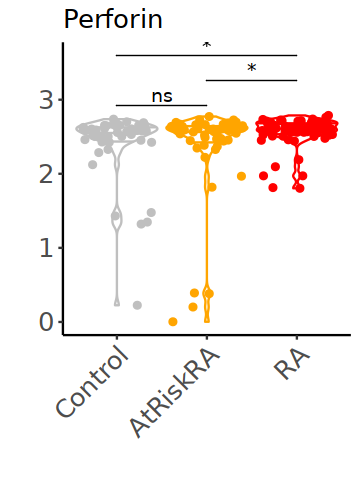

[1] "TCRVd1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000366
2 AtRiskRA  0.000376
3 RA        0.000366


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


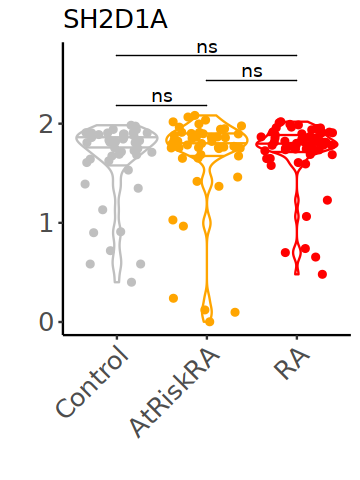

[1] "TCRVd2"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000560
2 AtRiskRA  0.000565
3 RA        0.000583


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


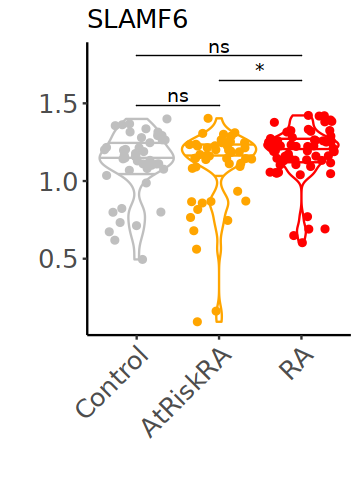

[1] "TCRab"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00287
2 AtRiskRA  0.00359
3 RA        0.00288


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


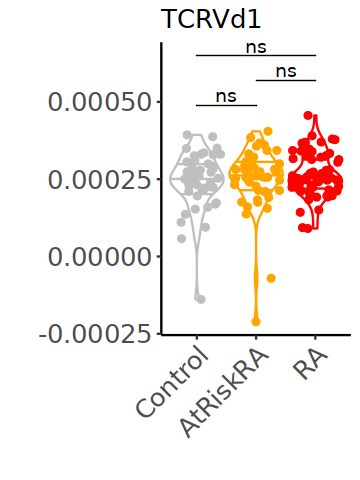

[1] "TCRgd"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00158
2 AtRiskRA  0.00154
3 RA        0.00151


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


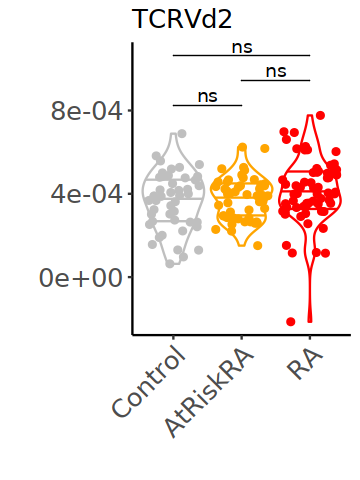

[1] "Tbet"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.62
2 AtRiskRA   1.65
3 RA         1.67


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


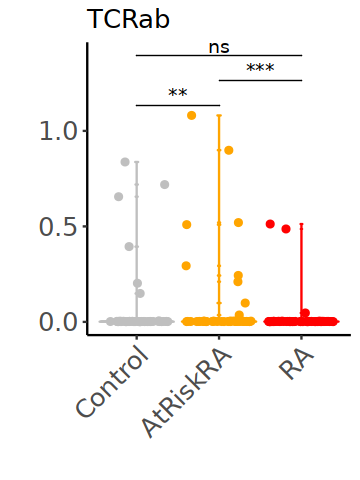

[1] "iNKT"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000713
2 AtRiskRA  0.000673
3 RA        0.000800


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


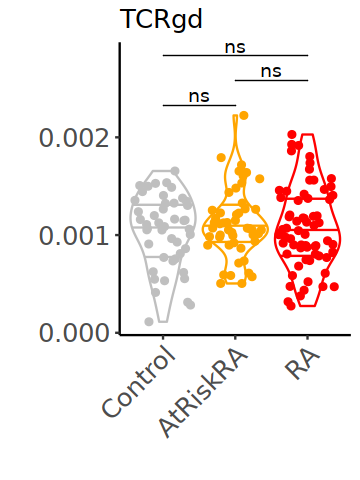

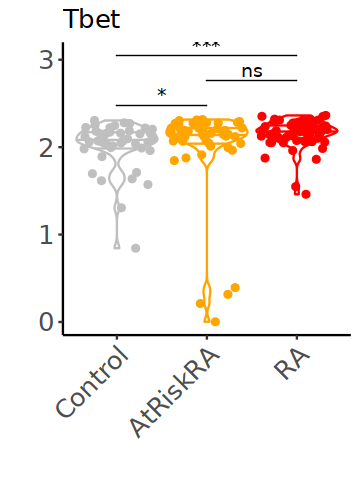

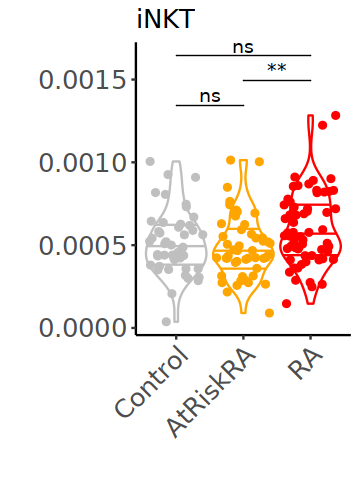

In [28]:

markers = c('CD107a','CD11b','CD16','CD172ab','CD2','CD20','CD3','CD38','CD39','CD3z','CD4','CD45','CD56','CD57','CD69','CD7','CD8a','CD8b','CXCR6','DAP12','EOMES','GNLY','GZMA','GZMB','GZMK','HLA-DR','KIR2DS1','KIR2DS2','Ki67','MR-1-tet','NKG2C','NKG2D','NKp30','NKp46','NKp80','PLZF','PSGL-1','Perforin','SH2D1A','SLAMF6','TCRVd1','TCRVd2','TCRab','TCRgd','Tbet','iNKT')
options(repr.plot.height = 4, repr.plot.width = 3)
for (gene in markers){
    print(gene)
    
    data.frame(ph_markers_data_arcsinh, subject_id = umap_res$subject_id, condition = umap_res$disease) %>% 
        dplyr::mutate(expr = ph_markers_data_arcsinh[,grepl(paste0("^",gene,"$"),colnames(ph_markers_data_arcsinh))]) %>%
        dplyr::group_by(subject_id, condition) %>%
        dplyr::summarize(med = quantile(log2(expr+1), probs = c(0.5))) %>%
        dplyr::ungroup() %>%
        dplyr::group_by(condition) %>%
        dplyr::summarize(med = quantile(log2(med+1), probs = c(0.5))) %>% print()
    plot(
        data.frame(ph_markers_data_arcsinh, subject_id = umap_res$subject_id, condition = umap_res$disease) %>% 
            dplyr::mutate(expr = ph_markers_data_arcsinh[,grepl(paste0("^",gene,"$"),colnames(ph_markers_data_arcsinh))]) %>%
            dplyr::group_by(subject_id, condition) %>%
            dplyr::summarize(med = quantile(log2(expr+1), probs = c(0.5))) %>%
            ggplot(., aes(x = condition, y=med, fill = condition, color = condition)) + 
                      geom_violin(aes(color = condition), fill = "white", scale = "width", draw_quantiles = c(0.25, 0.5, 0.75)) +
                      geom_jitter(aes(fill = condition, color = condition)) +
                      ggpubr::stat_compare_means(
                        comparisons = list(c("Control", "AtRiskRA"), c("AtRiskRA", "RA"),  c("Control", "RA")), 
                        label = "p.signif",
                        tip.length = 0
                        ) +
                      scale_fill_manual(values = c("Control" = "grey75","AtRiskRA" = "orange","RA" = "red")) +
                      scale_color_manual(values = c("Control" = "grey75","AtRiskRA" = "orange","RA" = "red")) +
                      theme_classic() +
                      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
                            strip.text.y=element_text(size=15, color="black", face="bold"),
                            legend.position = "none",
                            plot.title = element_text(size=15),
                            axis.title.x = element_text(size=15),
                            axis.title.y = element_text(size =15),
                            axis.text.y = element_text(size = 15),
                            axis.text.x = element_text(size = 15, angle = 45, hjust=1),
                            legend.text =  element_text(size = 15),
                            legend.key.size = grid::unit(0.5, "lines"),
                            legend.title = element_text(size = 0.8, hjust = 0)) +
                      labs(title = gene,
                           x = "",
                           y = "") 
         )

}



[1] "CD107a"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk             med
  <fct>            <dbl>
1 Control        0.00846
2 FDR(-)/ACPA(-) 0.00621
3 FDR(+)/ACPA(-) 0.0862 
4 FDR(-)/ACPA(+) 0.289  
5 FDR(+)/ACPA(+) 0.0911 
6 RA             0.00667


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


[1] "CD11b"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk             med
  <fct>            <dbl>
1 Control        0.0429 
2 FDR(-)/ACPA(-) 0.126  
3 FDR(+)/ACPA(-) 0.0704 
4 FDR(-)/ACPA(+) 0.139  
5 FDR(+)/ACPA(+) 0.0989 
6 RA             0.00712


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


[1] "CD16"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk           med
  <fct>          <dbl>
1 Control         1.50
2 FDR(-)/ACPA(-)  1.52
3 FDR(+)/ACPA(-)  1.49
4 FDR(-)/ACPA(+)  1.58
5 FDR(+)/ACPA(+)  1.52
6 RA              1.58


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


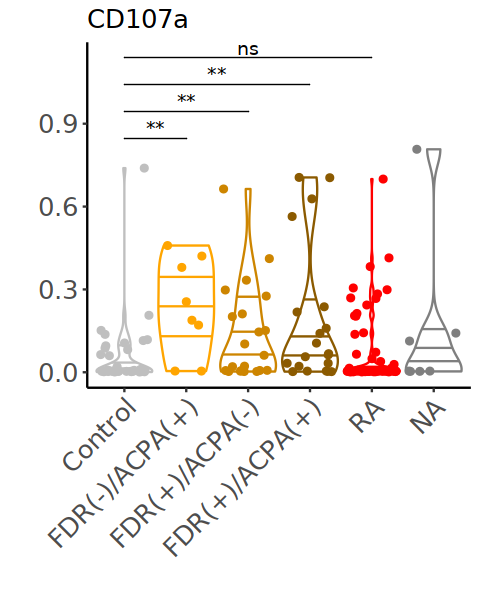

[1] "CD172ab"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk             med
  <fct>            <dbl>
1 Control        0.00291
2 FDR(-)/ACPA(-) 0.00183
3 FDR(+)/ACPA(-) 0.00268
4 FDR(-)/ACPA(+) 0.00462
5 FDR(+)/ACPA(+) 0.00450
6 RA             0.00211


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


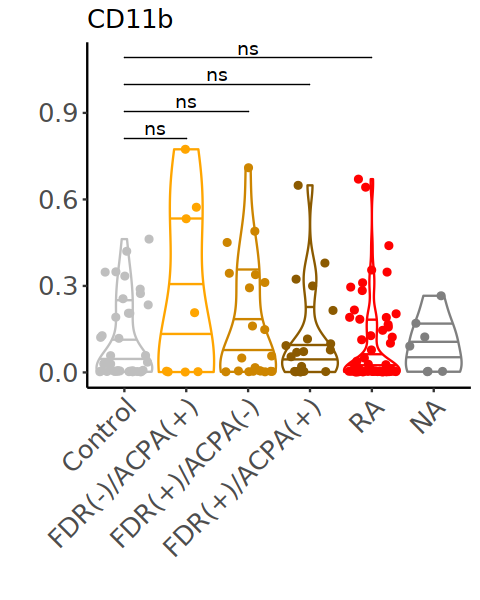

[1] "CD2"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk           med
  <fct>          <dbl>
1 Control         1.51
2 FDR(-)/ACPA(-)  1.41
3 FDR(+)/ACPA(-)  1.54
4 FDR(-)/ACPA(+)  1.49
5 FDR(+)/ACPA(+)  1.52
6 RA              1.56


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


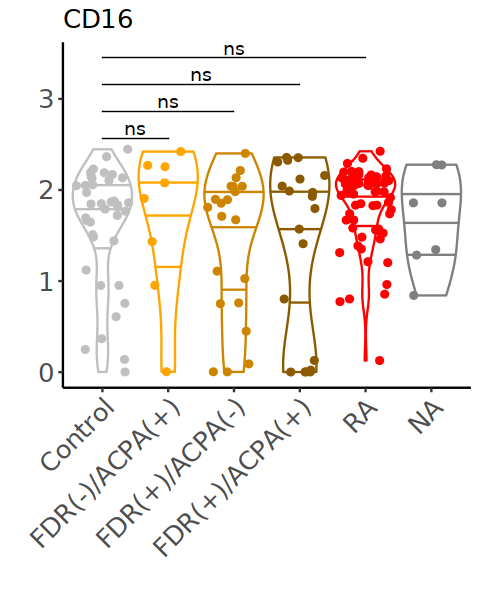

[1] "CD20"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk              med
  <fct>             <dbl>
1 Control        0.000930
2 FDR(-)/ACPA(-) 0.000897
3 FDR(+)/ACPA(-) 0.000929
4 FDR(-)/ACPA(+) 0.000881
5 FDR(+)/ACPA(+) 0.00102 
6 RA             0.000893


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


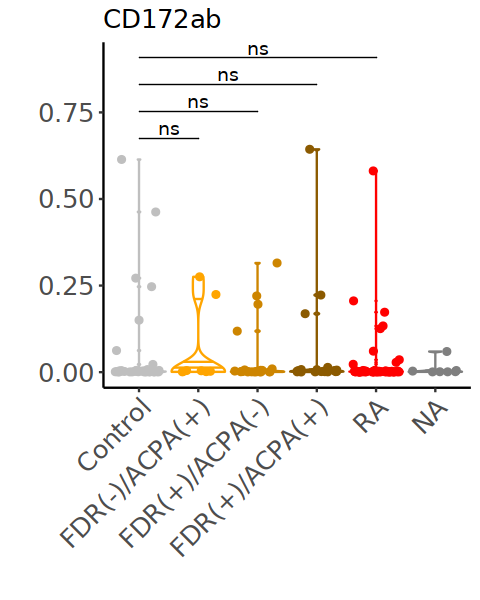

[1] "CD3"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk             med
  <fct>            <dbl>
1 Control        0.00113
2 FDR(-)/ACPA(-) 0.00110
3 FDR(+)/ACPA(-) 0.00119
4 FDR(-)/ACPA(+) 0.00107
5 FDR(+)/ACPA(+) 0.00116
6 RA             0.00109


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


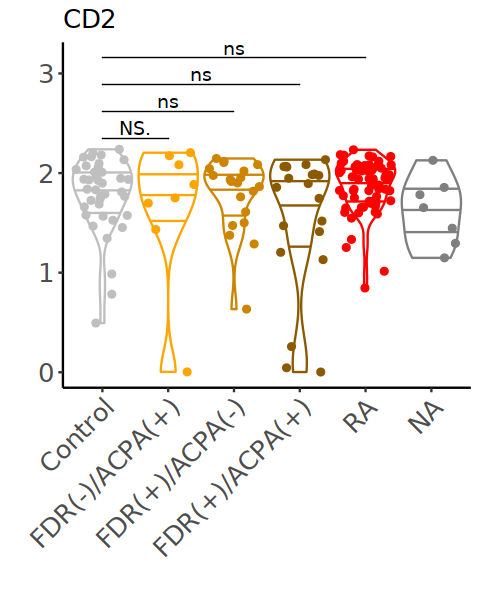

[1] "CD38"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk           med
  <fct>          <dbl>
1 Control         1.35
2 FDR(-)/ACPA(-)  1.38
3 FDR(+)/ACPA(-)  1.44
4 FDR(-)/ACPA(+)  1.35
5 FDR(+)/ACPA(+)  1.41
6 RA              1.46


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


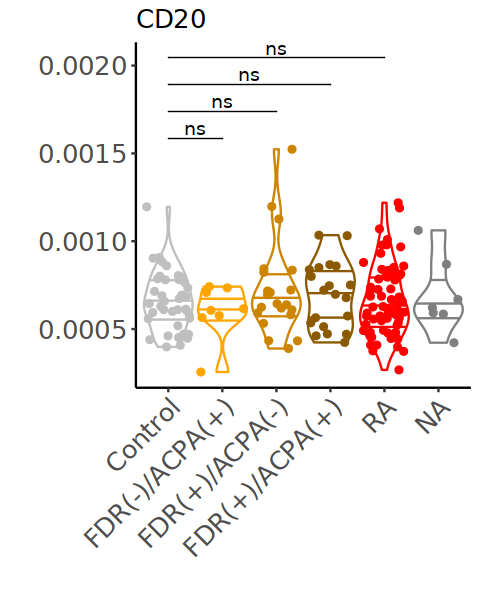

[1] "CD39"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk             med
  <fct>            <dbl>
1 Control        0.00205
2 FDR(-)/ACPA(-) 0.00202
3 FDR(+)/ACPA(-) 0.00223
4 FDR(-)/ACPA(+) 0.00178
5 FDR(+)/ACPA(+) 0.00203
6 RA             0.00213


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


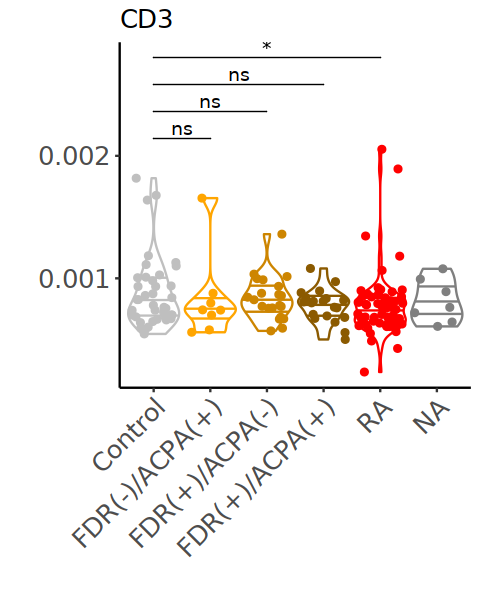

[1] "CD3z"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk           med
  <fct>          <dbl>
1 Control         1.80
2 FDR(-)/ACPA(-)  1.78
3 FDR(+)/ACPA(-)  1.78
4 FDR(-)/ACPA(+)  1.80
5 FDR(+)/ACPA(+)  1.79
6 RA              1.81


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


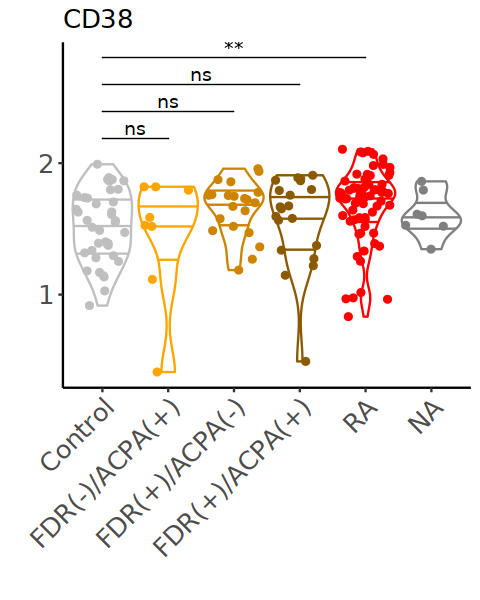

[1] "CD4"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk             med
  <fct>            <dbl>
1 Control        0.00122
2 FDR(-)/ACPA(-) 0.00124
3 FDR(+)/ACPA(-) 0.00118
4 FDR(-)/ACPA(+) 0.00120
5 FDR(+)/ACPA(+) 0.00118
6 RA             0.00110


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


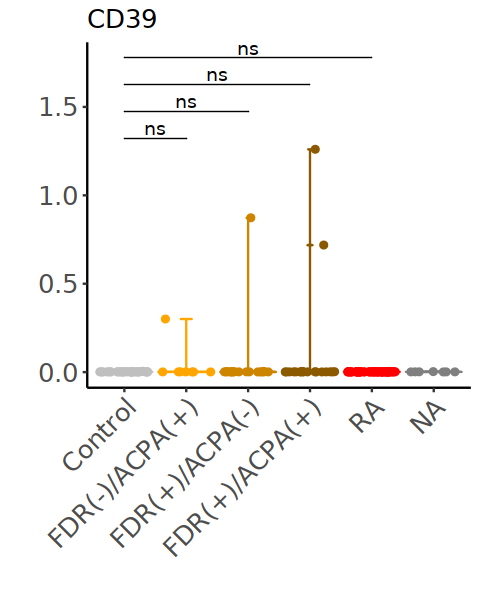

[1] "CD45"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk           med
  <fct>          <dbl>
1 Control         1.35
2 FDR(-)/ACPA(-)  1.57
3 FDR(+)/ACPA(-)  1.40
4 FDR(-)/ACPA(+)  1.56
5 FDR(+)/ACPA(+)  1.36
6 RA              1.55


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


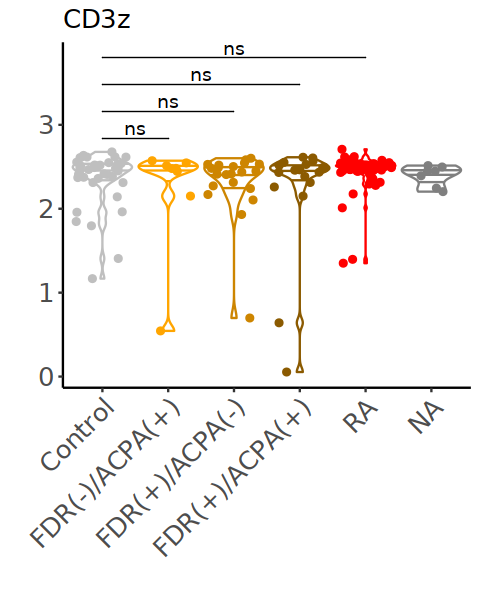

[1] "CD56"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk           med
  <fct>          <dbl>
1 Control         1.11
2 FDR(-)/ACPA(-)  1.31
3 FDR(+)/ACPA(-)  1.20
4 FDR(-)/ACPA(+)  1.23
5 FDR(+)/ACPA(+)  1.12
6 RA              1.25


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


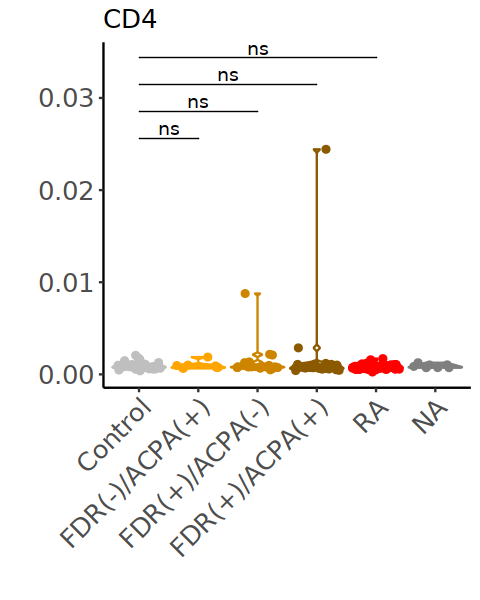

[1] "CD57"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk           med
  <fct>          <dbl>
1 Control        1.37 
2 FDR(-)/ACPA(-) 0.687
3 FDR(+)/ACPA(-) 1.26 
4 FDR(-)/ACPA(+) 1.65 
5 FDR(+)/ACPA(+) 1.33 
6 RA             1.61 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


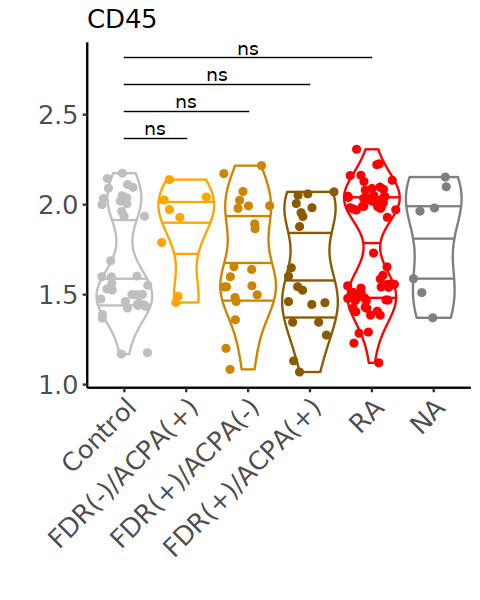

[1] "CD69"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk             med
  <fct>            <dbl>
1 Control        0.00374
2 FDR(-)/ACPA(-) 0.00204
3 FDR(+)/ACPA(-) 0.00335
4 FDR(-)/ACPA(+) 0.00293
5 FDR(+)/ACPA(+) 0.00296
6 RA             0.00380


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


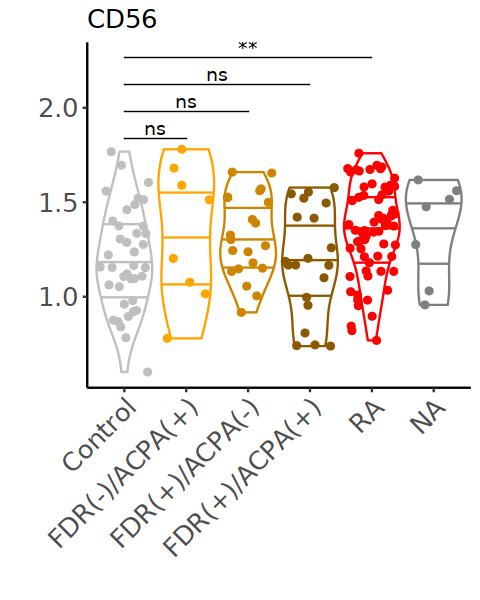

[1] "CD7"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk           med
  <fct>          <dbl>
1 Control         1.80
2 FDR(-)/ACPA(-)  1.80
3 FDR(+)/ACPA(-)  1.83
4 FDR(-)/ACPA(+)  1.82
5 FDR(+)/ACPA(+)  1.80
6 RA              1.81


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


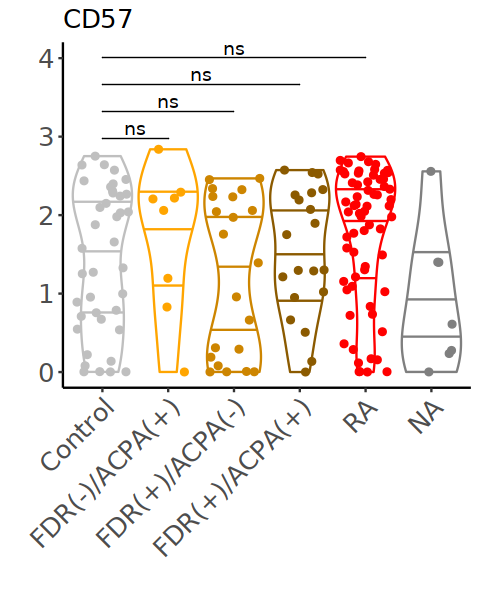

[1] "CD8a"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk             med
  <fct>            <dbl>
1 Control        0.00222
2 FDR(-)/ACPA(-) 0.00160
3 FDR(+)/ACPA(-) 0.00208
4 FDR(-)/ACPA(+) 0.00297
5 FDR(+)/ACPA(+) 0.00267
6 RA             0.00207


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


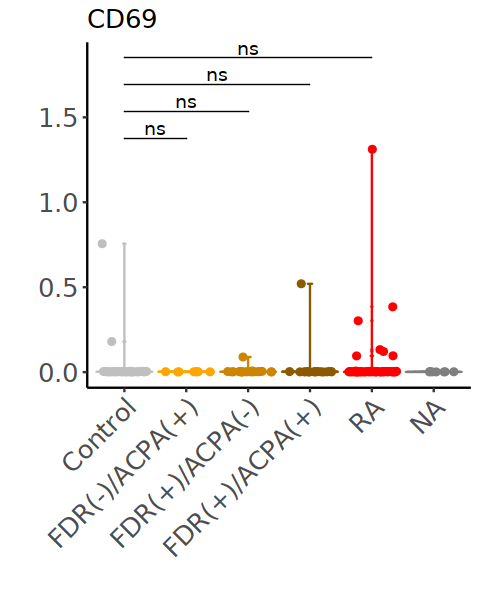

[1] "CD8b"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk             med
  <fct>            <dbl>
1 Control        0.00131
2 FDR(-)/ACPA(-) 0.00108
3 FDR(+)/ACPA(-) 0.00127
4 FDR(-)/ACPA(+) 0.00119
5 FDR(+)/ACPA(+) 0.00123
6 RA             0.00127


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


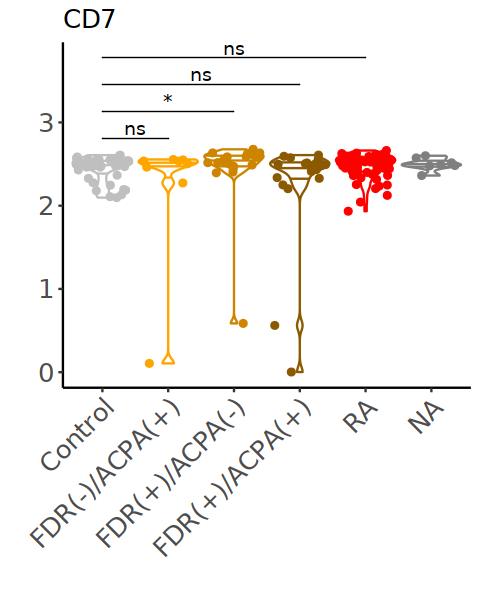

[1] "CXCR6"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk              med
  <fct>             <dbl>
1 Control        0.000883
2 FDR(-)/ACPA(-) 0.000880
3 FDR(+)/ACPA(-) 0.000961
4 FDR(-)/ACPA(+) 0.00103 
5 FDR(+)/ACPA(+) 0.000874
6 RA             0.000994


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


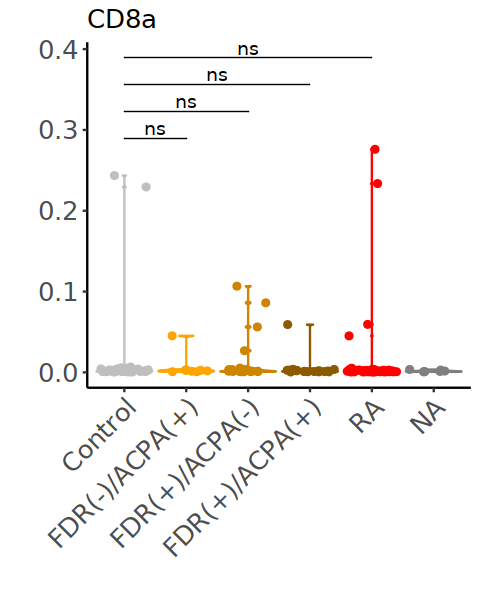

[1] "DAP12"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk           med
  <fct>          <dbl>
1 Control         1.41
2 FDR(-)/ACPA(-)  1.43
3 FDR(+)/ACPA(-)  1.48
4 FDR(-)/ACPA(+)  1.40
5 FDR(+)/ACPA(+)  1.47
6 RA              1.45


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


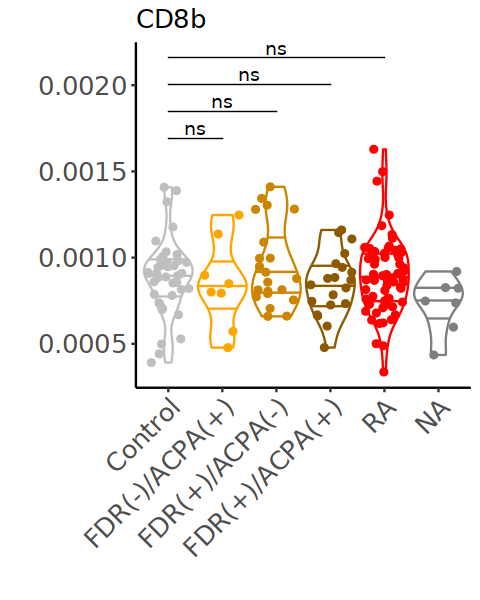

[1] "EOMES"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk           med
  <fct>          <dbl>
1 Control        0.893
2 FDR(-)/ACPA(-) 1.03 
3 FDR(+)/ACPA(-) 1.06 
4 FDR(-)/ACPA(+) 1.05 
5 FDR(+)/ACPA(+) 1.01 
6 RA             1.04 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


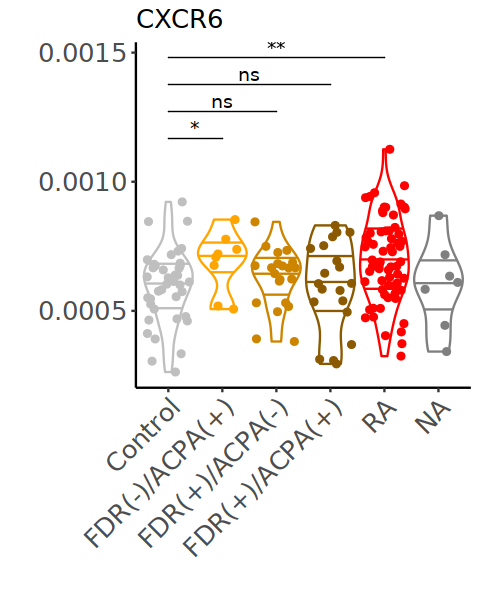

[1] "GNLY"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk           med
  <fct>          <dbl>
1 Control         1.75
2 FDR(-)/ACPA(-)  1.75
3 FDR(+)/ACPA(-)  1.76
4 FDR(-)/ACPA(+)  1.75
5 FDR(+)/ACPA(+)  1.75
6 RA              1.76


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


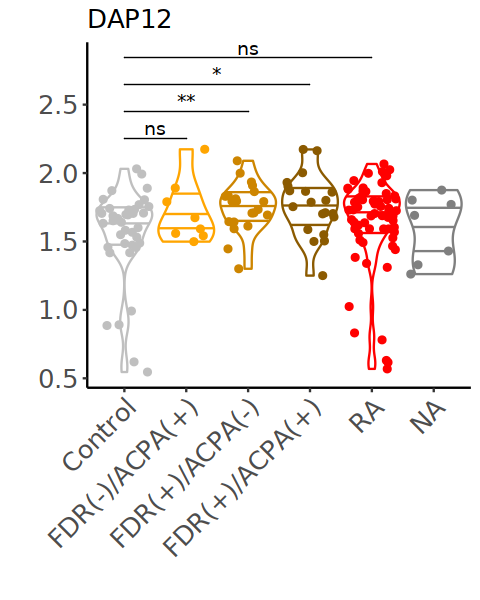

[1] "GZMA"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk           med
  <fct>          <dbl>
1 Control         1.44
2 FDR(-)/ACPA(-)  1.51
3 FDR(+)/ACPA(-)  1.50
4 FDR(-)/ACPA(+)  1.52
5 FDR(+)/ACPA(+)  1.49
6 RA              1.56


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


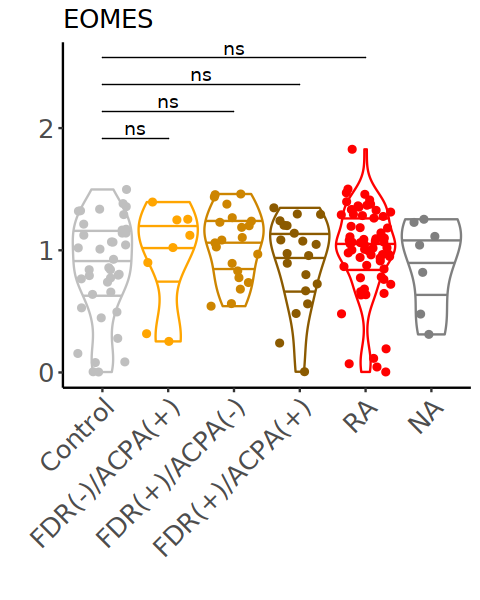

[1] "GZMB"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk           med
  <fct>          <dbl>
1 Control         1.73
2 FDR(-)/ACPA(-)  1.69
3 FDR(+)/ACPA(-)  1.71
4 FDR(-)/ACPA(+)  1.73
5 FDR(+)/ACPA(+)  1.72
6 RA              1.79


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


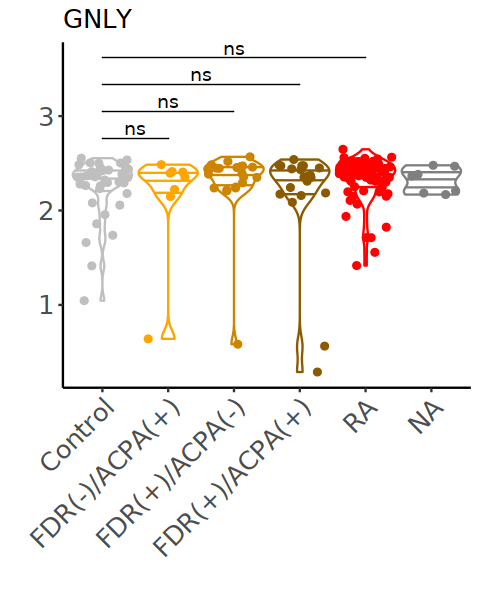

[1] "GZMK"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk             med
  <fct>            <dbl>
1 Control        0.00339
2 FDR(-)/ACPA(-) 0.00404
3 FDR(+)/ACPA(-) 0.00416
4 FDR(-)/ACPA(+) 0.00336
5 FDR(+)/ACPA(+) 0.00326
6 RA             0.00338


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


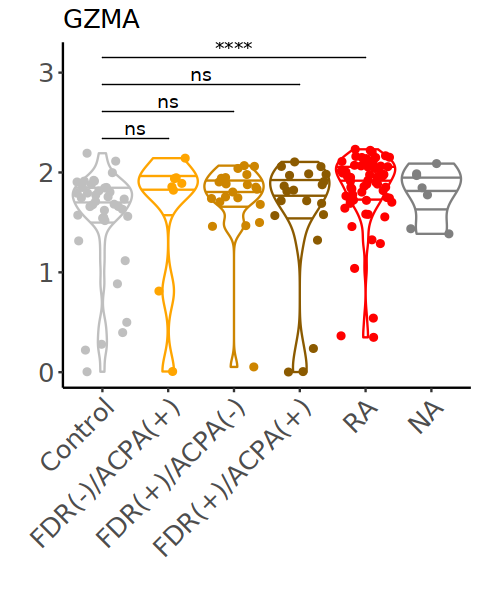

[1] "HLA-DR"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk             med
  <fct>            <dbl>
1 Control        0.00442
2 FDR(-)/ACPA(-) 0.00374
3 FDR(+)/ACPA(-) 0.00437
4 FDR(-)/ACPA(+) 0.00421
5 FDR(+)/ACPA(+) 0.00425
6 RA             0.00394


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


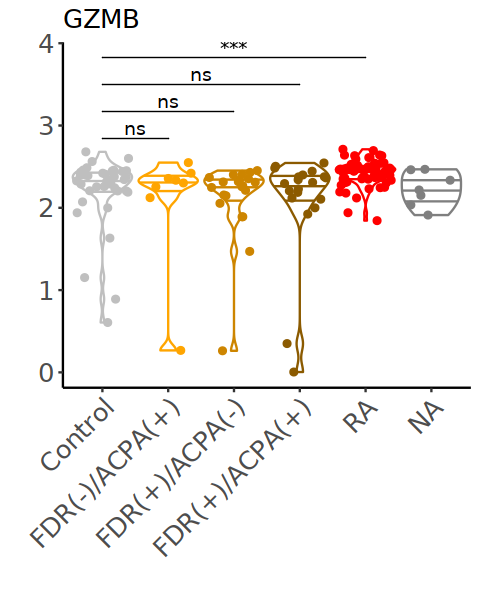

[1] "KIR2DS1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk             med
  <fct>            <dbl>
1 Control        0.00131
2 FDR(-)/ACPA(-) 0.00120
3 FDR(+)/ACPA(-) 0.00144
4 FDR(-)/ACPA(+) 0.00159
5 FDR(+)/ACPA(+) 0.00158
6 RA             0.00175


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


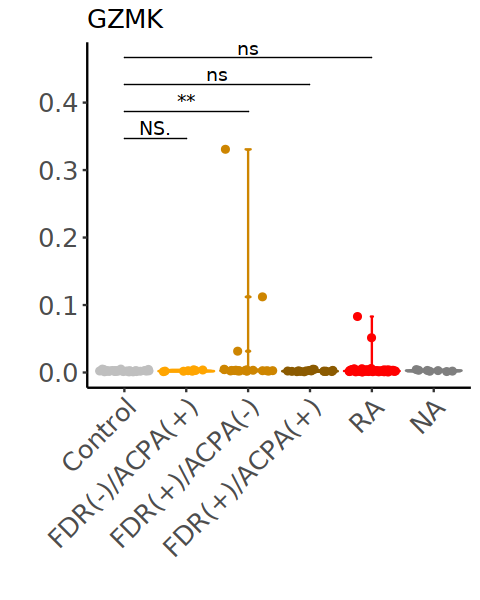

[1] "KIR2DS2"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk              med
  <fct>             <dbl>
1 Control        0.000377
2 FDR(-)/ACPA(-) 0.000343
3 FDR(+)/ACPA(-) 0.000340
4 FDR(-)/ACPA(+) 0.000324
5 FDR(+)/ACPA(+) 0.000356
6 RA             0.000372


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


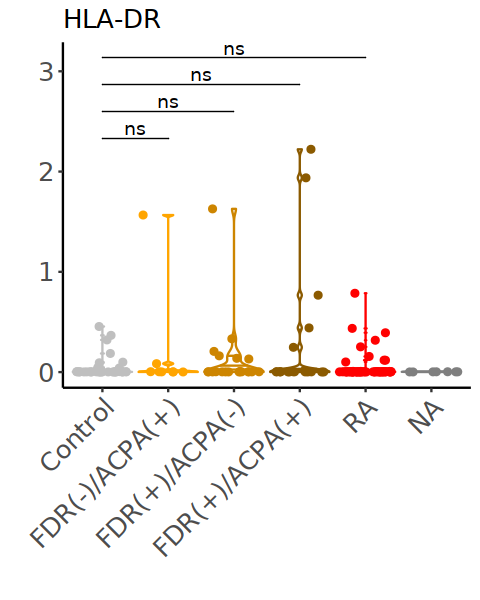

[1] "Ki67"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk             med
  <fct>            <dbl>
1 Control        0.00467
2 FDR(-)/ACPA(-) 0.00644
3 FDR(+)/ACPA(-) 0.00561
4 FDR(-)/ACPA(+) 0.00583
5 FDR(+)/ACPA(+) 0.00559
6 RA             0.00586


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


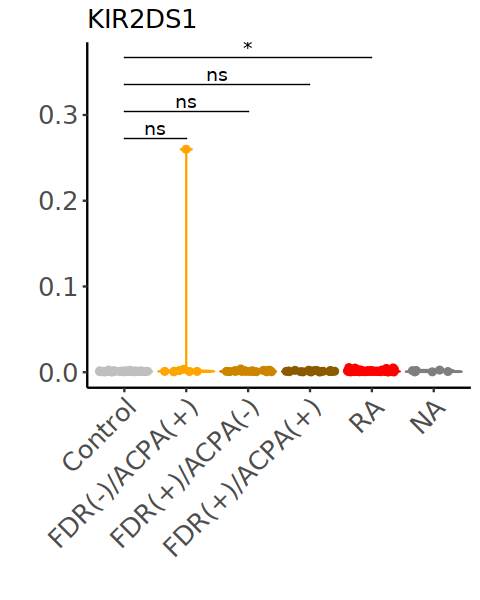

[1] "MR-1-tet"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk              med
  <fct>             <dbl>
1 Control        0.000431
2 FDR(-)/ACPA(-) 0.000434
3 FDR(+)/ACPA(-) 0.000461
4 FDR(-)/ACPA(+) 0.000435
5 FDR(+)/ACPA(+) 0.000483
6 RA             0.000424


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


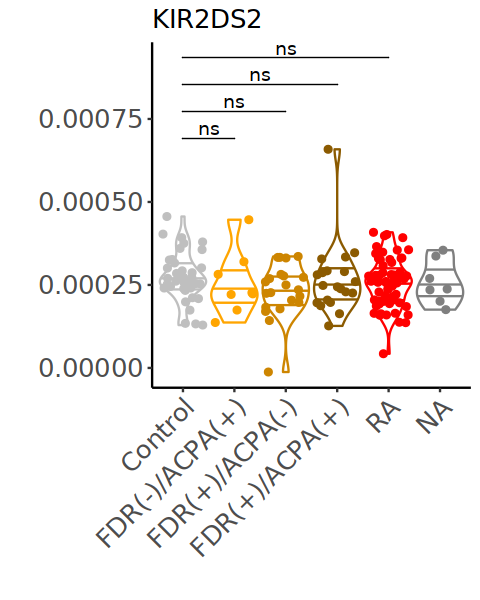

[1] "NKG2C"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk             med
  <fct>            <dbl>
1 Control        0.00161
2 FDR(-)/ACPA(-) 0.00134
3 FDR(+)/ACPA(-) 0.00145
4 FDR(-)/ACPA(+) 0.00129
5 FDR(+)/ACPA(+) 0.00125
6 RA             0.00144


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


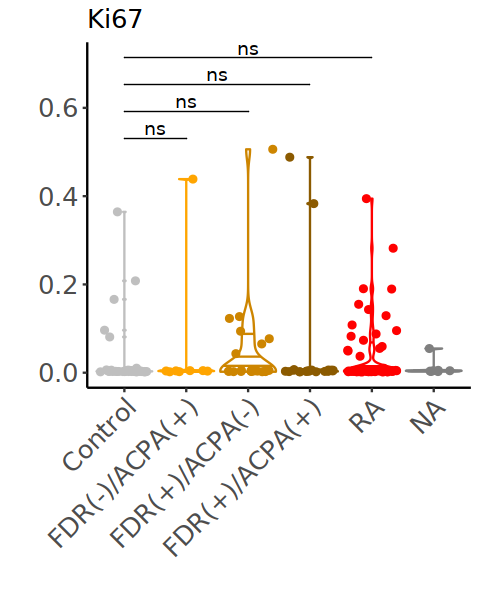

[1] "NKG2D"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk           med
  <fct>          <dbl>
1 Control        1.03 
2 FDR(-)/ACPA(-) 1.10 
3 FDR(+)/ACPA(-) 1.11 
4 FDR(-)/ACPA(+) 1.02 
5 FDR(+)/ACPA(+) 0.990
6 RA             1.08 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


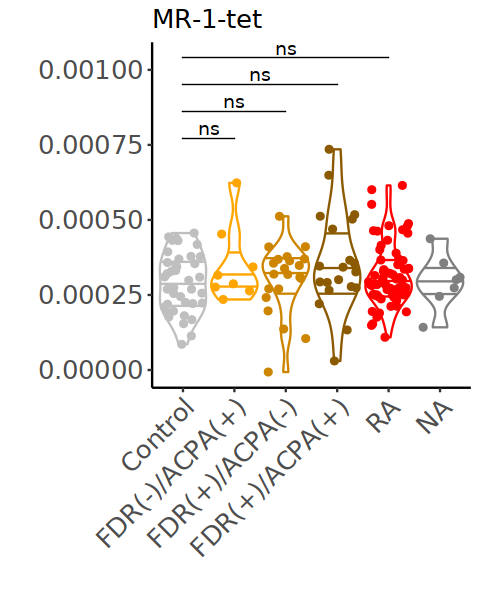

[1] "NKp30"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk           med
  <fct>          <dbl>
1 Control         1.08
2 FDR(-)/ACPA(-)  1.12
3 FDR(+)/ACPA(-)  1.19
4 FDR(-)/ACPA(+)  1.14
5 FDR(+)/ACPA(+)  1.14
6 RA              1.15


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


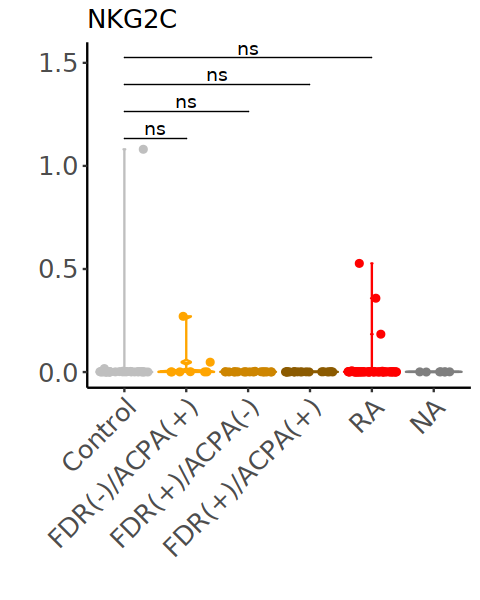

[1] "NKp46"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk           med
  <fct>          <dbl>
1 Control         1.16
2 FDR(-)/ACPA(-)  1.25
3 FDR(+)/ACPA(-)  1.19
4 FDR(-)/ACPA(+)  1.10
5 FDR(+)/ACPA(+)  1.02
6 RA              1.19


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


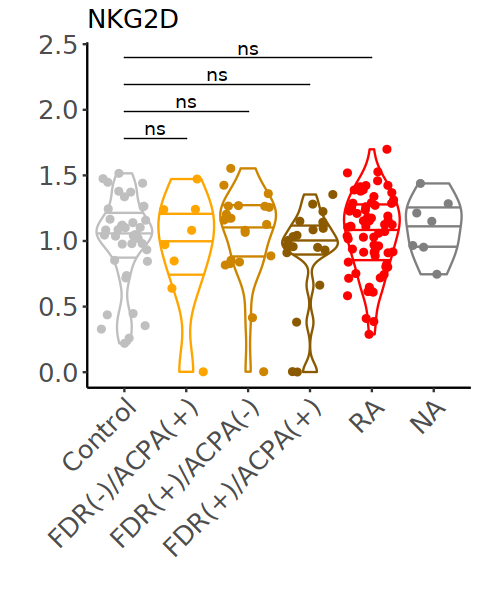

[1] "NKp80"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk           med
  <fct>          <dbl>
1 Control         1.23
2 FDR(-)/ACPA(-)  1.26
3 FDR(+)/ACPA(-)  1.23
4 FDR(-)/ACPA(+)  1.25
5 FDR(+)/ACPA(+)  1.27
6 RA              1.25


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


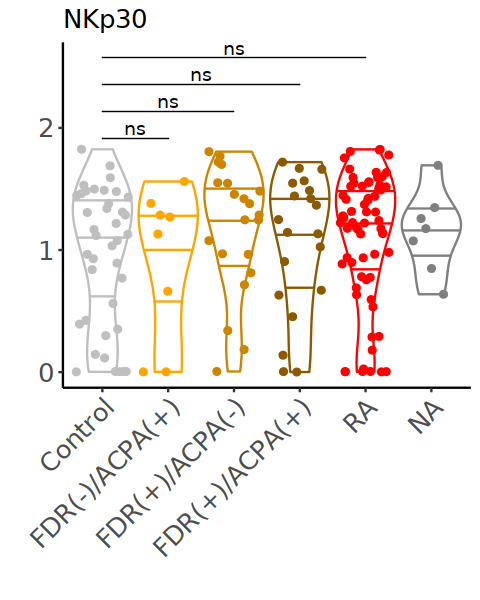

[1] "PLZF"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk           med
  <fct>          <dbl>
1 Control        0.503
2 FDR(-)/ACPA(-) 1.25 
3 FDR(+)/ACPA(-) 0.794
4 FDR(-)/ACPA(+) 0.981
5 FDR(+)/ACPA(+) 0.739
6 RA             0.766


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


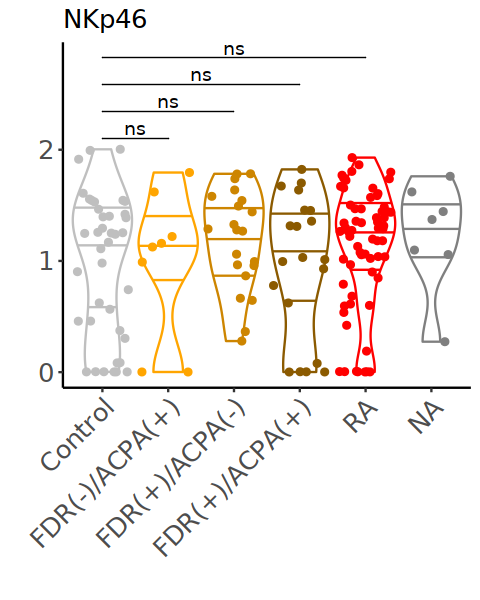

[1] "PSGL-1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk             med
  <fct>            <dbl>
1 Control        0.00493
2 FDR(-)/ACPA(-) 0.00412
3 FDR(+)/ACPA(-) 0.00586
4 FDR(-)/ACPA(+) 0.00418
5 FDR(+)/ACPA(+) 0.00469
6 RA             0.00450


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


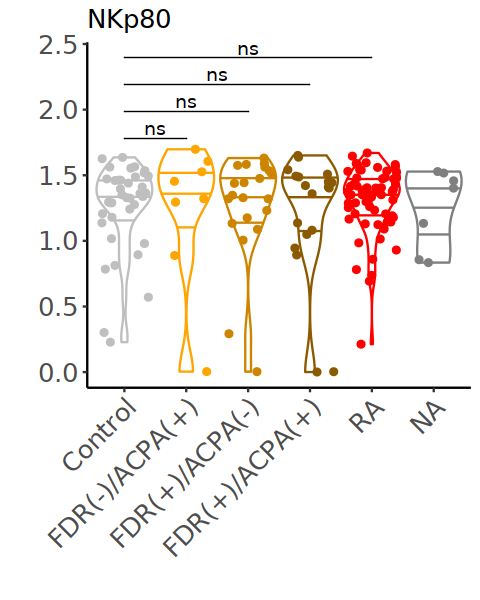

[1] "Perforin"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk           med
  <fct>          <dbl>
1 Control         1.84
2 FDR(-)/ACPA(-)  1.84
3 FDR(+)/ACPA(-)  1.84
4 FDR(-)/ACPA(+)  1.84
5 FDR(+)/ACPA(+)  1.85
6 RA              1.85


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


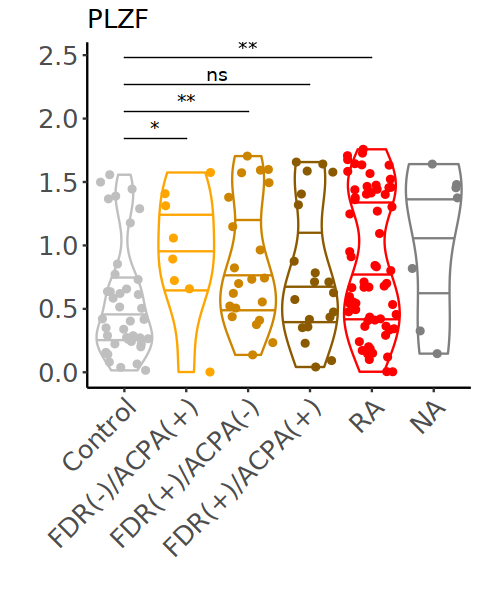

[1] "SH2D1A"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk           med
  <fct>          <dbl>
1 Control         1.46
2 FDR(-)/ACPA(-)  1.51
3 FDR(+)/ACPA(-)  1.50
4 FDR(-)/ACPA(+)  1.50
5 FDR(+)/ACPA(+)  1.46
6 RA              1.49


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


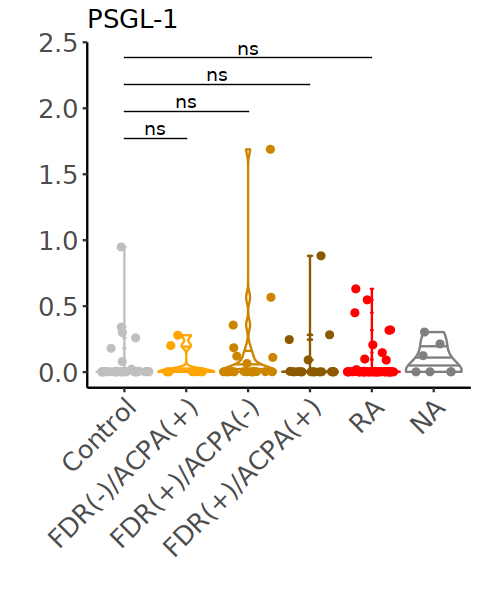

[1] "SLAMF6"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk           med
  <fct>          <dbl>
1 Control         1.11
2 FDR(-)/ACPA(-)  1.09
3 FDR(+)/ACPA(-)  1.14
4 FDR(-)/ACPA(+)  1.10
5 FDR(+)/ACPA(+)  1.10
6 RA              1.15


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


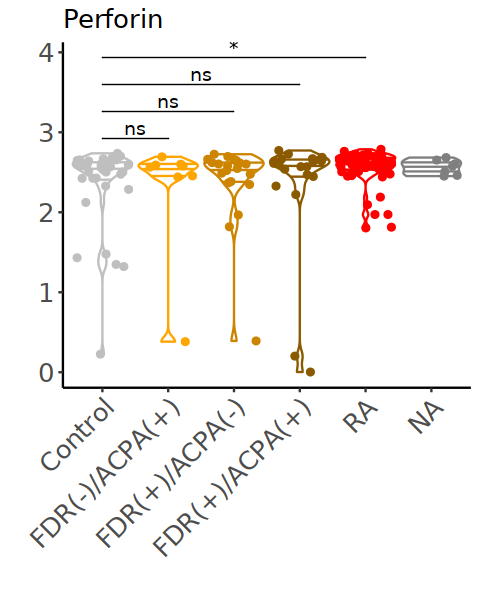

[1] "TCRVd1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk              med
  <fct>             <dbl>
1 Control        0.000365
2 FDR(-)/ACPA(-) 0.000371
3 FDR(+)/ACPA(-) 0.000370
4 FDR(-)/ACPA(+) 0.000401
5 FDR(+)/ACPA(+) 0.000374
6 RA             0.000366


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


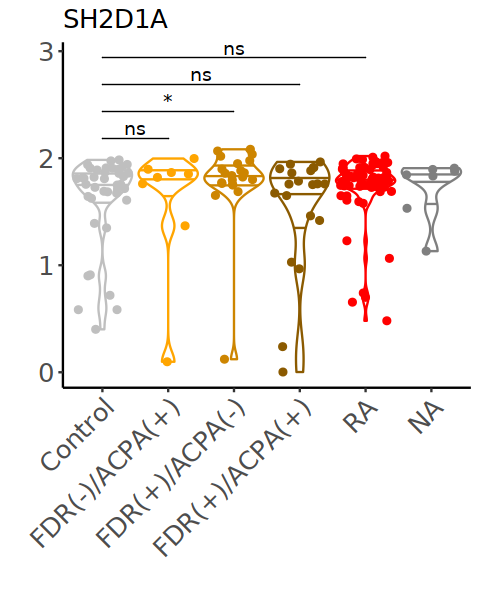

[1] "TCRVd2"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk              med
  <fct>             <dbl>
1 Control        0.000531
2 FDR(-)/ACPA(-) 0.000600
3 FDR(+)/ACPA(-) 0.000574
4 FDR(-)/ACPA(+) 0.000576
5 FDR(+)/ACPA(+) 0.000500
6 RA             0.000583


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


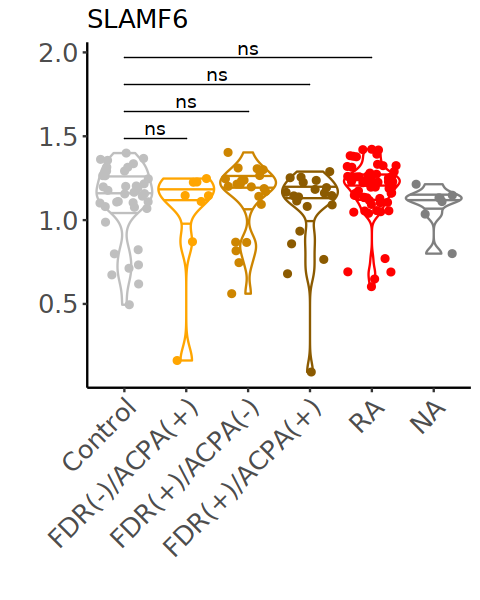

[1] "TCRab"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk             med
  <fct>            <dbl>
1 Control        0.00278
2 FDR(-)/ACPA(-) 0.00367
3 FDR(+)/ACPA(-) 0.00325
4 FDR(-)/ACPA(+) 0.00352
5 FDR(+)/ACPA(+) 0.00438
6 RA             0.00288


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


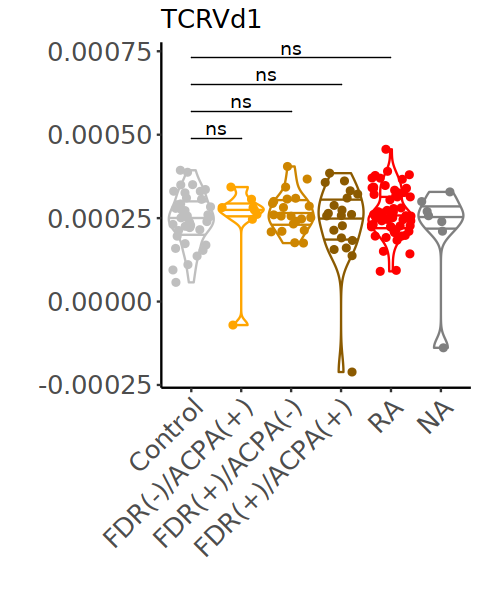

[1] "TCRgd"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk             med
  <fct>            <dbl>
1 Control        0.00160
2 FDR(-)/ACPA(-) 0.00154
3 FDR(+)/ACPA(-) 0.00166
4 FDR(-)/ACPA(+) 0.00157
5 FDR(+)/ACPA(+) 0.00143
6 RA             0.00151


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


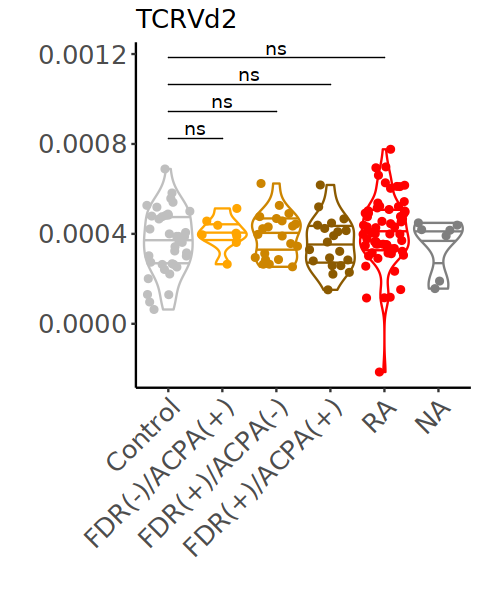

[1] "Tbet"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk           med
  <fct>          <dbl>
1 Control         1.62
2 FDR(-)/ACPA(-)  1.66
3 FDR(+)/ACPA(-)  1.65
4 FDR(-)/ACPA(+)  1.66
5 FDR(+)/ACPA(+)  1.66
6 RA              1.67


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


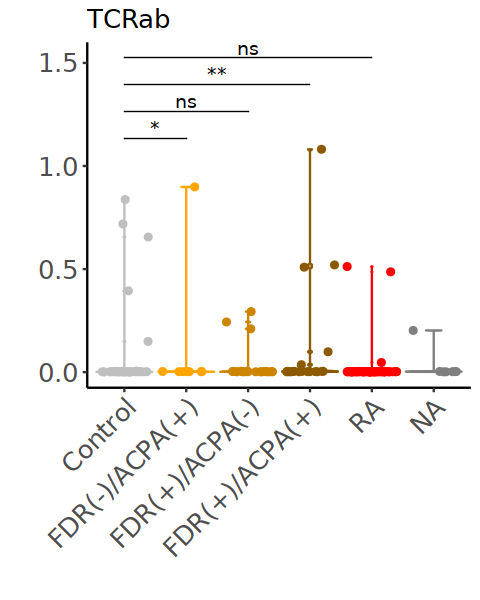

[1] "iNKT"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 6 × 2
  AtRisk              med
  <fct>             <dbl>
1 Control        0.000704
2 FDR(-)/ACPA(-) 0.000733
3 FDR(+)/ACPA(-) 0.000673
4 FDR(-)/ACPA(+) 0.000761
5 FDR(+)/ACPA(+) 0.000624
6 RA             0.000800


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


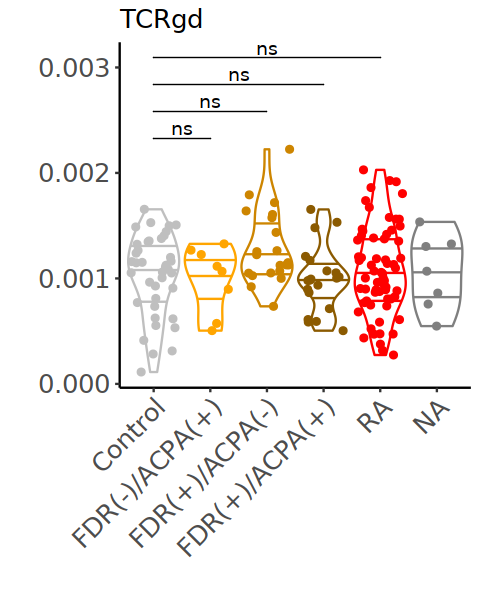

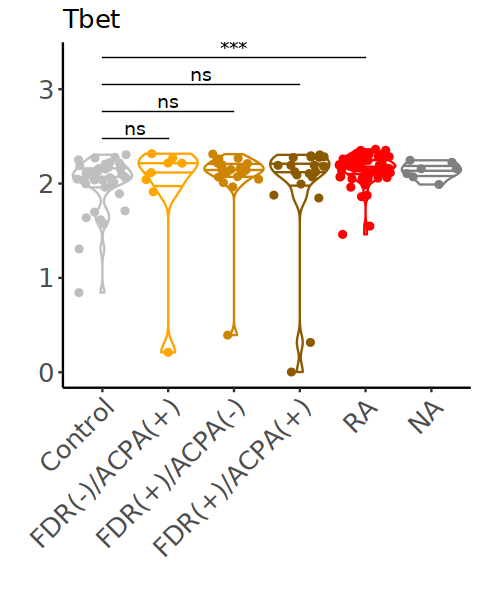

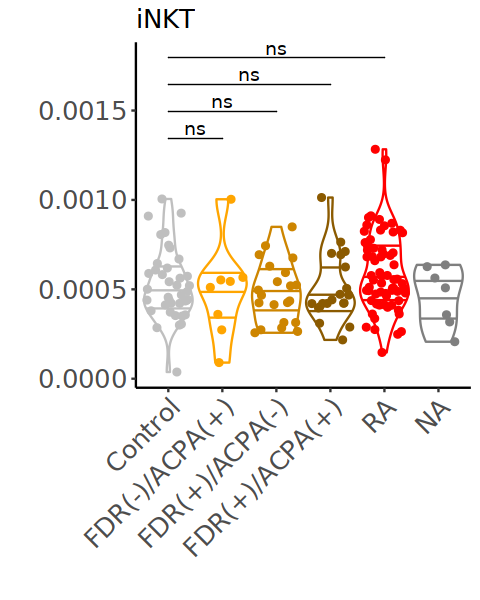

In [29]:
options(repr.plot.height = 5, repr.plot.width = 4)
for (gene in markers){
  print(gene)
  
  data.frame(ph_markers_data_arcsinh, subject_id = umap_res$subject_id, AtRisk = umap_res$AtRisk) %>% 
    dplyr::mutate(expr = ph_markers_data_arcsinh[,grepl(paste0("^",gene,"$"),colnames(ph_markers_data_arcsinh))]) %>%
    dplyr::group_by(subject_id, AtRisk) %>%
    dplyr::summarize(med = quantile(log2(expr+1), probs = c(0.5))) %>%
    dplyr::group_by(AtRisk) %>%
    dplyr::summarize(med = quantile(log2(med+1), probs = c(0.5))) %>% print()
  plot(
    data.frame(ph_markers_data_arcsinh, subject_id = umap_res$subject_id, AtRisk = umap_res$AtRisk) %>% 
      dplyr::mutate(expr = ph_markers_data_arcsinh[,grepl(paste0("^",gene,"$"),colnames(ph_markers_data_arcsinh))]) %>%
      dplyr::group_by(subject_id, AtRisk) %>%
      dplyr::summarize(med = quantile(log2(expr+1), probs = c(0.5))) %>%
      as.data.frame() %>%
      dplyr::mutate(AtRisk = factor(AtRisk,levels = c("Control","FDR(-)/ACPA(+)","FDR(+)/ACPA(-)","FDR(+)/ACPA(+)","RA"))) %>%
      ggplot(., aes(x = AtRisk, y=med, fill = AtRisk, color = AtRisk)) + 
      geom_violin(aes(color = AtRisk), fill = "white", scale = "width", draw_quantiles = c(0.25, 0.5, 0.75)) +
      geom_jitter(aes(fill = AtRisk, color = AtRisk)) +
      ggpubr::stat_compare_means(
        comparisons = list(c("Control", "FDR(-)/ACPA(+)"), c("Control", "FDR(+)/ACPA(-)"), c("Control", "FDR(+)/ACPA(+)"), c("Control", "RA")),
        label = "p.signif",
        tip.length = 0
      ) +
      scale_fill_manual(values=c("Control" = "grey75","FDR(-)/ACPA(+)" = "orange","FDR(+)/ACPA(-)" = "orange3","FDR(+)/ACPA(+)" = "orange4","RA" = "red")) +
      scale_color_manual(values=c("Control" = "grey75","FDR(-)/ACPA(+)" = "orange","FDR(+)/ACPA(-)" = "orange3","FDR(+)/ACPA(+)" = "orange4","RA" = "red")) + 
      theme_classic() +
      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
            strip.text.y=element_text(size=15, color="black", face="bold"),
            legend.position = "none",
            plot.title = element_text(size=15),
            axis.title.x = element_text(size=15),
            axis.title.y = element_text(size =15),
            axis.text.y = element_text(size = 15),
            axis.text.x = element_text(size = 15, angle = 45, hjust=1),
            legend.text =  element_text(size = 15),
            legend.key.size = grid::unit(0.5, "lines"),
            legend.title = element_text(size = 0.8, hjust = 0)) +
      labs(title = gene,
           x = "",
           y = "") 
  )
  
}



In [27]:
# CNA; covarying neighborhood analysis

In [30]:
obj = readRDS(paste0("/pl/active/fanzhanglab/jinamo/cytof/data/NK_cells/SeuratObj_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
obj@meta.data$subject_id <- stringr::str_split(obj@meta.data$OmiqFileIndex, pattern="_", simplify=TRUE)[,2] %>% 
                                    stringr::str_split(., pattern="\\-V", simplify=TRUE) %>%
                                    as.data.frame() %>%
                                    .[,1] %>%
                                    gsub("-","_",.)

umap_res <- readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/NK_cells/umap_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
# remove clusters less than cut off
min_cell_cluster = 30
clu = umap_res %>%
    dplyr::group_by(res_cell) %>%
    dplyr::summarize(count = dplyr::n()) %>%
    dplyr::arrange(count) %>%
    dplyr::filter(count > min_cell_cluster) %>%
    .$res_cell %>%
    unique()
clu_logi = umap_res$res_cell %in% clu
umap_res = umap_res[clu_logi,]

# Find cluster center
cluster_center <- umap_res %>%
  dplyr::group_by(res_cell) %>%
  dplyr::summarise_at(vars(UMAP1, UMAP2), dplyr::funs(median(., na.rm=TRUE)))
cluster_center <- as.data.frame(cluster_center)
cluster_center$res_cell <- as.character(cluster_center$res_cell)

Loading required package: SeuratObject

Attaching sp



In [32]:
# meta data

batch_fl = readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/NK_cells/meta_Prop",prop,"_Nmin",n_min,".rds"))
batch_fl$subject_id <- stringr::str_split(batch_fl$OmiqFileIndex, pattern="_", simplify=TRUE)[,2] %>% 
  stringr::str_split(., pattern="\\-V", simplify=TRUE) %>%
  as.data.frame() %>%
  .[,1] %>%
  gsub("-","_",.)
batch_fl = batch_fl[clu_logi,]
umap_res$subject_id = batch_fl$subject_id
umap_res$time_point = batch_fl$time_point
all(umap_res$subject_id == obj@meta.data$subject_id)

meta<- read.table("/projects/jinamo@xsede.org/cytof/data/RA_AtRiskRA_Control_meta.txt",sep="\t",header=TRUE, na.strings=c("","NA")) %>%
    dplyr::mutate(age_at_biopsy = as.integer(age_at_biopsy),
                  diagnosis = factor(diagnosis, levels=c("Control","AtRiskRA","RA")))
meta = merge(meta,obj@meta.data,by="subject_id")
meta = meta[order(match(meta$subject_id, obj@meta.data$subject_id)),]
print(head(meta))
print(dim(meta))
table(meta$sex)
table(meta$ethnicity)
table(meta$sex)
table(meta$AMP_Group)
table(meta$CCP)
table(meta$RF)
all(meta$subject_id == obj@meta.data$subject_id)

meta_add = read.table("/projects/jinamo@xsede.org/cytof/data/meta_clinical_RA.txt", header = TRUE, sep = "\t") %>%
  dplyr::mutate(CDAI = as.numeric(CDAI),
                subject_id = gsub("-","_",subject_id),
                treatment = dplyr::case_when(
                  treatment == "1" ~ "naive",
                  treatment == "2" ~ "MTX failure",
                  treatment == "3" ~ "TNF failure",
                  treatment == "4" ~ "OA"
                )) %>%
  dplyr::select(-c(sex))
meta_add = dplyr::left_join(obj@meta.data[,!grepl("CDAI",colnames(obj@meta.data))],meta_add,by="subject_id")

meta_add2 = read.table("/projects/jinamo@xsede.org/cytof/data/clinical_data_for_FAN_from_Kat.txt", header = TRUE, sep = "\t") %>%
  dplyr::select(-c(sex))
meta_add2 = dplyr::left_join(obj@meta.data[,!grepl("CDAI",colnames(obj@meta.data))],meta_add2,by="subject_id")

meta_add3 = read.table("/projects/jinamo@xsede.org/cytof/data/RA_Cleaned_aggregate_vars.txt", header = TRUE, sep = "\t") %>%
  dplyr::select(c(subject_id,HAQ,das28_crp3,bmi,ra_group,pathotype_str,sdai,ccp_type,ccp_range,rf_range,mdtjc28_sum,mdsjc28_sum,diabetes,Race_white,Race_black,Race_multiple,Race_other,MTX,SSZ,HCQ,LEF,TNFi))
meta_add3 = dplyr::left_join(obj@meta.data,meta_add3,by="subject_id")


[1] TRUE

Warning message in mask$eval_all_mutate(quo):
“NAs introduced by coercion”


  subject_id age_at_biopsy    sex    ethnicity diagnosis collection_method ctap
1   200_0272            28 female not_hispanic   Control              <NA> <NA>
2   200_0272            28 female not_hispanic   Control              <NA> <NA>
3   200_0272            28 female not_hispanic   Control              <NA> <NA>
4   200_0272            28 female not_hispanic   Control              <NA> <NA>
5   200_0272            28 female not_hispanic   Control              <NA> <NA>
6   200_0272            28 female not_hispanic   Control              <NA> <NA>
  AMP_Group  CCP   RF CCP30_titer CCP31_titer RF_IgM_titer RF_IgG_titer
1      <NA> <NA> <NA>          NA          NA           NA           NA
2      <NA> <NA> <NA>          NA          NA           NA           NA
3      <NA> <NA> <NA>          NA          NA           NA           NA
4      <NA> <NA> <NA>          NA          NA           NA           NA
5      <NA> <NA> <NA>          NA          NA           NA           NA
6      <


 female    male 
1393621  615081 


hispanic_latino    not_hispanic 
         405641         1580604 


 female    male 
1393621  615081 


   FDR     GP 
438266 124568 


Negative Positive 
  255732   307102 


Negative Positive 
  478182    84652 

[1] TRUE

In [33]:
# merge meta data to Seurat object
obj@meta.data$AtRisk = dplyr::case_when(
  meta$AMP_Group == "FDR" & meta$CCP == "Positive" ~ "FDR(+)/ACPA(+)",
  meta$AMP_Group == "GP" & meta$CCP == "Positive" ~ "FDR(-)/ACPA(+)",
  meta$AMP_Group == "FDR" & meta$CCP == "Negative" ~ "FDR(+)/ACPA(-)",
  meta$AMP_Group == "GP" & meta$CCP == "Negative" ~ "FDR(-)/ACPA(-)",
  obj@meta.data$disease == "Control" ~ "Control",
  obj@meta.data$disease == "RA" ~ "RA")
obj@meta.data$age_at_biopsy <- as.numeric(meta$age_at_biopsy)
obj@meta.data$sex <- as.numeric(factor(meta$sex, c('female', 'male')))
obj@meta.data$ethnicity <- as.numeric(factor(meta$ethnicity, c('not_hispanic', 'hispanic_latino')))
obj@meta.data$AMP_Group <- as.numeric(factor(meta$AMP_Group, c('GP', 'FDR')))
obj@meta.data$CCP <- as.numeric(factor(meta$CCP, c('Negative', 'Positive')))
obj@meta.data$CCP30_titer <- as.numeric(meta$CCP30_titer)
obj@meta.data$CCP31_titer <- as.numeric(meta$CCP31_titer)
obj@meta.data$RF <- as.numeric(factor(meta$RF, c('Negative', 'Positive')))
obj@meta.data$RF_IgM_titer <- as.numeric(meta$RF_IgM_titer)
obj@meta.data$RF_IgG_titer <- as.numeric(meta$RF_IgG_titer)
obj@meta.data$RF_IgA_titer <- as.numeric(meta$RF_IgA_titer)
obj@meta.data$batch <- as.numeric(factor(meta$batch))
obj@meta.data$AtRisk = factor(obj@meta.data$AtRisk,levels=c("Control","FDR(+)/ACPA(+)","FDR(-)/ACPA(+)","FDR(+)/ACPA(-)","FDR(-)/ACPA(-)","RA"))
obj@meta.data$alt_AtRisk = dplyr::case_when(
  obj@meta.data$AtRisk == "FDR(-)/ACPA(-)" ~ "FDR(-)/ACPA(-)",
  obj@meta.data$AtRisk == "FDR(+)/ACPA(-)" | obj@meta.data$AtRisk == "FDR(-)/ACPA(+)" | obj@meta.data$AtRisk == "FDR(+)/ACPA(+)" ~ "AtRiskRA",
  TRUE ~ "others")
obj@meta.data$ctap <- dplyr::case_when(
  meta$diagnosis == "AtRiskRA" ~ "AtRiskRA",
  meta$diagnosis == "Control" ~ "Control")
obj@meta.data$ctap <- ifelse(is.na(obj@meta.data$ctap),meta$ctap,obj@meta.data$ctap)
obj@meta.data$CDAI <- as.numeric(meta_add$CDAI)
obj@meta.data$krenn_lining <- as.numeric(meta_add$krenn_lining)
obj@meta.data$krenn_inflammation <- as.numeric(meta_add$krenn_inflammation)
obj@meta.data$treatment <- dplyr::case_when(
  meta$diagnosis == "AtRiskRA" ~ "AtRiskRA",
  meta$diagnosis == "Control" ~ "Control")
obj@meta.data$treatment <- ifelse(is.na(obj@meta.data$treatment),meta_add$treatment,obj@meta.data$treatment)
obj@meta.data$disease = dplyr::case_when(
  obj@meta.data$AtRisk == "FDR(+)/ACPA(+)" | obj@meta.data$AtRisk == "FDR(-)/ACPA(+)" | obj@meta.data$AtRisk == "FDR(+)/ACPA(-)" ~ "AtRiskRA",
  obj@meta.data$AtRisk == "Control" | obj@meta.data$AtRisk == "FDR(-)/ACPA(-)" ~ "Control",
  obj@meta.data$AtRisk == "RA" ~ "RA")
obj@meta.data$condition = obj@meta.data$disease
obj@meta.data$condition = factor(obj@meta.data$condition, levels = c('Control', 'AtRiskRA', "RA"))

obj@meta.data$CRP <- as.numeric(meta_add2$crp_result)
obj@meta.data$ESR <- as.numeric(meta_add2$esr_result)
obj@meta.data$RA_duration_years <- as.numeric(meta_add2$RA_duration_years)
obj@meta.data$CDAI <- ifelse(is.na(obj@meta.data$CDAI), as.numeric(meta_add2$cdai), obj@meta.data$CDAI)
obj@meta.data$SDAI <- as.numeric(meta_add3$sdai)
obj@meta.data$DAS28_ESR <- as.numeric(meta_add2$das28_esr3)
obj@meta.data$DAS28_CRP <- as.numeric(meta_add3$das28_crp3)
obj@meta.data$CCP31_titer <- ifelse(obj@meta.data$condition == "RA", as.numeric(meta_add2$ccp_result), obj@meta.data$CCP31_titer)
obj@meta.data$CCP31_cutoff <- as.numeric(meta_add3$ccp_range)
obj@meta.data$RF_IgM_titer <- ifelse(obj@meta.data$condition == "RA", as.numeric(meta_add2$rf_result), obj@meta.data$RF_IgM_titer)
obj@meta.data$RF_IgM_cutoff <- as.numeric(meta_add3$rf_range)
obj@meta.data$smoke_hx <- as.factor(meta_add2$smoke_hx)
obj@meta.data$smoke_current <- as.factor(meta_add2$smoke_current)
obj@meta.data$Methotrexate_only <- meta_add2$Methotrexate_only
obj@meta.data$TNFi_possible_nbDMARD <- meta_add2$TNFi_possible_nbDMARD
obj@meta.data$other_bDMARD <- meta_add2$other_bDMARD
obj@meta.data$other_nbDMARD_no_bDMARD <- meta_add2$other_nbDMARD_no_bDMARD
obj@meta.data$no_DMARD <- meta_add2$no_DMARD
obj@meta.data$bDMARD <- meta_add2$bDMARD
obj@meta.data$nbDMARD <- meta_add2$nbDMARD
obj@meta.data$Prednisone <- meta_add2$Prednisone
obj@meta.data$Prednisone_GE_7.5 <- ifelse(obj@meta.data$Prednisone, meta_add2$Prednisone_GE_7.5, FALSE)

obj@meta.data$time_point <- batch_fl$time_point

In [34]:
# Control vs AtRiskRA 

logi = obj$condition %in% c("Control","AtRiskRA")
obj_sub = readRDS(paste0("/pl/active/fanzhanglab/jinamo/cytof/data/NK_cells/SeuratObj_Control_AtRiskRA_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))


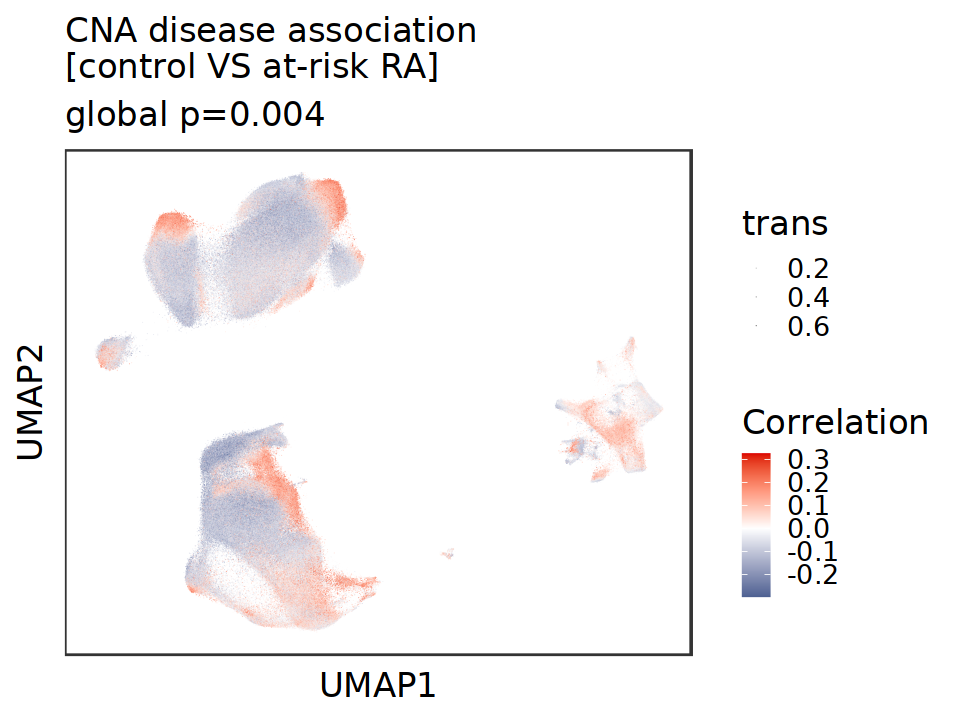

In [35]:
# positive correlation means association with at-risk RA
options(repr.plot.height = 6, repr.plot.width = 8)
cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs)) %>%
    dplyr::mutate(trans = abs(cna_ncorrs)*2) %>%
    ggplot(aes(x = UMAP1, y = UMAP2)) +
       geom_point(
         aes(color = cna_ncorrs, alpha = trans),
           size = 0.001, stroke = 0, shape = 16
       ) +
       scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab" ) +
       labs(
         x = "UMAP1",
         y = "UMAP2",
         title = 'CNA disease association\n[control VS at-risk RA]', 
         color = 'Correlation',
         subtitle = sprintf('global p=%0.3f', obj_sub@reductions$cna@misc$p)
       ) +
       theme_bw(base_size = 20) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=20)
       )


Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”


,cluster,size,model.pvalue,conditionAtRiskRA.OR,conditionAtRiskRA.OR.95pct.ci.lower,conditionAtRiskRA.OR.95pct.ci.upper
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
cluster0,cluster0,299306,0.44128158,0.8897308,0.757932730,1.044447e+00
cluster1,cluster1,165460,0.55050891,0.9426314,0.869861459,1.021489e+00
cluster10,cluster10,9043,0.43881324,1.2994183,0.670927234,2.516648e+00
cluster11,cluster11,6354,0.81568653,1.0478821,0.861468308,1.274634e+00
cluster12,cluster12,3953,0.99345665,0.9972681,0.745123460,1.334737e+00
cluster13,cluster13,3383,0.67612568,2.3479051,0.000465563,1.184084e+04
cluster14,cluster14,5878,0.56415482,1.1777353,0.847894344,1.635888e+00
cluster15,cluster15,3527,0.84355118,1.0661751,0.759377669,1.496922e+00
cluster16,cluster16,2703,0.18099569,0.8158265,0.591350877,1.125513e+00


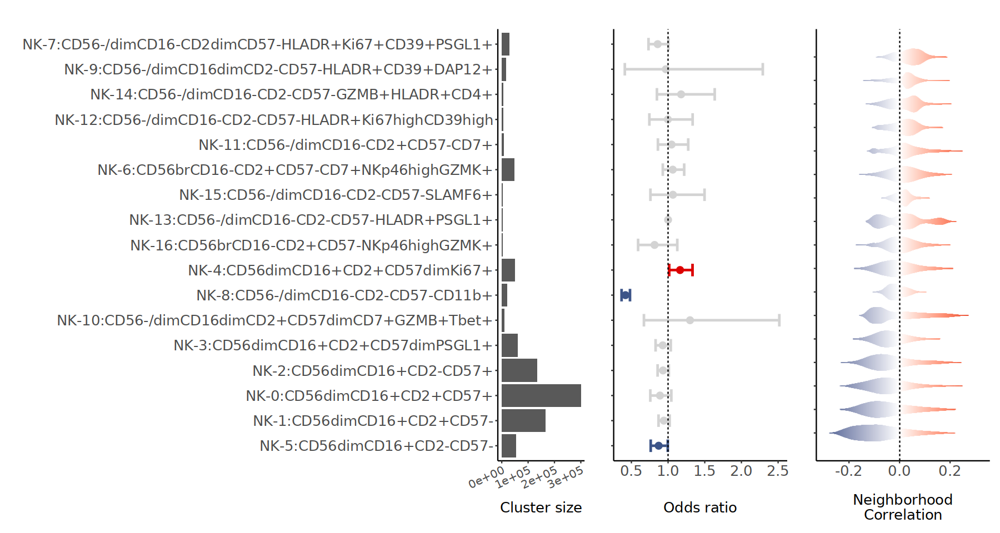

In [36]:
cor_pos = obj_sub@meta.data$cna_ncorrs_fdr05
cor_pos = cor_pos[cor_pos > 0]
# summary(cor_pos)
cor_neg = obj_sub@meta.data$cna_ncorrs_fdr05
cor_neg = cor_neg[cor_neg < 0]
# summary(cor_neg)

ord = cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs,res_cell)) %>%
    dplyr::group_by(res_cell) %>%
    dplyr::summarize(med = median(cna_ncorrs)) %>%
    dplyr::arrange(med) %>%
    .$res_cell

p <- cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs,res_cell)) %>%
    dplyr::mutate(res_cell = factor(res_cell,levels=ord)) %>%
    ggplot(aes(x=res_cell, y=cna_ncorrs)) + 
    geom_violin(trim=TRUE, scale = "width")

mywidth <- .35 # bit of trial and error
# This is all you need for the fill: 
vl_fill <- data.frame(ggplot_build(p)$data) %>%
  mutate(xnew = x- mywidth*violinwidth, xend = x+ mywidth*violinwidth) 

# Bit convoluted for the outline, need to be rearranged: the order matters
vl_poly <- 
  vl_fill %>% 
  select(xnew, xend, y, group) %>%
  pivot_longer(-c(y, group), names_to = "oldx", values_to = "x") %>% 
  arrange(y) %>%
  split(., .$oldx) %>%
  map(., function(x) {
    if(all(x$oldx == "xnew")) x <- arrange(x, desc(y))
    x
    }) %>%
  bind_rows()


if (length(cor_pos)!=0 & length(cor_neg)!=0) {
      g1 = ggplot() +
        geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
        geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
        scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
        scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
        # geom_hline(yintercept=c(min(cor_pos), max(cor_neg)), linetype='dashed', color='black') +
        geom_hline(yintercept=0, linetype='dashed', color='black') +
        theme_classic() +
        coord_flip() +   
        theme(strip.text.x=element_text(size=15, color="black", face="bold"),
              strip.text.y=element_text(size=15, color="black", face="bold"),
              legend.position = "none",
              plot.title = element_text(size=15),
              axis.title.x = element_text(size=15),
              axis.title.y = element_text(size =15),
              axis.text.y = element_blank(),
              axis.text.x = element_text(size =15),
              legend.text =  element_text(size = 15),
              legend.key.size = grid::unit(0.5, "lines"),
              legend.title = element_text(size = 0.8, hjust = 0)) +
        labs(title = "",
             x = "",
             y = "Neighborhood\nCorrelation") 
  } else if (length(cor_pos)!=0 & length(cor_neg)==0) {
      g1 = ggplot() +
        geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
        geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
        scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
        scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
        # geom_hline(yintercept=c(min(cor_pos)), linetype='dashed', color='black') +
        geom_hline(yintercept=0, linetype='dashed', color='black') +
        theme_classic() +
        coord_flip() +
        theme(strip.text.x=element_text(size=15, color="black", face="bold"),
              strip.text.y=element_text(size=15, color="black", face="bold"),
              legend.position = "none",
              plot.title = element_text(size=15),
              axis.title.x = element_text(size=15),
              axis.title.y = element_text(size =15),
              axis.text.y = element_blank(),
              axis.text.x = element_text(size =15),
              legend.text =  element_text(size = 15),
              legend.key.size = grid::unit(0.5, "lines"),
              legend.title = element_text(size = 0.8, hjust = 0)) +
        labs(title = "",
             x = "",
             y = "Neighborhood\nCorrelation") 
  } else if (length(cor_pos)==0 & length(cor_neg)!=0) {
      g1 = ggplot() +
        geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
        geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
        scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
        scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
        # geom_hline(yintercept=c(min(cor_neg)), linetype='dashed', color='black') +
        geom_hline(yintercept=0, linetype='dashed', color='black') +
        theme_classic() +
        coord_flip() +
        theme(strip.text.x=element_text(size=15, color="black", face="bold"),
              strip.text.y=element_text(size=15, color="black", face="bold"),
              legend.position = "none",
              plot.title = element_text(size=15),
              axis.title.x = element_text(size=15),
              axis.title.y = element_text(size =15),
              axis.text.y = element_blank(),
              axis.text.x = element_text(size =15),
              legend.text =  element_text(size = 15),
              legend.key.size = grid::unit(0.5, "lines"),
              legend.title = element_text(size = 0.8, hjust = 0)) +
        labs(title = "",
             x = "",
             y = "Neighborhood\nCorrelation") 
  } else if (length(cor_pos)==0 & length(cor_neg)==0) {
      g1 = ggplot() +
        geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
        geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
        scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
        scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
        geom_hline(yintercept=0, linetype='dashed', color='black') +
        theme_classic() +
        coord_flip() +
        theme(strip.text.x=element_text(size=15, color="black", face="bold"),
              strip.text.y=element_text(size=15, color="black", face="bold"),
              legend.position = "none",
              plot.title = element_text(size=15),
              axis.title.x = element_text(size=15),
              axis.title.y = element_text(size =15),
              axis.text.y = element_blank(),
              axis.text.x = element_text(size =15),
              legend.text =  element_text(size = 15),
              legend.key.size = grid::unit(0.5, "lines"),
              legend.title = element_text(size = 0.8, hjust = 0)) +
        labs(title = "",
             x = "",
             y = "Neighborhood\nCorrelation") 
  }

# MASC: Mixed-effects association testing for single cells
## Sci Transl Med. 2018 Oct 17;10(463):eaaq0305.

masc = readRDS(file = paste0("/projects/jinamo@xsede.org/cytof/data/NK_cells/MASC_Control_AtRiskRA_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
# masc = readRDS(file = paste0("/scratch/alpine/jinamo@xsede.org/NK_cells/MASC_Control_AtRiskRA_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
masc
g2 = masc %>%
  magrittr::set_colnames(c("cluster","size","model.pvalue","OR","CIlower","CIupper")) %>%
    dplyr::mutate(col = dplyr::case_when(
      CIupper < 1 ~ '#3C5488FF',
      CIlower > 1 ~ '#DC0000FF',
      TRUE ~ "lightgray"),
                 CIupper = ifelse(CIupper>100 & model.pvalue>0.05, 1, CIupper),
                 CIlower = ifelse(CIlower<0.01 & model.pvalue>0.05, 1, CIlower),
                 OR = ifelse(CIupper==1|CIlower==1,1,OR)) %>%
  dplyr::mutate(cluster = gsub("cluster","",cluster),
                cluster = factor(cluster,levels=ord)) %>%
  ggplot(., aes(y=cluster, x=OR, colour=col)) + 
  geom_point(position=position_dodge(width=0.3), size=3) +
  geom_errorbarh(aes(xmin=CIlower, xmax=CIupper), position = position_dodge(0.3), height=0.5, linewidth = 1) +
  scale_color_manual(values = c('#3C5488FF' = '#3C5488FF', '#DC0000FF' = '#DC0000FF', "lightgray" = "lightgray")) + 
  scale_y_discrete(labels=cluster_df %>%
    magrittr::set_rownames(cluster_df$cluster) %>%
    .[ord,] %>% .$clu_name) +
  geom_vline(xintercept=1, linetype='dashed', color='black') +
  theme_classic() +
  theme(strip.text.x=element_text(size=15, color="black", face="bold"),
        strip.text.y=element_text(size=15, color="black", face="bold"),
        legend.position = "none",
        plot.title = element_text(size=15),
        axis.title.x = element_text(size=15),
        axis.title.y = element_text(size =15),
        axis.text.y = element_blank(),
        axis.text.x = element_text(size = 15),
        legend.text =  element_text(size = 15),
        legend.key.size = grid::unit(0.5, "lines"),
        legend.title = element_text(size = 0.8, hjust = 0)) +
  labs(title = "",
       y = "",
       x = "Odds ratio")


g3 = masc %>%
  magrittr::set_colnames(c("cluster","size","model.pvalue","OR","CIlower","CIupper")) %>%
  dplyr::mutate(col = dplyr::case_when(
    CIupper < 1 ~ '#3C5488FF',
    CIlower > 1 ~ '#DC0000FF',
    TRUE ~ "lightgray"),
    CIupper = ifelse(CIupper>100 & model.pvalue>0.05, 1, CIupper),
    CIlower = ifelse(CIlower<0.01 & model.pvalue>0.05, 1, CIlower),
    OR = ifelse(CIupper==1|CIlower==1,1,OR)) %>%
  dplyr::mutate(cluster = gsub("cluster","",cluster),
                cluster = factor(cluster,levels=ord)) %>%
  ggplot(., aes(y=cluster, x=size)) + 
  geom_bar(stat = "identity", position=position_dodge()) + 
  scale_y_discrete(labels=paste0("NK-",
                                 cluster_df %>%
                                   magrittr::set_rownames(cluster_df$cluster) %>%
                                   .[ord,] %>% .$cluster,
                                 ":",
                                 cluster_df %>%
                                   magrittr::set_rownames(cluster_df$cluster) %>%
                                   .[ord,] %>% .$clu_name)
  ) +
  theme_classic() +
  theme(strip.text.x=element_text(size=15, color="black", face="bold"),
        strip.text.y=element_text(size=15, color="black", face="bold"),
        legend.position = "none",
        plot.title = element_text(size=15),
        axis.title.x = element_text(size=15),
        axis.title.y = element_text(size =15),
        axis.text.y = element_text(size = 15),
        axis.text.x = element_text(size = 12, angle = 25, hjust = 1),
        legend.text =  element_text(size = 15),
        legend.key.size = grid::unit(0.5, "lines"),
        legend.title = element_text(size = 0.8, hjust = 0)) +
  labs(title = "",
       y = "",
       x = "Cluster size")

options(repr.plot.height = 8, repr.plot.width = 15)
(g3+g2+g1)+plot_layout(widths = c(1,2,2))

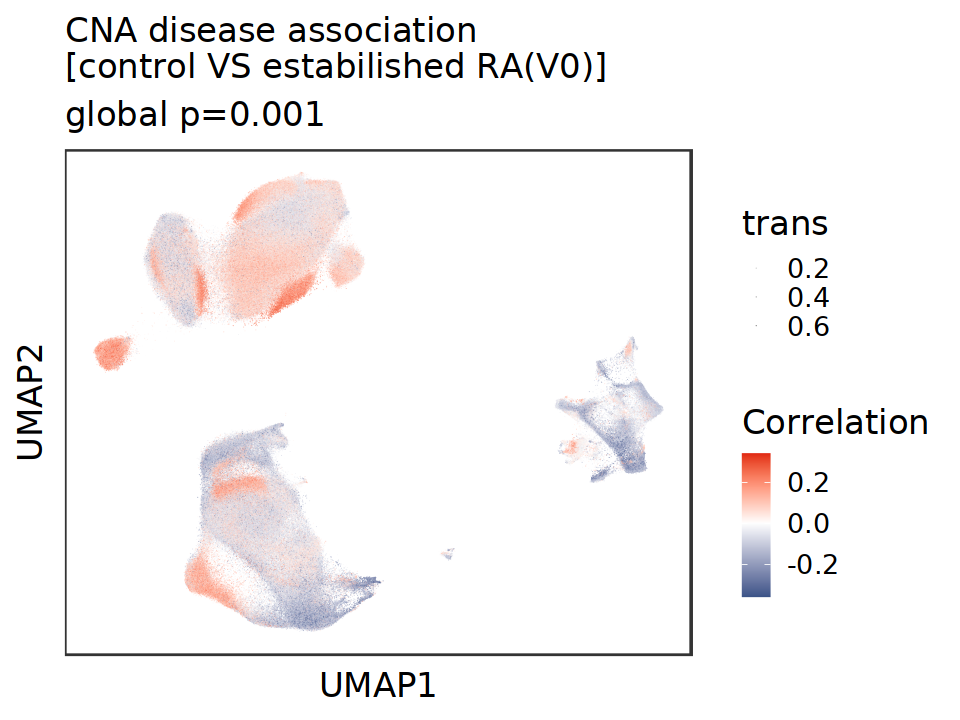

In [37]:
# Control vs RA(baseline)

logi = (obj$condition %in% c("RA","Control")) & (obj$time_point == "V0")
obj_sub = readRDS(paste0("/pl/active/fanzhanglab/jinamo/cytof/data/NK_cells/SeuratObj_Control_RAV0_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
# obj_sub = readRDS(paste0("/scratch/alpine/jinamo@xsede.org/NK_cells/SeuratObj_Control_RAV0_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
# positive correlation means association with estabilished RA
options(repr.plot.height = 6, repr.plot.width = 8)
cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs)) %>%
    dplyr::mutate(trans = abs(cna_ncorrs)*2) %>%
    ggplot(aes(x = UMAP1, y = UMAP2)) +
       geom_point(
         aes(color = cna_ncorrs, alpha = trans),
           size = 0.001, stroke = 0, shape = 16
       ) +
       scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab"  ) +
       labs(
         x = "UMAP1",
         y = "UMAP2",
         title = 'CNA disease association\n[control VS estabilished RA(V0)]', 
         color = 'Correlation',
         subtitle = sprintf('global p=%0.3f', obj_sub@reductions$cna@misc$p)
       ) +
       theme_bw(base_size = 20) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=20)
       )


,cluster,size,model.pvalue,conditionRA.OR,conditionRA.OR.95pct.ci.lower,conditionRA.OR.95pct.ci.upper
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
cluster0,cluster0,367059,2.167996e-01,1.1600707,1.0712904,1.2562084
cluster1,cluster1,181336,9.955881e-01,0.9991520,0.8353835,1.1950255
cluster10,cluster10,17194,2.388772e-01,1.5660085,1.2758722,1.9221225
cluster11,cluster11,7380,4.642046e-02,0.6813122,0.5617108,0.8263795
cluster12,cluster12,6864,2.956844e-01,1.2420870,0.9650101,1.5987192
cluster13,cluster13,4949,1.917834e-01,4.4832657,3.1558824,6.3689547
cluster14,cluster14,4794,9.360934e-05,0.3610717,0.1986849,0.6561784
cluster15,cluster15,3731,1.656494e-01,0.6499985,0.4791942,0.8816843
cluster16,cluster16,4014,7.485913e-01,1.0492403,0.8390123,1.3121443


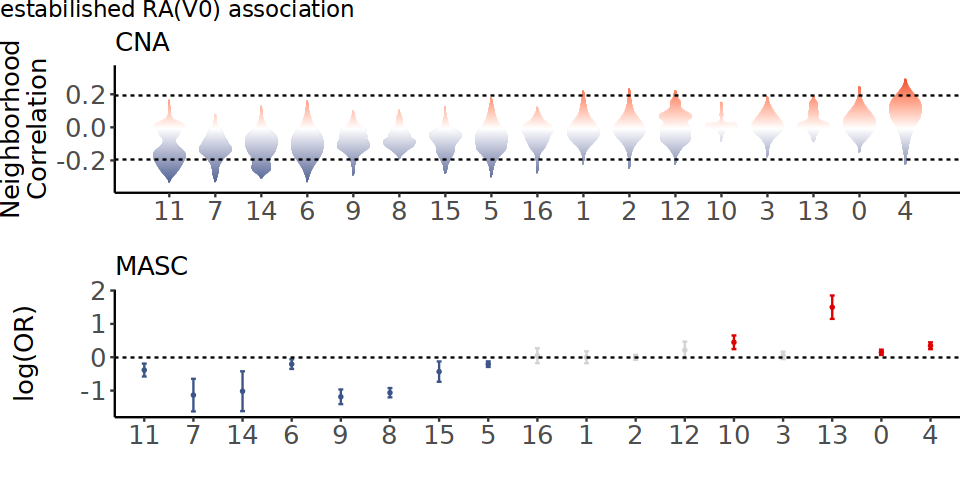

In [38]:
cor_pos = obj_sub@meta.data$cna_ncorrs_fdr05
cor_pos = cor_pos[cor_pos > 0]
# summary(cor_pos)
cor_neg = obj_sub@meta.data$cna_ncorrs_fdr05
cor_neg = cor_neg[cor_neg < 0]
# summary(cor_neg)

ord = cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs,res_cell)) %>%
    dplyr::group_by(res_cell) %>%
    dplyr::summarize(med = median(cna_ncorrs)) %>%
    dplyr::arrange(med) %>%
    .$res_cell

p <- cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs,res_cell)) %>%
    dplyr::mutate(res_cell = factor(res_cell,levels=ord)) %>%
    ggplot(aes(x=res_cell, y=cna_ncorrs)) + 
    geom_violin(trim=TRUE, scale = "width")

mywidth <- .35 # bit of trial and error
# This is all you need for the fill: 
vl_fill <- data.frame(ggplot_build(p)$data) %>%
  mutate(xnew = x- mywidth*violinwidth, xend = x+ mywidth*violinwidth) 

# Bit convoluted for the outline, need to be rearranged: the order matters
vl_poly <- 
  vl_fill %>% 
  select(xnew, xend, y, group) %>%
  pivot_longer(-c(y, group), names_to = "oldx", values_to = "x") %>% 
  arrange(y) %>%
  split(., .$oldx) %>%
  map(., function(x) {
    if(all(x$oldx == "xnew")) x <- arrange(x, desc(y))
    x
    }) %>%
  bind_rows()

if (length(cor_pos)!=0 & length(cor_neg)!=0) {
  g1 = ggplot() +
    geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
    geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
    scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
    scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
    geom_hline(yintercept=c(min(cor_pos), max(cor_neg)), linetype='dashed', color='black') +
    theme_classic() +
    theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "none",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size =15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) +
    labs(title = "CNA",
         x = "",
         y = "Neighborhood\nCorrelation") 
} else if (length(cor_pos)!=0 & length(cor_neg)==0) {
  g1 = ggplot() +
    geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
    geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
    scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
    scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
    geom_hline(yintercept=c(min(cor_pos)), linetype='dashed', color='black') +
    theme_classic() +
    theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "none",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size =15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) +
    labs(title = "CNA",
         x = "",
         y = "Neighborhood\nCorrelation") 
} else if (length(cor_pos)==0 & length(cor_neg)!=0) {
  g1 = ggplot() +
    geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
    geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
    scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
    scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
    geom_hline(yintercept=c(min(cor_neg)), linetype='dashed', color='black') +
    theme_classic() +
    theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "none",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size =15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) +
    labs(title = "CNA",
         x = "",
         y = "Neighborhood\nCorrelation") 
} else if (length(cor_pos)==0 & length(cor_neg)==0) {
  g1 = ggplot() +
    geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
    geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
    scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
    scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
    theme_classic() +
    theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "none",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size =15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) +
    labs(title = "CNA",
         x = "",
         y = "Neighborhood\nCorrelation") 
}

# MASC: Mixed-effects association testing for single cells
## Sci Transl Med. 2018 Oct 17;10(463):eaaq0305.

masc = readRDS(file = paste0("/projects/jinamo@xsede.org/cytof/data/NK_cells/MASC_Control_RAV0_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
# masc = readRDS(file = paste0("/scratch/alpine/jinamo@xsede.org/NK_cells/MASC_Control_RAV0_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
masc
g2 = masc %>%
  magrittr::set_colnames(c("cluster","size","model.pvalue","OR","CIlower","CIupper")) %>%
    dplyr::mutate(col = dplyr::case_when(
      CIupper < 1 ~ '#3C5488FF',
      CIlower > 1 ~ '#DC0000FF',
      TRUE ~ "lightgray"),
                 CIupper = ifelse(CIupper>100 & model.pvalue>0.05, 1, CIupper),
                 CIlower = ifelse(CIlower<0.01 & model.pvalue>0.05, 1, CIlower),
                 OR = ifelse(CIupper==1|CIlower==1,1,OR)) %>%
  dplyr::mutate(cluster = gsub("cluster","",cluster),
                cluster = factor(cluster,levels=ord)) %>%
  ggplot(., aes(y=cluster, x=log(OR), colour=col)) + 
  geom_point(position=position_dodge(width=0.3), size=0.5) +
  geom_errorbarh(aes(xmin=log(CIlower), xmax=log(CIupper)), position = position_dodge(0.3), height=0.1) +
  scale_color_manual(values = c('#3C5488FF' = '#3C5488FF', '#DC0000FF' = '#DC0000FF', "lightgray" = "lightgray")) + 
  geom_vline(xintercept=0, linetype='dashed', color='black') +
  theme_classic() +
  coord_flip() +
  theme(strip.text.x=element_text(size=15, color="black", face="bold"),
        strip.text.y=element_text(size=15, color="black", face="bold"),
        legend.position = "none",
        plot.title = element_text(size=15),
        axis.title.x = element_text(size=15),
        axis.title.y = element_text(size =15),
        axis.text.y = element_text(size = 15),
        axis.text.x = element_text(size = 15),
        legend.text =  element_text(size = 15),
        legend.key.size = grid::unit(0.5, "lines"),
        legend.title = element_text(size = 0.8, hjust = 0)) +
  labs(title = "MASC",
       y = "",
       x = "log(OR)")

options(repr.plot.height = 4, repr.plot.width = 8)
(g1/guide_area()/g2) + 
    plot_layout(heights = c(3,0,3),guides = "collect") +
    plot_annotation(title = 'estabilished RA(V0) association')& theme(plot.margin = unit(c(0,0,0,0), "cm"))